# Data Quality Monitor

In [1]:
'''
Load package. 

Try run this script in analysis directory.
'''

import uproot
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.fft import fft, fftfreq, rfft, rfftfreq
import os
import sys
import glob
from datetime import datetime
from numpy import array, isscalar, uint16, uint32
import pandas as pd
from iminuit import Minuit
from numpy import sqrt 
from scipy.stats import norm
import statistics
import uproot
import types
from mpl_toolkits.mplot3d import Axes3D

In [2]:
# define constants
ADC_TO_MV=2000/(2**14-1)
SAMPLE_TO_NS = 2

In [3]:
"""
OPTIONAL:
    enable interactive plotting. It requires ipympl to be installed. Try: 
        pip install ipympl
    
    Alternative, if you have created a virtual enviroment suggested in README, try:
        source env/bin/activate
"""
#%matplotlib widget

'\nOPTIONAL:\n    enable interactive plotting. It requires ipympl to be installed. Try: \n        pip install ipympl\n    \n    Alternative, if you have created a virtual enviroment suggested in README, try:\n        source env/bin/activate\n'

In [4]:
# define path to your muon file
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/src/data_30ton/3pmt_test_240501T1533_3.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/src/data_30ton/3pmt_test_240425T1618_3.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/src/data_30ton/3pmt_test_240509T1814_41.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/src/data_30ton/3pmt_test_240513T1859_3yy.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/src/data_30ton/all_pmt_test_240614T1712_0.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/all_pmt_test_240621T1106_0.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/all_pmt_test_240624T1721_0.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/all_pmt_test_240624T1734_0.root'
#fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/light_leak_test_light_off_240703T150.root'

## Look at the waveform of an individual event using EventDisplay

In [5]:
# import EventDisplay
import sys
sys.path.append("/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/tools")

# define enviromental variables
%env SOURCE_DIR=../src
%env YAML_DIR=../yaml
from event_display import EventDisplay

# veiw waveform using EventDisplay
#dp = EventDisplay(fpath, '/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/yaml/config_30t.yaml')

env: SOURCE_DIR=../src
env: YAML_DIR=../yaml


In [6]:
dp.fig_height=10
dp.fig_width=20
schn = [[]*i for i in range(97)]
h_hodo = [[]*i for i in range(4)]
ichn = 0
hevt = 0
print('starting')

NameError: name 'dp' is not defined

chg length  36
12   12   12
24   24   36
area values:   [200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200]
area2 values:  [200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200, 200]


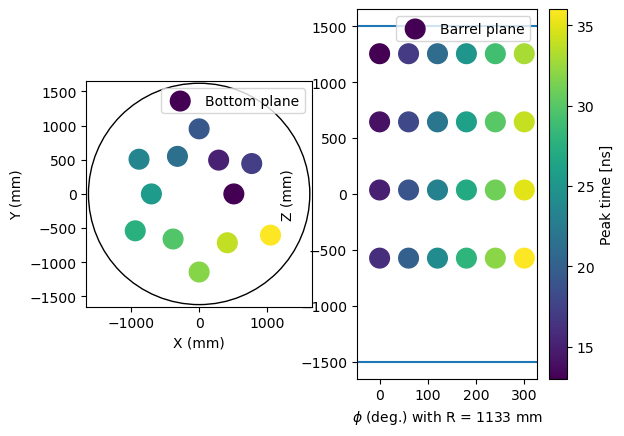

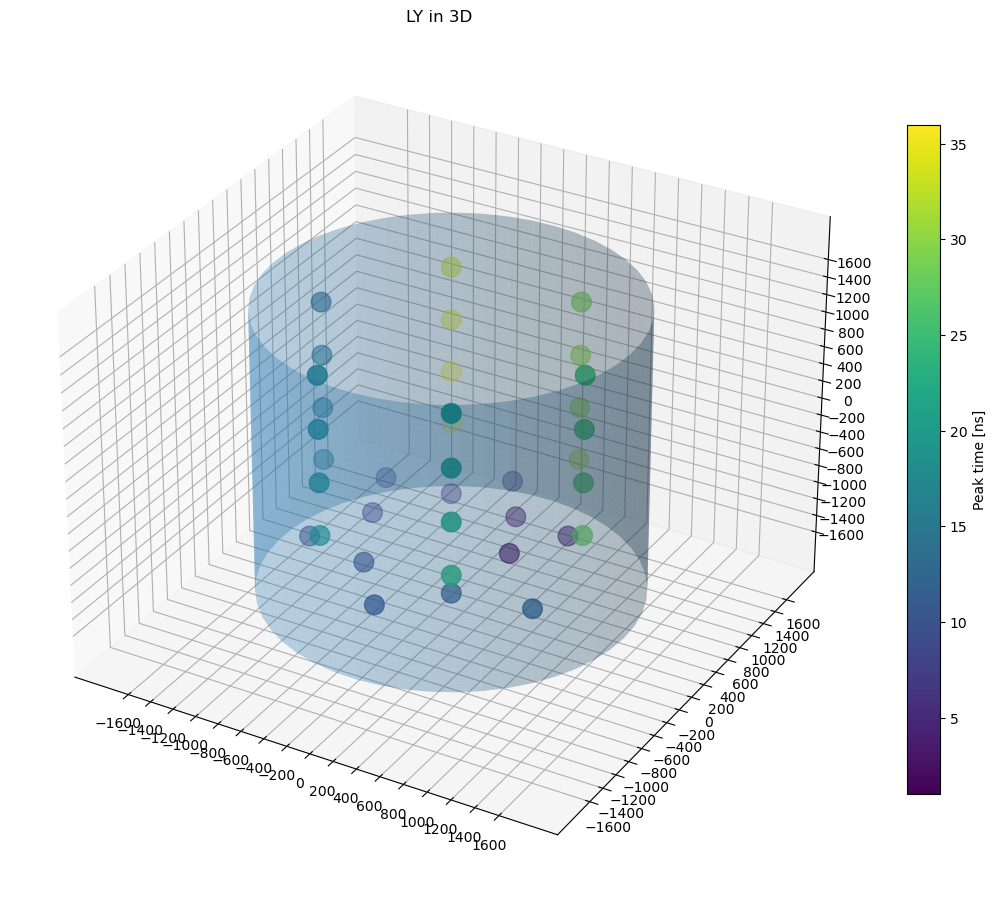

In [7]:
from sympy import plot_implicit
from sympy.abc import X, Y

event_start_time=-1
event_end_time=-1
# define path to your raw root file
#DATA_DIR='/home/guang/work/bnl1t/drop/src'
ch_string = ""
hodo_len = 20

for i in range(15):
    ch_string += "adc_b1_ch{} ".format(i+1)
for i in range(15):
    ch_string += "adc_b2_ch{} ".format(i)
    
#print (ch_string)    

#for word in ch_string.split():
#    print (word)
def data_for_cylinder_along_z(center_x,center_y,radius,height_z):
    z = np.linspace(-height_z, height_z, 50)
    theta = np.linspace(0, 2*np.pi, 50)
    theta_grid, z_grid=np.meshgrid(theta, z)
    x_grid = radius*np.cos(theta_grid) + center_x
    y_grid = radius*np.sin(theta_grid) + center_y
    return x_grid,y_grid,z_grid

def display_charge(chg, hchg, atime, ievt, isavefig):
    dis_x=[]
    dis_y=[]
    area=[]
    area2=[]
    area3=[]
    colo=[]
    colo2=[]
    locx_bot = [508.000, 285.800, 769.900, 0.000, -317.500, -879.900, -698.500, -934.900, -381.000, 0.000, 412.800, 1044.900
               ]
    locy_bot = [0.000, 494.900, 444.500, 952.500, 549.900, 508.000, 0.000, -539.800, -659.900, -1143.000, -714.900, -603.300]
    locx_side= [-1133.5, -1133.5, -1133.5, -1133.5, -566.75, -566.75, -566.75, -566.75, 566.75, 566.75, 566.75, 566.75, 1133.5, 1133.5, 1133.5, 1133.5, 566.75, 566.75, 566.75, 566.75, -566.75, -566.75, -566.75, -566.75]
    locy_side= [0.0, 0.0, 0.0, 0.0, -981.64, -981.64, -981.64, -981.64, -981.64, -981.64, -981.64, -981.64, 0.0, 0.0, 0.0, 0.0, 981.64, 981.64, 981.64, 981.64, 981.64, 981.64, 981.64, 981.64]
    locz_side= [1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45]

    locx_3d = [ 508.000, 285.800, 769.900, 0.000, -317.500, -879.900, -698.500, -934.900, -381.000, 0.000, 412.800, 1044.900,
              -1133.5, -1133.5, -1133.5, -1133.5, -566.75, -566.75, -566.75, -566.75, 566.75, 566.75, 566.75, 566.75, 1133.5, 1133.5, 1133.5, 1133.5, 566.75, 566.75, 566.75, 566.75, -566.75, -566.75, -566.75, -566.75]
    locy_3d = [0.000, 494.900, 444.500, 952.500, 549.900, 508.000, 0.000, -539.800, -659.900, -1143.000, -714.900, -603.300,
              0.0, 0.0, 0.0, 0.0, -981.64, -981.64, -981.64, -981.64, -981.64, -981.64, -981.64, -981.64, 0.0, 0.0, 0.0, 0.0, 981.64, 981.64, 981.64, 981.64, 981.64, 981.64, 981.64, 981.64]
    locz_3d = [ -1035.950, -1035.950, -1035.950, -1035.950, -1035.950, -1035.950, -1035.950, -1035.950, -1035.950, -1035.950, -1035.950, -1035.950,
              1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45, 1254.35, 644.75, 35.15, -574.45]

    fig, (ax1, ax2) = plt.subplots(1, 2)
    plt.rcParams['figure.figsize'] = [16, 4]
    print ('chg length ',len(chg))
    for i in range(len(chg)):
        if i < 12:
            area.append(chg[i]*50)
            area3.append(chg[i]*50)
            colo.append(atime[i])
        elif i < 20+16:
            if i>11 and i<16:
                dis_x.append(0)
            if i>15 and i<20:
                dis_x.append(60)
            if i>19 and i<24:
                dis_x.append(120)
            if i>23 and i<28:
                dis_x.append(180)
            if i>27 and i<32:
                dis_x.append(240)
            if i>31 and i< 36:
                dis_x.append(300)
            dis_y.append(locz_side[i-12])
            area2.append(chg[i]*50)
            area3.append(chg[i]*50)
            colo2.append(atime[i])
    print(len(locx_bot),' ',len(locy_bot),' ',len(area))
    print(len(dis_x),' ',len(dis_y),' ',len(area3))
    print('area values:  ',area)
    print('area2 values: ',area2)
    sc1 = ax1.scatter(locx_bot, locy_bot, s=area, c=colo, alpha=1, label="Bottom plane")
    #ax1.colorbar(sc1, label="Peak time [ns]")
    sc2 = ax2.scatter(dis_x, dis_y, s=area2, c=colo2, alpha=1, label="Barrel plane")
    plt.colorbar(sc2, label="Peak time [ns]")
    ax1.set_xlabel("X (mm)")
    ax1.set_ylabel("Y (mm)")
    ax2.set_xlabel("$\phi$ (deg.) with R = 1133 mm")
    ax2.set_ylabel("Z (mm)")
    ax1.legend(loc='upper right')
    ax2.legend(loc='upper right')

    Drawing_uncolored_circle = plt.Circle( (0, 0 ),
                                          1620 ,
                                          fill = False )
     
    ax1.set_aspect( 1 )
    ax1.add_artist( Drawing_uncolored_circle )
    ax1.set_xlim(-1650,1650)
    ax1.set_ylim(-1650,1650)

    linepos = 1503
    plt.axline((-30, -linepos), (310, -linepos))
    plt.axline((-30, linepos), (310, linepos))
    if isavefig == True:
        plt.savefig('event_display_2d_{}.png'.format(ievt))
    plt.show()

    fig = plt.figure(figsize=(12,12))
    # syntax for 3-D projection
    #ax = Axes3D(fig)
    ax = plt.axes(projection ='3d')
     
    # defining axes
    z = np.linspace(0, 1, 100)
    x = z * np.sin(25 * z)
    y = z * np.cos(25 * z)
    c = x + y
    ax.set_xticks([-1600,-1400,-1200,-1000,-800,-600,-400,-200,0,200,400,600,800,1000,1200,1400,1600])
    ax.set_yticks([-1600,-1400,-1200,-1000,-800,-600,-400,-200,0,200,400,600,800,1000,1200,1400,1600])
    ax.set_zticks([-1600,-1400,-1200,-1000,-800,-600,-400,-200,0,200,400,600,800,1000,1200,1400,1600])
    ax.axes.set_xlim3d(left=-2000, right=2000) 
    ax.axes.set_ylim3d(bottom=-2000, top=2000) 
    ax.axes.set_zlim3d(bottom=-2000, top=2000) 
    sc3 = ax.scatter(locx_3d, locy_3d, locz_3d, s=area3, c = atime)
    Xc,Yc,Zc = data_for_cylinder_along_z(0,0,1503,1625)
    ax.plot_surface(Xc, Yc, Zc, alpha=0.3)
    plt.colorbar(sc3, label="Peak time [ns]", fraction=0.036, pad=0.04)

    #i1 = -1;
    #i2 = -1;
    #i3 = -1;
    #i4 = -1;
    #for i in range(8):
    #    if (chg[i] > 0.5):
    #        i1 = i
    #for i in range(8):
    #    if (chg[i+8] > 0.5):
    #        i2 = i
    #for i in range(8):
    #    if (chg[i+16] > 0.5):
    #        i3 = i
    #for i in range(8):
    #    if (chg[i+24] > 0.5):
    #        i4 = i
            
    #radius is 500.38 mm
    #VecStart_x = (620-500.38) + (7-i2)*hodo_len + hodo_len/2.;
    #VecStart_y = (500.38 - 490) + i1*hodo_len + hodo_len/2.;
    #VecStart_z = 941;
    #VecEnd_x = (500-500.38) + (7-i4)*hodo_len + hodo_len/2;
    #VecEnd_y = (500.38 - 400) + i3*hodo_len + hodo_len/2;
    #VecEnd_z = -941;
    #ax.plot([VecStart_x, VecEnd_x], [VecStart_y,VecEnd_y],[VecStart_z,VecEnd_z], 'r--', linewidth=3) 
     
    # syntax for plotting
    ax.set_title('LY in 3D')
    if isavefig == True:
        plt.savefig('event_display_3d_{}.png'.format(ievt))
    plt.show()

evt_chg = 36*[4]
hodo_chg = []
atime = []
for mm in range(36):
    atime.append(mm+1)
display_charge(evt_chg, hodo_chg, atime,-1, True)

current time 2024-10-25 11:22:06.144279
<re.Match object; span=(71, 82), match='240814T1719'>
Index(['adc_b1_ch0', 'adc_b1_ch1', 'adc_b1_ch2', 'adc_b1_ch3', 'adc_b1_ch4',
       'adc_b1_ch5', 'adc_b1_ch6', 'adc_b1_ch7', 'adc_b1_ch8', 'adc_b1_ch9',
       'adc_b1_ch10', 'adc_b1_ch11', 'adc_b1_ch12', 'adc_b1_ch13',
       'adc_b1_ch14', 'adc_b1_ch15', 'adc_b2_ch0', 'adc_b2_ch1', 'adc_b2_ch2',
       'adc_b2_ch3', 'adc_b2_ch4', 'adc_b2_ch5', 'adc_b2_ch6', 'adc_b2_ch7',
       'adc_b2_ch8', 'adc_b2_ch9', 'adc_b2_ch10', 'adc_b2_ch11', 'adc_b2_ch12',
       'adc_b2_ch13', 'adc_b2_ch14', 'adc_b2_ch15', 'adc_b3_ch0', 'adc_b3_ch1',
       'adc_b3_ch2', 'adc_b3_ch3', 'adc_b3_ch4', 'adc_b3_ch5', 'adc_b3_ch6',
       'adc_b3_ch7', 'adc_b3_ch8', 'adc_b3_ch9', 'adc_b3_ch10', 'adc_b3_ch11',
       'adc_b3_ch12', 'adc_b3_ch13', 'adc_b3_ch14', 'adc_b3_ch15',
       'adc_b3_ch16', 'adc_b3_ch17', 'adc_b3_ch18', 'adc_b3_ch19',
       'adc_b3_ch20', 'adc_b3_ch21', 'adc_b3_ch22', 'adc_b3_ch23',
       'adc_

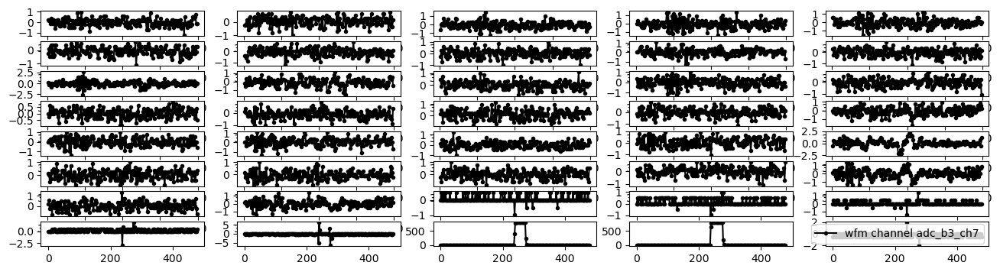

<Figure size 1600x400 with 0 Axes>

chg set to be  [-0.044761846629636406, 0.09901863042313508, -0.12885986150955936, -0.17633454732887072, -0.06917739933671083, -0.15056257502695883, -0.1112264067766723, 0.05968246217284856, 0.061038881767686015, -0.06646456014703588, -0.1519189946217963, -0.267214660182981, 0.020346293922562007, -0.04611826622447388, -0.07189023852638575, 0.048831105414148805, -0.19803726084627016, 0.2685710797778184, 4.934324553889585e-18, -0.16683961016500842, -0.01220777635353721, 0.15327541421663377, 0.004069258784512401, 0.14038942806567786, 0.16412677097533349, 0.10851356758699736, -0.1681960297598459, -0.020346293922562004, -0.01220777635353721, 0.004069258784512404, 0.10444430880248495, 0.021702713517399493, 0.2442002442002442, 0.4775471442138108, 0.271333604666938, 0.6132139465472799]
chg length  36
12   12   12
24   24   36
area values:   [-2.23809233148182, 4.950931521156754, -6.442993075477968, -8.816727366443535, -3.4588699668355414, -7.528128751347942, -5.561320338833615, 2.98412310864242

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


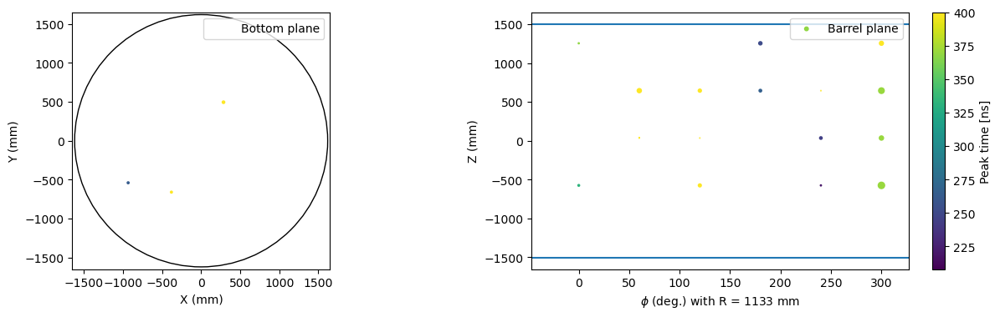

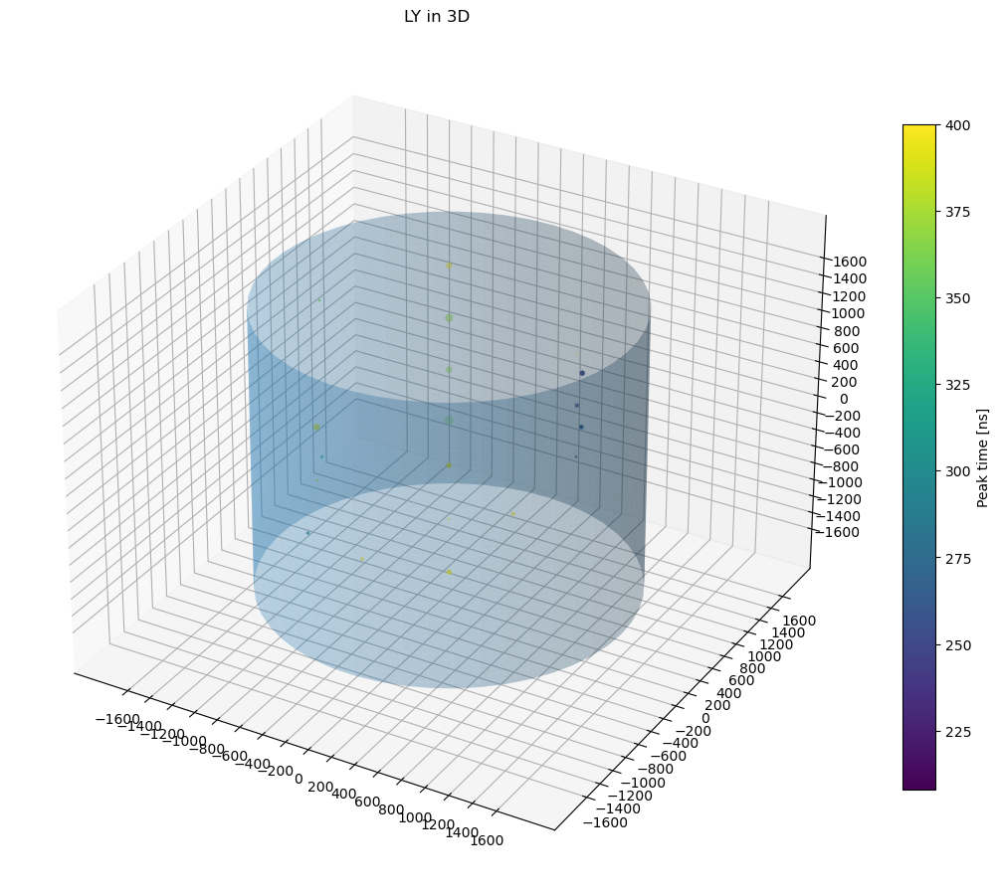

standard deviation 4.0708450248951396
standard deviation 1.8233471516673767
standard deviation 5.133002542017774
standard deviation 2.9664694520465233
standard deviation 1.0635927677555206
standard deviation 2.6778348769399085
standard deviation 1.216952493021677
standard deviation 1.122879064251703
standard deviation 3.285821931612975
standard deviation 2.8425289126622024
standard deviation 5.953744115273374
standard deviation 3.8981402479065625
standard deviation 0.681796222475962
standard deviation 1.0608818247228626
standard deviation 1.9514889897234955
standard deviation 1.1706308040354978
standard deviation 1.3870539472554186
standard deviation 1.2757872305383984
standard deviation 1.207816698118378
standard deviation 0.8659475531479662
standard deviation 1.6031480032913497
standard deviation 1.4959951769784878
standard deviation 2.4306762515062044
standard deviation 0.412216023566739
standard deviation 0.46303217655083856
standard deviation 0.6744709183018066
standard deviation 

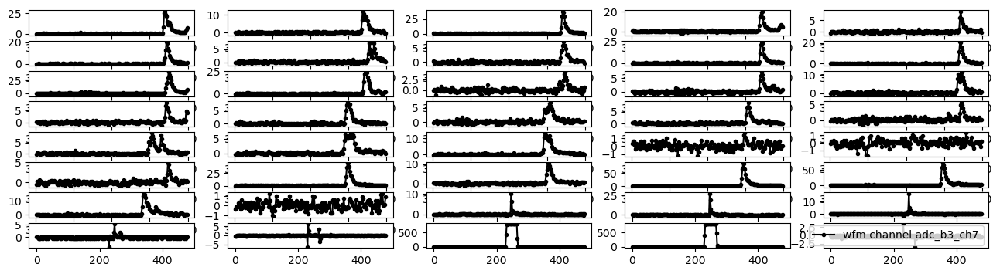

<Figure size 1600x400 with 0 Axes>

chg set to be  [2.6545131470969237, 1.2438367684659575, 2.7684523930632703, 2.078034819290999, 0.34317415749387925, 1.418814896199991, 0.8586136035321167, 0.48017253657246334, 1.6778910388139474, 1.3998250218722663, 3.590442667534774, 2.1865483868779974, 0.23737342909655676, 0.6307351115994222, 1.4500125468812526, 0.7256844832380449, 0.7921490433850807, 0.9711964299036263, 0.9399987792223647, 0.5079791382666314, 1.4201713157948284, 1.1692336907498968, 1.7904738651854564, 0.16683961016500845, 0.006782097974187352, 0.09088011285411023, 4.196762226427123, 1.053938025188712, 7.454882093226719, 6.251737912605885, 1.76741473207322, 0.0949493716386227, 0.6457739791073124, 0.17365350698684057, 0.6294939628272961, -0.293040293040293]
chg length  36
12   12   12
24   24   36
area values:   [132.7256573548462, 62.191838423297874, 138.4226196531635, 103.90174096454996, 17.158707874693963, 70.94074480999954, 42.93068017660583, 24.008626828623168, 83.89455194069737, 69.99125109361331, 179.5221333767

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


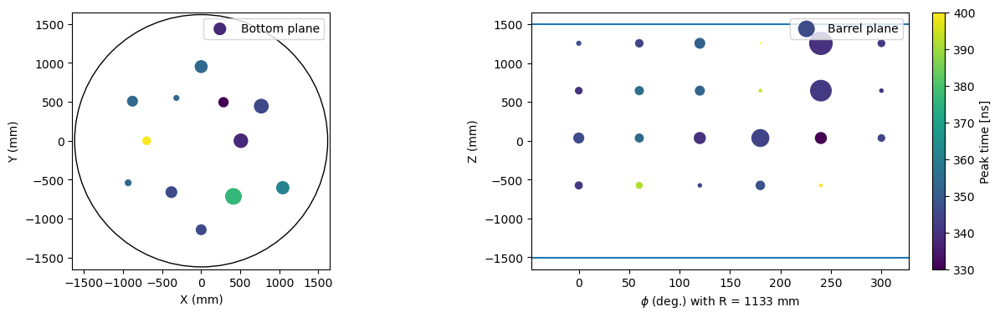

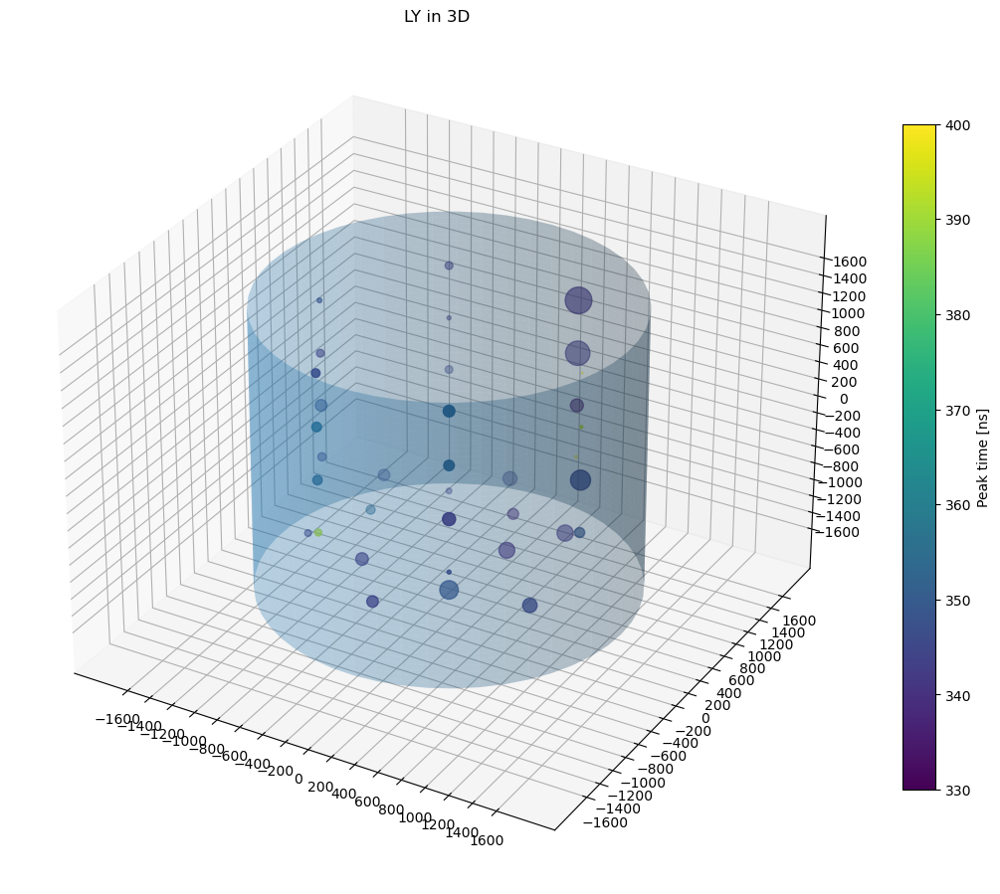

selected one with peak value:  233.77891717023746
standard deviation 4.081741790925391
standard deviation 13.652782553478612
standard deviation 9.504702061931956
standard deviation 2.899593549831865
standard deviation 8.94006256211373
standard deviation 5.930210454558958
standard deviation 12.481774194861964
standard deviation 11.033730217892124
standard deviation 5.672762381335333
standard deviation 3.270819054896794
standard deviation 6.711169900872209
standard deviation 7.251193751596289
standard deviation 3.165726627919238
standard deviation 4.310925578462073
standard deviation 6.673526649698113
standard deviation 3.103905269365662
standard deviation 3.6676939999640146
standard deviation 5.8031540978703395
standard deviation 4.309302083061741
standard deviation 4.347176467187053
standard deviation 1.6130704161481582
standard deviation 2.1316345099439804
standard deviation 5.428827632662547
standard deviation 5.416189473199699
standard deviation 5.170116063470749
standard deviation 

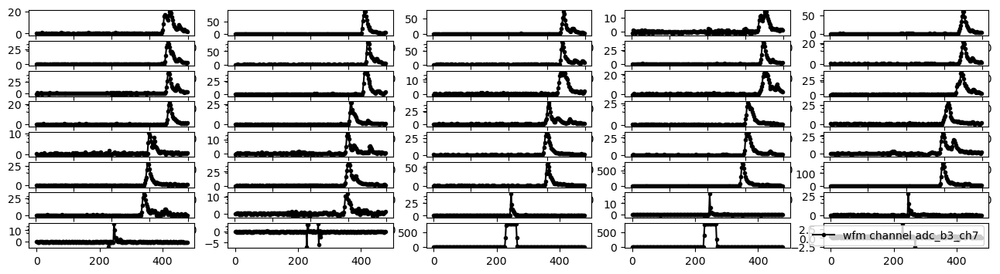

<Figure size 1600x400 with 0 Axes>

chg set to be  [3.0573697667636495, 8.487117404898031, 6.322271731537435, 2.0156395179284767, 5.813614383473384, 4.154713218987162, 7.9662522804804405, 7.366714819562282, 3.641986612138598, 2.1133017287567744, 4.291711598065746, 4.615895881231901, 2.5175147680183394, 3.130616424884874, 4.876328443440694, 1.6616140036758975, 2.327616024741094, 4.640311433938974, 3.1211214877210107, 2.9624203951250276, 1.1936492434569712, 1.6344856117791478, 3.7722028932429947, 3.9336168250286545, 4.51959008999844, 2.924440646469579, 5.247987412426158, 5.583023052351013, 69.70233371991293, 18.132617143787257, 3.309663811403418, 1.3306476225355552, 1.6008682675349342, 0.8899742233075563, 1.1070411070411068, -0.21164021164021168]
chg length  36
12   12   12
24   24   36
area values:   [152.8684883381825, 424.35587024490155, 316.11358657687174, 100.78197589642383, 290.6807191736692, 207.73566094935808, 398.312614024022, 368.3357409781141, 182.0993306069299, 105.66508643783872, 214.58557990328728, 230.794794

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


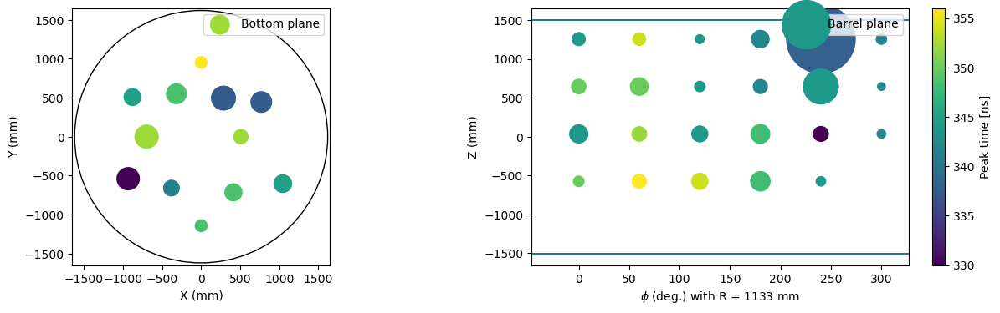

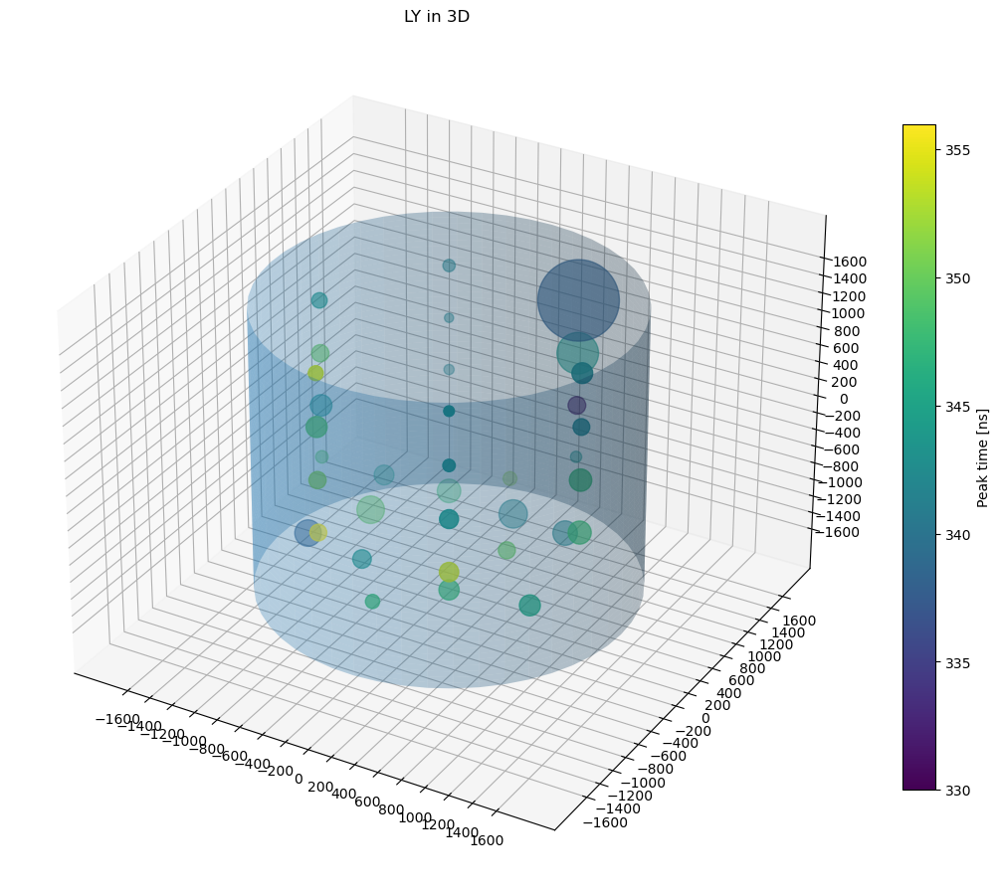

selected one with peak value:  528.8408716352318
standard deviation 63.82941015861315
standard deviation 51.152929235368624
standard deviation 56.974927264991564
standard deviation 35.32198157482751
standard deviation 52.7056335885162
standard deviation 53.25790501449112
standard deviation 39.680515179879315
standard deviation 44.892315330170575
standard deviation 32.4268207121846
standard deviation 23.04456996621746
standard deviation 18.859708653204873
standard deviation 15.649605743910891
standard deviation 1.895858852241076
standard deviation 3.1340309120852576
standard deviation 7.757790994021973
standard deviation 9.357464633377138
standard deviation 0.6353859506032097
standard deviation 3.6914460618270097
standard deviation 6.131228028124696
standard deviation 16.1358398504913
standard deviation 1.7040721697533727
standard deviation 1.273236370741715
standard deviation 4.519997400781703
standard deviation 12.724900251418934
standard deviation 1.0676364060971932
standard deviatio

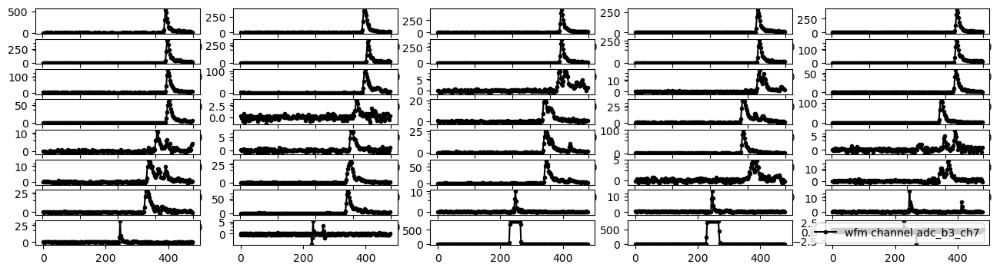

<Figure size 1600x400 with 0 Axes>

chg set to be  [38.90889607791274, 31.42281633400477, 34.22110995815446, 21.857345351210938, 31.28717437452101, 32.278717098347194, 23.387386654187605, 26.781148480470947, 19.963783596817837, 15.545924976432214, 11.227084986469716, 11.229797825659391, 1.5639517928475999, 2.172984190929622, 4.5941931677145, 6.268014947743935, 0.33096638114034194, 2.9298663248489283, 5.591161569920039, 10.508182601205856, 1.4120327982258032, 0.7907926237902435, 3.8590137473125923, 8.458632593406442, 0.8748906386701664, 2.4442681098971155, 3.528047366172251, 8.80858884887451, 0.6008938805129979, 2.078034819291, 3.9186962094854425, 8.171071639300902, 0.586080586080586, 1.0853344186677518, 0.7597340930674263, 0.13566680233346906]
chg length  36
12   12   12
24   24   36
area values:   [1945.444803895637, 1571.1408167002385, 1711.0554979077228, 1092.867267560547, 1564.3587187260505, 1613.9358549173596, 1169.3693327093802, 1339.0574240235474, 998.1891798408918, 777.2962488216107, 561.3542493234858, 561.489891

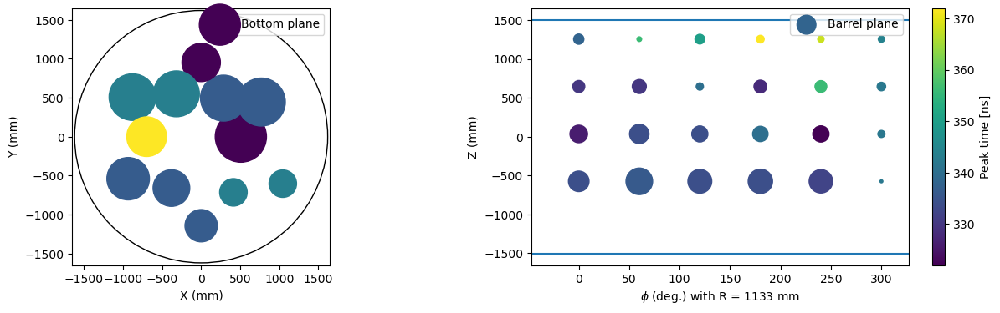

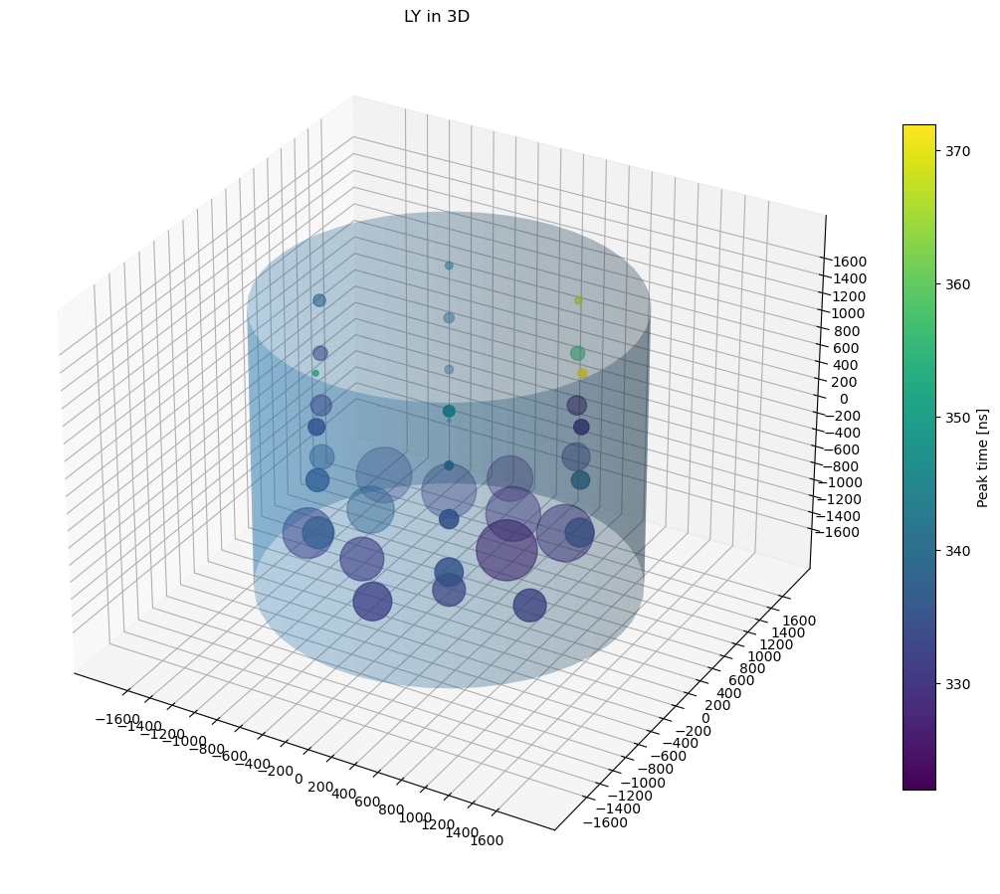

selected one with peak value:  3164.1335530733086
standard deviation 0.3496807381776543
standard deviation 0.36003027103117485
standard deviation 0.4039998493508853
standard deviation 0.6876068472185279
standard deviation 0.39618246789880546
standard deviation 0.3103348226673934
standard deviation 0.32428800323854656
standard deviation 0.33816736112699386
standard deviation 0.42683585850112993
standard deviation 0.329009265040994
standard deviation 0.7574282598706094
standard deviation 0.4103842482772946
standard deviation 0.3145935417238119
standard deviation 0.38733134188062973
standard deviation 0.5032381950472388
standard deviation 0.35674357789954375
standard deviation 0.34518886284529615
standard deviation 0.5064681063338861
standard deviation 0.3417715824504308
standard deviation 0.5629234407322543
standard deviation 0.41485419373293614
standard deviation 0.4475665712731134
standard deviation 0.35314723361926503
standard deviation 0.3421347560601843
standard deviation 0.54854364

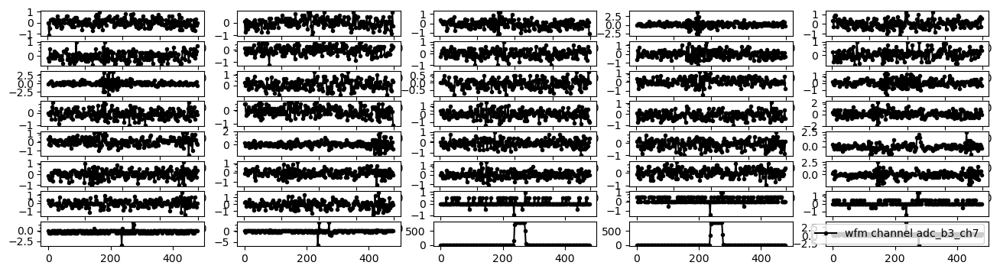

<Figure size 1600x400 with 0 Axes>

chg set to be  [0.09223653244894775, 0.04747468581931135, -0.16412677097533349, 0.32282786357131715, 0.06375172095736094, -2.4671622769447924e-18, -0.07595949731089814, -0.018989874327724525, 0.03933616825028654, 0.16412677097533349, 0.03526690946577414, 0.22652207233785696, -0.14378047705277153, 0.122077763535372, 0.16277035138049603, -0.1234341831302095, -0.15056257502695883, 0.025771972301911875, -0.13699837907858417, 0.19668084125143268, 0.08952369325927281, 0.06103888176768603, -0.1478497358372839, -0.1844730648978955, -0.06917739933671084, 0.061038881767685994, -0.09223653244894775, 0.024415552707074403, 0.06917739933671081, -0.062395301362523484, -0.03255407027609921, -0.11936492434569712, 0.2279202279202279, 0.5209605209605209, 0.3527336860670194, -0.5209605209605209]
chg length  36
12   12   12
24   24   36
area values:   [4.611826622447388, 2.3737342909655674, -8.206338548766674, 16.141393178565856, 3.187586047868047, -1.2335811384723962e-16, -3.7979748655449073, -0.949493716

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


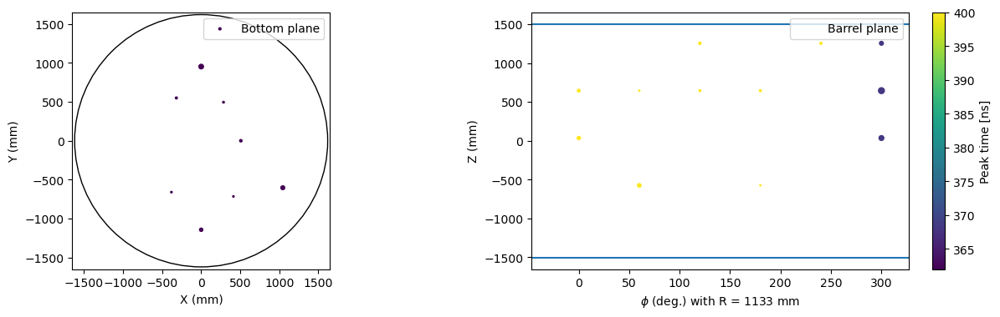

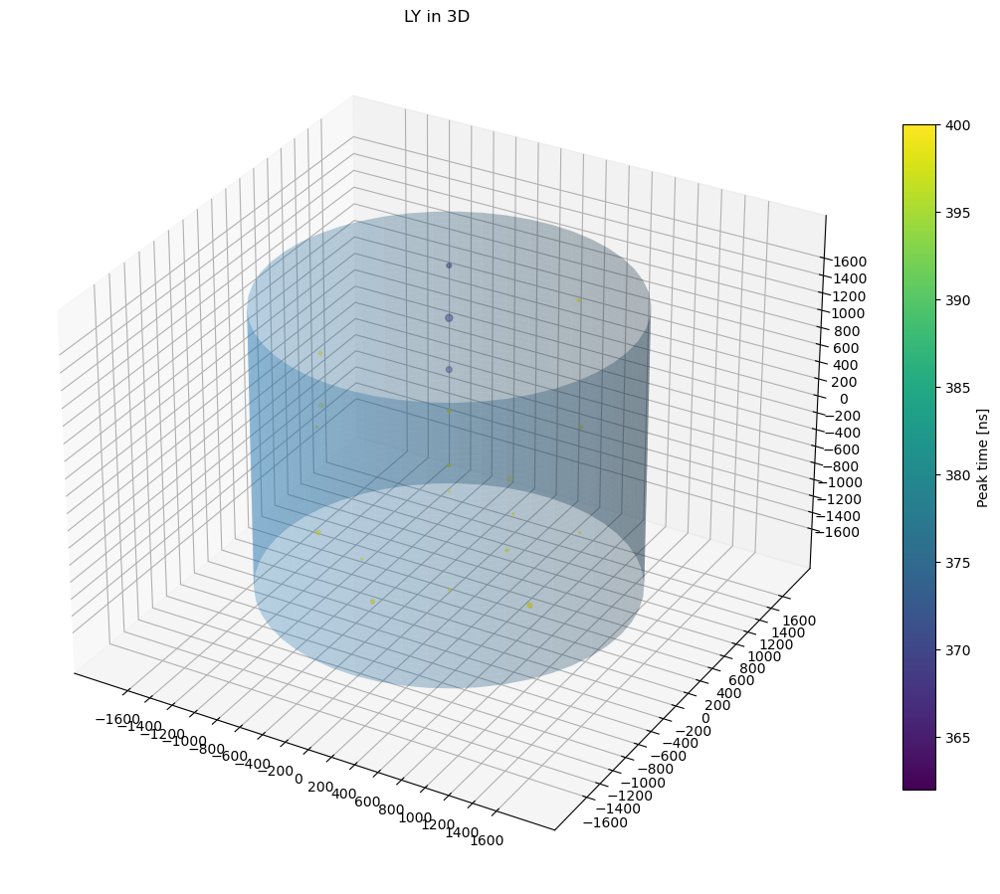

standard deviation 0.8719000398169298
standard deviation 1.2662476887134737
standard deviation 1.917173484801234
standard deviation 0.9880513673014273
standard deviation 1.729580912597588
standard deviation 0.31617696314955324
standard deviation 1.4097947227110716
standard deviation 1.8822834515858173
standard deviation 0.4063960294330327
standard deviation 0.7713517063751607
standard deviation 0.9049515065066556
standard deviation 0.5153213797594062
standard deviation 2.63480858169438
standard deviation 1.6102211803227544
standard deviation 0.8145403449440942
standard deviation 0.7282325946590475
standard deviation 1.2786005726703473
standard deviation 0.5119356380529745
standard deviation 0.8881484256691012
standard deviation 0.5325717623498316
standard deviation 0.43181296325539614
standard deviation 1.2158730817011605
standard deviation 0.36453128512901445
standard deviation 0.7308443152574096
standard deviation 0.5492779160321285
standard deviation 0.3791774078123334
standard devi

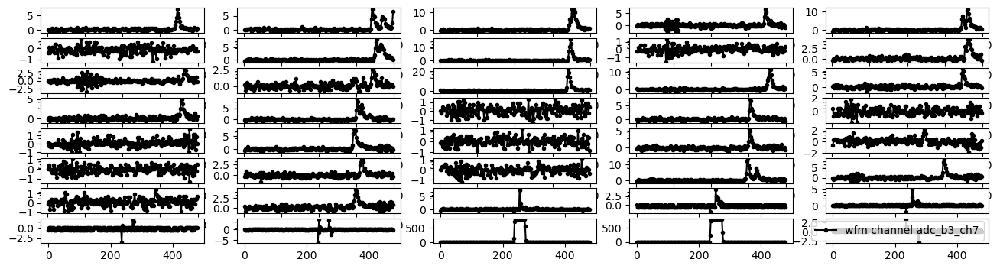

<Figure size 1600x400 with 0 Axes>

chg set to be  [0.5073009284692127, 0.9196524852998027, 1.1543130752066846, 0.16141393178565858, 0.8762470582650039, -0.26314540139846854, 0.8776034778598414, 0.7989311413592683, 0.052900364198661225, 0.6931304129619457, 0.12207776353537199, 0.26721466018298096, 1.2207776353537205, 0.8911676738082159, 0.453044144675714, 0.35673835344225385, 0.735179420401907, 0.14378047705277147, 0.6429428879529595, 0.05290036419866122, 0.16141393178565858, 0.6049631392975103, 0.014920615543212137, 0.18718590408757044, 0.11529566556118466, -0.16141393178565858, 0.2631454013984686, -0.05968246217284856, 1.104125550197698, 0.7907926237902435, 0.2685710797778185, 0.4828853757621383, 0.5046805046805046, -0.4992538325871658, 0.3744403744403745, -0.586080586080586]
chg length  36
12   12   12
24   24   36
area values:   [25.365046423460637, 45.982624264990136, 57.71565376033423, 8.070696589282928, 43.812352913250194, -13.157270069923428, 43.88017389299207, 39.94655706796342, 2.645018209933061, 34.65652064809

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


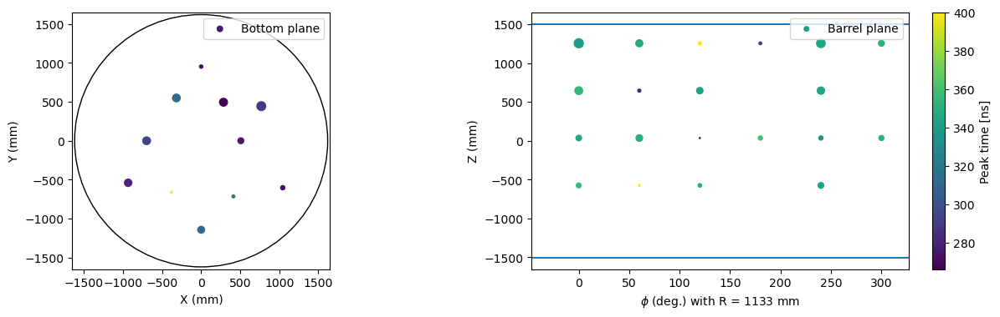

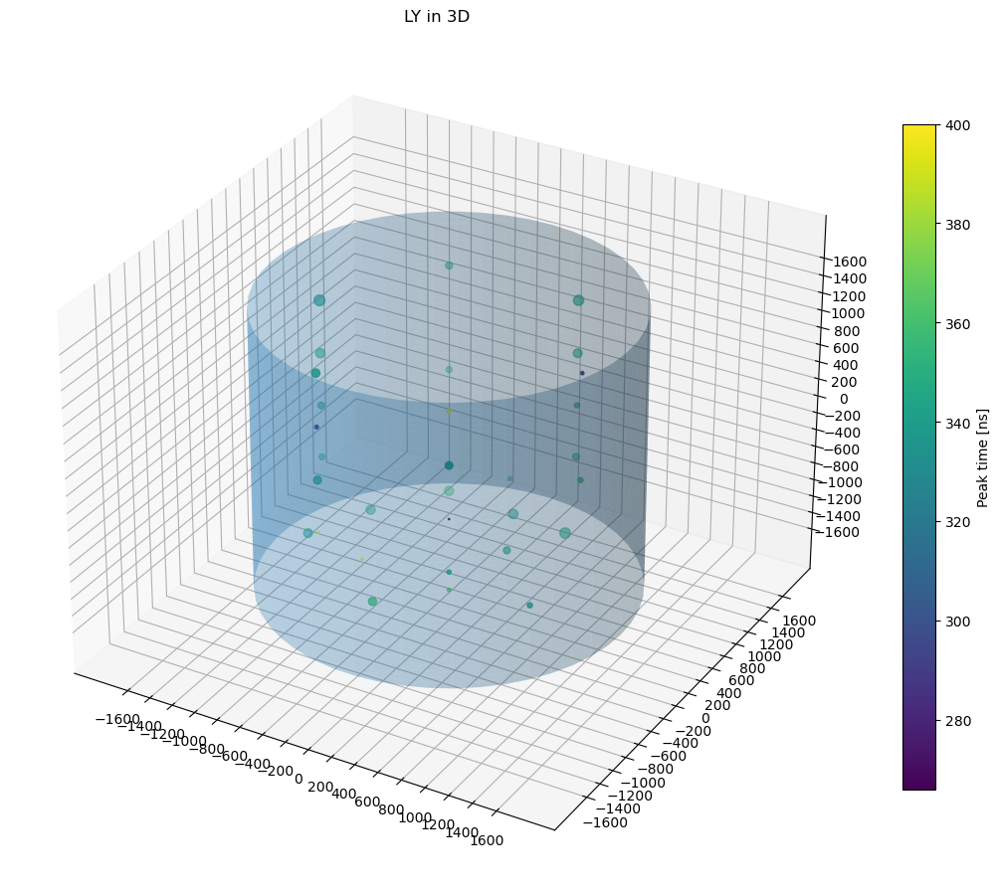

standard deviation 0.337548051347012
standard deviation 0.3263090566004325
standard deviation 0.4671378564900156
standard deviation 0.6496838948772483
standard deviation 0.5076978382850028
standard deviation 0.34341489352783466
standard deviation 0.32892804357827743
standard deviation 0.3474122720649173
standard deviation 0.3848008204660598
standard deviation 0.32507732665316413
standard deviation 0.8065345081755304
standard deviation 0.49698879915936267
standard deviation 0.3557696316885025
standard deviation 0.3829116109991385
standard deviation 0.3949085216313022
standard deviation 0.38182406433916355
standard deviation 0.321875685438253
standard deviation 0.44443698289616546
standard deviation 0.3161055403189708
standard deviation 0.46504504149755754
standard deviation 0.4175117486983871
standard deviation 0.40252444388400965
standard deviation 0.3312151677238865
standard deviation 0.363711700416945
standard deviation 0.5591187091606244
standard deviation 0.3770015900480726
standar

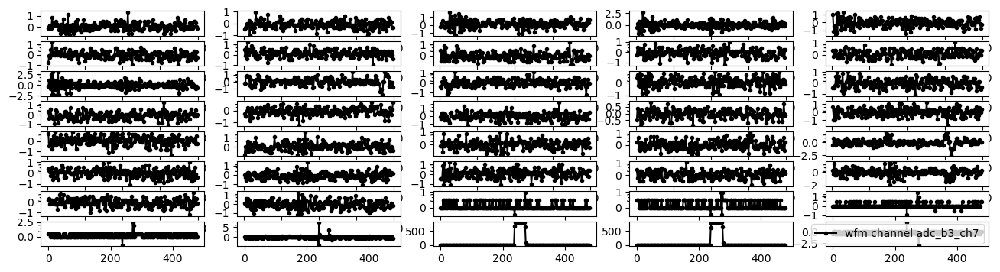

<Figure size 1600x400 with 0 Axes>

chg set to be  [0.10580072839732244, -0.19532442165659522, 0.2495812054500939, 0.042049007439961476, -0.10851356758699734, -0.03933616825028653, 0.2916302128900554, -0.1288598615095594, -0.16548319057017097, 0.15056257502695886, 0.05018752500898627, 0.04204900743996147, 0.050187525008986274, 0.10851356758699736, -0.09088011285411031, -0.16819602975984588, -0.10580072839732241, -0.02305913311223694, -0.059682462172848526, -0.008138517569024794, 0.12885986150955936, 0.12614702231988442, 0.00678209797418733, 0.06510814055219843, -0.031197650681261724, 0.020346293922561997, -0.15870109259598364, 0.16548319057017094, 0.12072134394053458, -0.08681085406959789, -0.165483190570171, -0.020346293922561987, 0.3364536697870031, 0.4884004884004884, 0.3473070139736806, 0.6512006512006511]
chg length  36
12   12   12
24   24   36
area values:   [5.290036419866122, -9.76622108282976, 12.479060272504695, 2.102450371998074, -5.4256783793498675, -1.9668084125143266, 14.581510644502771, -6.442993075477969

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


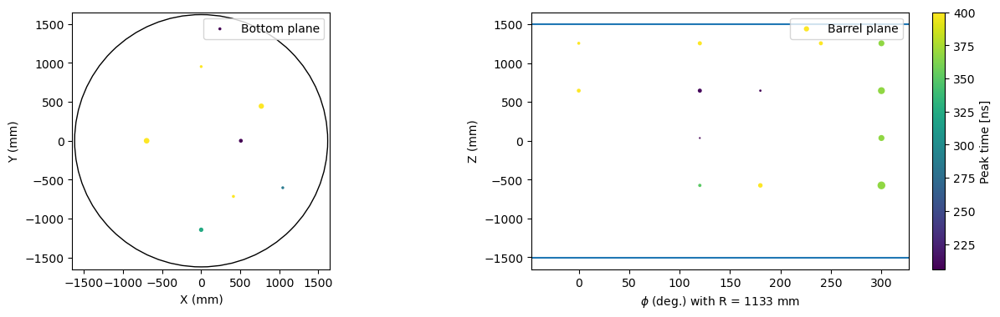

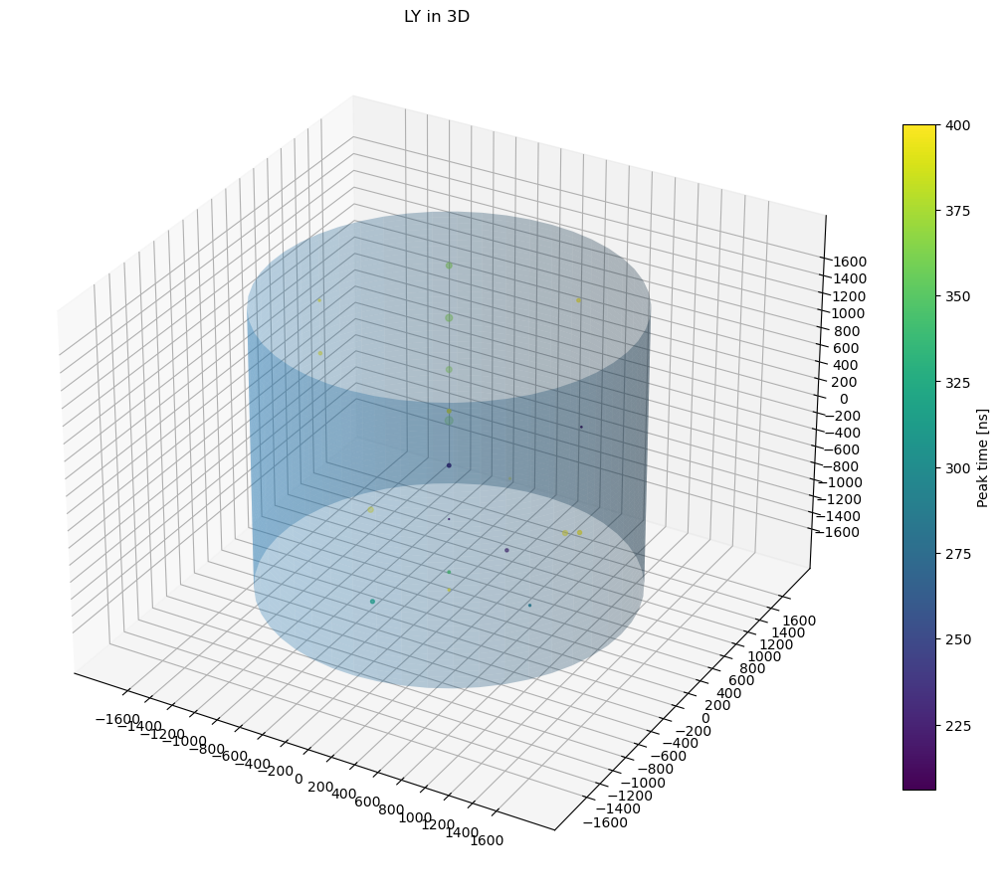

standard deviation 0.30366882397028344
standard deviation 0.3425480845799827
standard deviation 0.3627761733603749
standard deviation 0.4511626579031324
standard deviation 0.33503465472325994
standard deviation 0.33070234218652317
standard deviation 0.32645549134468027
standard deviation 0.3152042260236484
standard deviation 0.3746825934338701
standard deviation 0.3178851130781641
standard deviation 0.41261934561647184
standard deviation 0.4250245919078591
standard deviation 0.32961493377918555
standard deviation 0.3323528276838138
standard deviation 0.43679969658827594
standard deviation 0.3240233067252519
standard deviation 0.3218499626028136
standard deviation 0.39712079448788623
standard deviation 0.33265614992579656
standard deviation 0.43062608145570425
standard deviation 0.36691649762281403
standard deviation 0.311770918695953
standard deviation 0.3127591474200241
standard deviation 0.352419716668416
standard deviation 0.4706123969022077
standard deviation 0.3366337194556601
sta

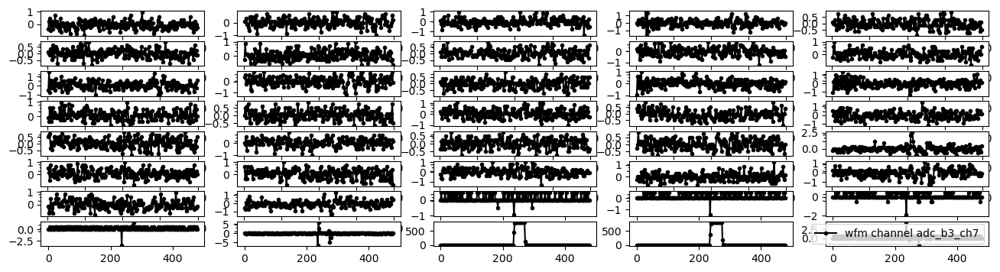

<Figure size 1600x400 with 0 Axes>

chg set to be  [-0.07324665812122322, 0.11665208515602217, -0.07324665812122322, 0.0027128391896749367, -0.043405427034798945, 0.031197650681261735, 0.17633454732887072, 0.07731591690573561, 0.012207776353537203, 0.036623329060611595, 0.18311664530305805, 0.042049007439961476, -0.009494937163862276, 0.004069258784512404, 0.010851356758699748, 0.1722652885443583, 0.10444430880248494, 0.16141393178565858, -0.1288598615095594, -0.04204900743996149, 0.13021628110439684, 0.06917739933671081, 0.04204900743996147, 0.0908801128541103, 0.0949493716386227, 0.14920615543212135, 0.07731591690573564, 0.016277035138049616, -0.006782097974187343, -0.040692587845124015, 0.046118266224473875, -0.1464933162424464, 0.3798670465337131, 0.37444037444037437, 0.24962691629358294, 0.5589472256138922]
chg length  36
12   12   12
24   24   36
area values:   [-3.662332906061161, 5.832604257801108, -3.662332906061161, 0.13564195948374683, -2.1702713517399475, 1.5598825340630866, 8.816727366443535, 3.8657958452867

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


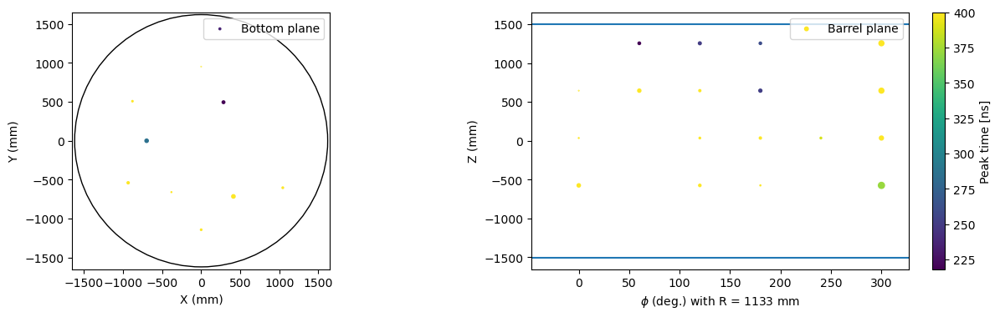

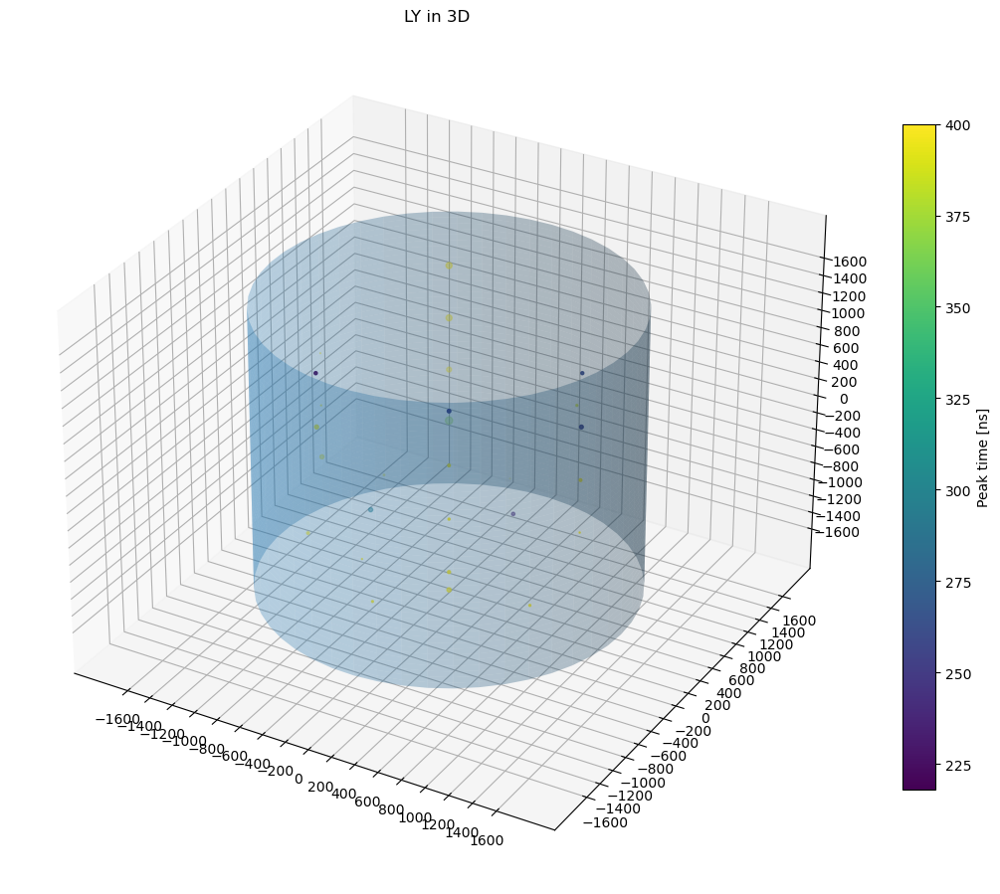

standard deviation 60.087330550817015
standard deviation 39.93237513101556
standard deviation 25.459719610189786
standard deviation 5.484491569426144
standard deviation 36.47782881926607
standard deviation 49.41431481956403
standard deviation 51.612894850947775
standard deviation 21.77876224192926
standard deviation 4.131404887094349
standard deviation 2.478342441054561
standard deviation 28.827080148599286
standard deviation 142.33933931699988
standard deviation 3.715696851441192
standard deviation 2.7871748458629146
standard deviation 2.6156569572220745
standard deviation 5.627683483119486
standard deviation 1.6482920382930566
standard deviation 1.2933836965186714
standard deviation 3.155996309087925
standard deviation 3.964275957708738
standard deviation 2.550377309485966
standard deviation 27.930638485591153
standard deviation 28.9610860886789
standard deviation 16.524261094790283
standard deviation 1.1985268113666423
standard deviation 45.16313072581846
standard deviation 70.42230

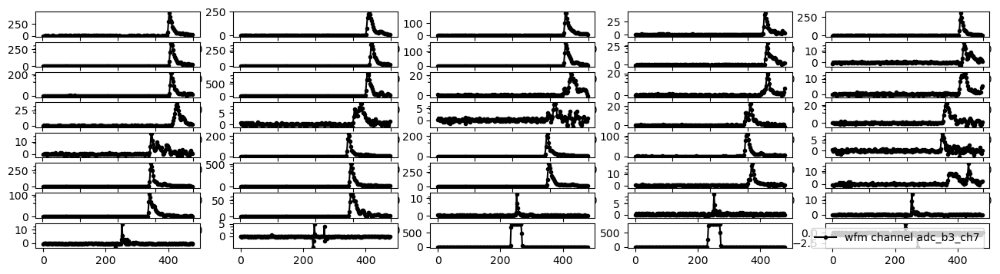

<Figure size 1600x400 with 0 Axes>

chg set to be  [37.289331081676806, 27.22605410757763, 16.787048905708495, 3.4534442884561902, 19.977347792766214, 30.758170732534403, 30.9792671264929, 13.802925797066068, 2.6680773430452978, 1.6100700590720733, 17.345893778781534, 87.9543157880459, 2.9068071917366916, 1.8854232368240793, 1.8230279354615557, 3.755925858104946, 1.2791036779317315, 0.8898112542133784, 2.1743406105244594, 2.8457683099690056, 1.814889417892531, 18.295387495167752, 19.5677090751253, 11.391211757445046, 0.5140830264434, 30.188474502702668, 45.92836748119663, 39.48673082531351, 1.5259720441921507, 2.1824791280934845, 10.740130351923062, 9.214158307730914, 0.6891873558540225, 0.7163207163207163, 0.8465608465608464, -0.18993352326685659]
chg length  36
12   12   12
24   24   36
area values:   [1864.4665540838403, 1361.3027053788817, 839.3524452854248, 172.6722144228095, 998.8673896383107, 1537.9085366267202, 1548.963356324645, 690.1462898533034, 133.4038671522649, 80.50350295360367, 867.2946889390767, 4397.715

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


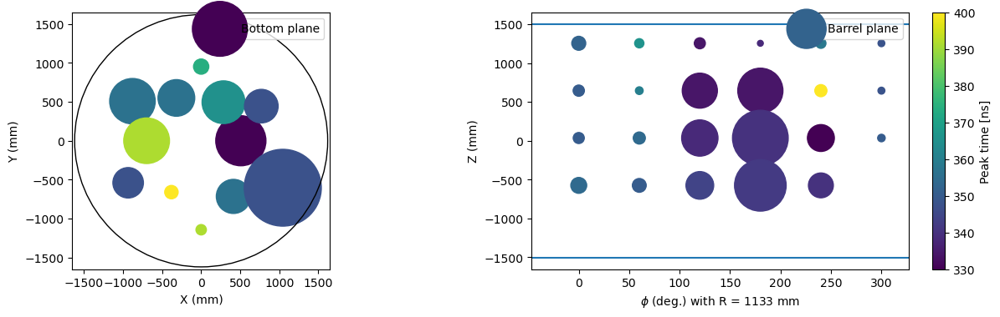

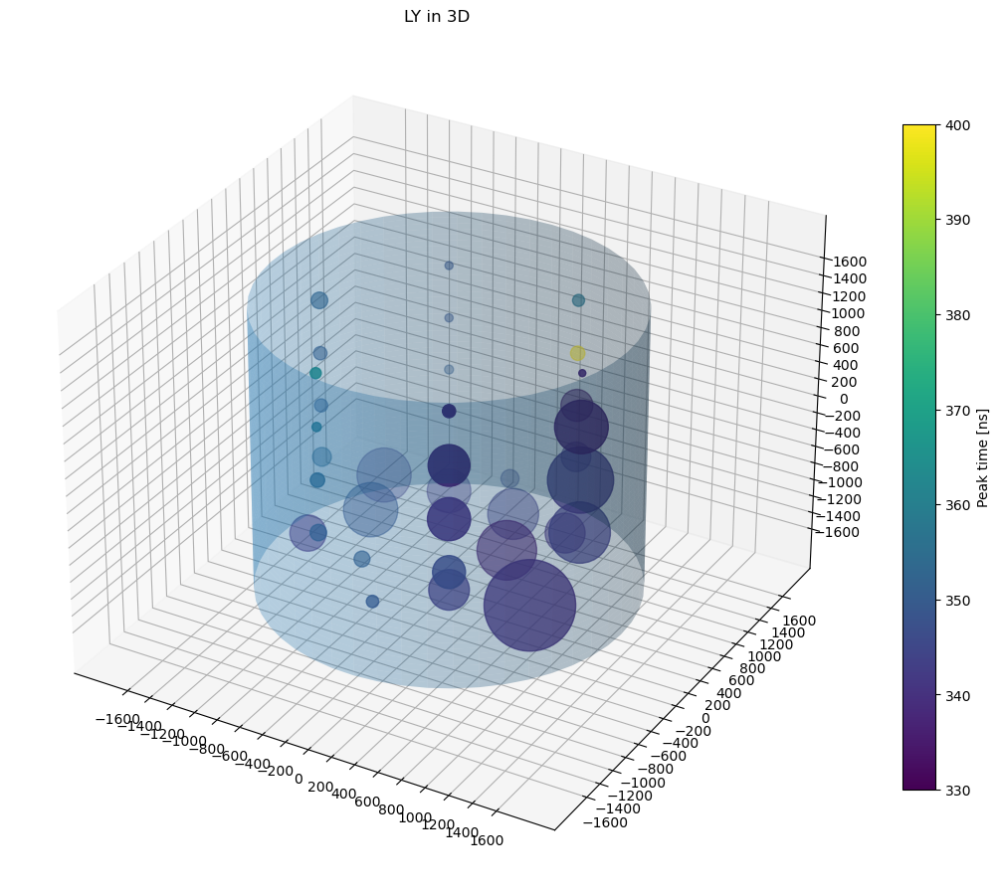

selected one with peak value:  2608.6797289873643
standard deviation 0.3288204800738085
standard deviation 0.3058163252221268
standard deviation 0.3888943958381088
standard deviation 0.5865147212054127
standard deviation 0.3899467839788724
standard deviation 0.2971218106736095
standard deviation 0.36591923494854467
standard deviation 0.35827306716745205
standard deviation 0.3856136432531397
standard deviation 0.7379634636162081
standard deviation 0.7082493455134122
standard deviation 0.4453910962300502
standard deviation 0.4514111602556021
standard deviation 0.39260231745878293
standard deviation 0.6629244004487002
standard deviation 0.33894323795613324
standard deviation 0.3595020227906351
standard deviation 0.4395369063703782
standard deviation 0.34291702046372347
standard deviation 0.4374049527017807
standard deviation 0.3859882149265219
standard deviation 0.45585608537159583
standard deviation 0.3538147600185035
standard deviation 0.3919941265919864
standard deviation 0.60303639337

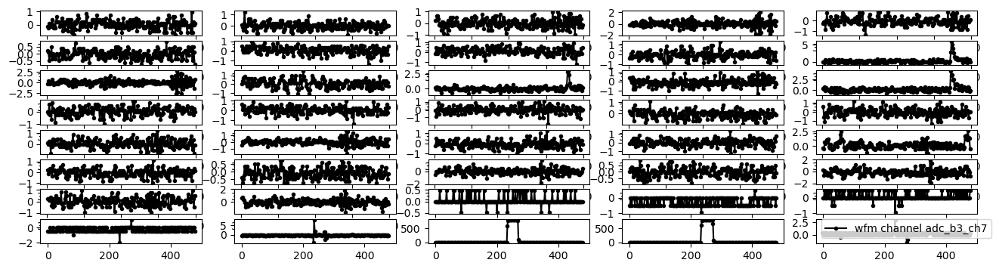

<Figure size 1600x400 with 0 Axes>

chg set to be  [0.08816727366443536, 0.061038881767686015, -0.013564195948374673, 0.06782097974187334, -0.0908801128541103, -0.061038881767686015, 0.2007501000359451, 0.2970558912694053, -0.02984123108642427, 0.4706775994086011, 0.08952369325927281, 0.19803726084627024, 0.10308788920764746, -0.22380923314818205, 0.3458869966835541, 0.10986998718183481, 0.08816727366443536, -0.05832604257801107, -0.11122640677667231, -0.05154394460382375, 0.10580072839732245, 0.061038881767686, -0.12750344191472193, -0.008138517569024797, 0.24958120545009393, -0.07189023852638575, -0.19125516287208286, 0.042049007439961476, -0.05696962298317361, -0.2156707155791573, 0.014920615543212149, -0.0705338189315483, 0.17908017908017906, -0.6403473070139736, 0.29846696513363175, -0.6349206349206349]
chg length  36
12   12   12
24   24   36
area values:   [4.408363683221768, 3.0519440883843005, -0.6782097974187337, 3.3910489870936673, -4.544005642705515, -3.0519440883843005, 10.037505001797255, 14.852794563470265

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


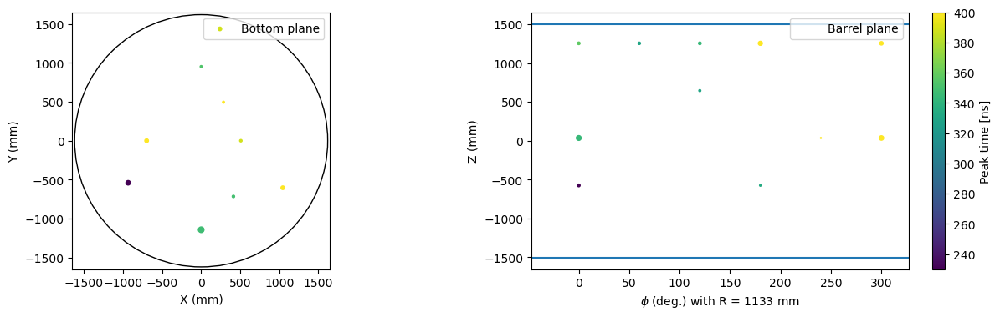

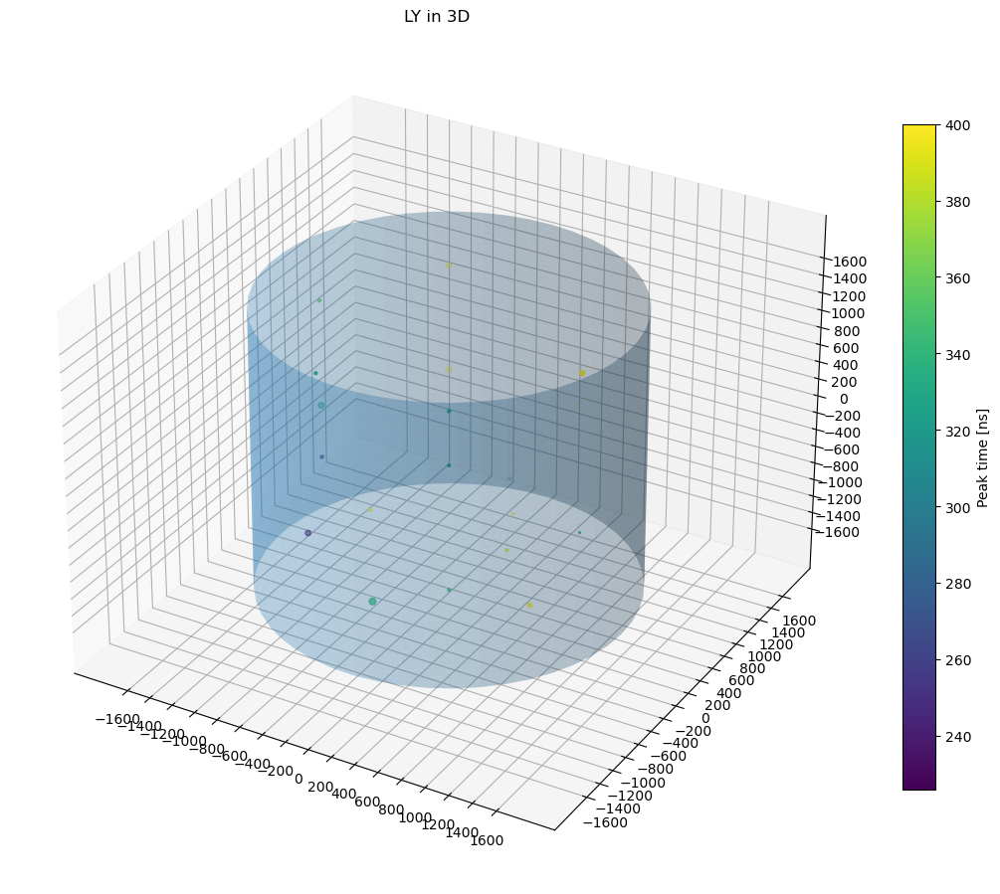

standard deviation 1.7296653329613167
standard deviation 2.283912459858068
standard deviation 2.167318082481622
standard deviation 0.4787104180547338
standard deviation 0.33859553598292846
standard deviation 2.1564998395054484
standard deviation 0.7843606586150361
standard deviation 1.2435044129970443
standard deviation 0.4251848240490098
standard deviation 1.3496053678732927
standard deviation 0.6400802221748588
standard deviation 1.4587284315218956
standard deviation 3.7486257751549847
standard deviation 4.539916576527818
standard deviation 1.1248536837740932
standard deviation 1.483816014695525
standard deviation 4.08878940599017
standard deviation 2.553779938773106
standard deviation 0.734353328808047
standard deviation 0.9866723834367982
standard deviation 1.0529265826731287
standard deviation 0.9348950176221372
standard deviation 1.1065340100852517
standard deviation 1.4522282347357618
standard deviation 0.6034244312643022
standard deviation 0.5200761986109209
standard deviation 

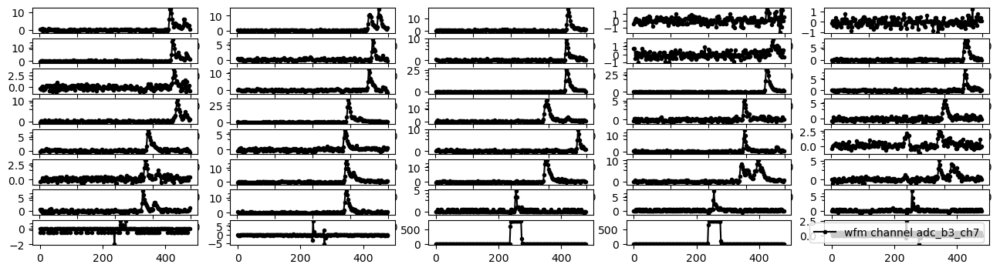

<Figure size 1600x400 with 0 Axes>

chg set to be  [1.196362082646646, 1.5720903104166246, 1.3103013286129934, 0.16005751219082112, -0.07189023852638576, 1.307588489423318, 0.3635204514164412, 0.7012689305309703, -0.02712839189674935, 0.8206338548766677, -0.03933616825028653, 0.7216152244535323, 2.2272409747231214, 2.4456245294919534, 0.3960745216925405, 0.8898112542133784, 2.6219590768208234, 1.8311664530305807, 0.27399675815716834, 0.31062008721778, 0.6036067197026728, 0.4733904385982761, 0.679566217013571, 0.8423365683940672, 0.4896674737363255, 0.4082822980460775, 1.616852157046261, 1.213995537379533, 2.229953813912796, 0.7826541062212187, 0.5493499359091742, 1.3442118184839298, 0.5101071767738433, 0.8031474698141364, 0.542667209333876, -0.3690137023470356]
chg length  36
12   12   12
24   24   36
area values:   [59.818104132332294, 78.60451552083123, 65.51506643064967, 8.002875609541055, -3.594511926319288, 65.3794244711659, 18.17602257082206, 35.06344652654852, -1.3564195948374675, 41.03169274383339, -1.96680841251

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


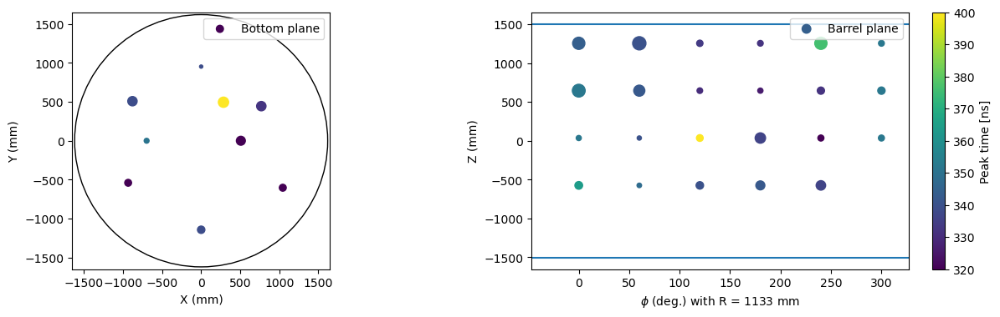

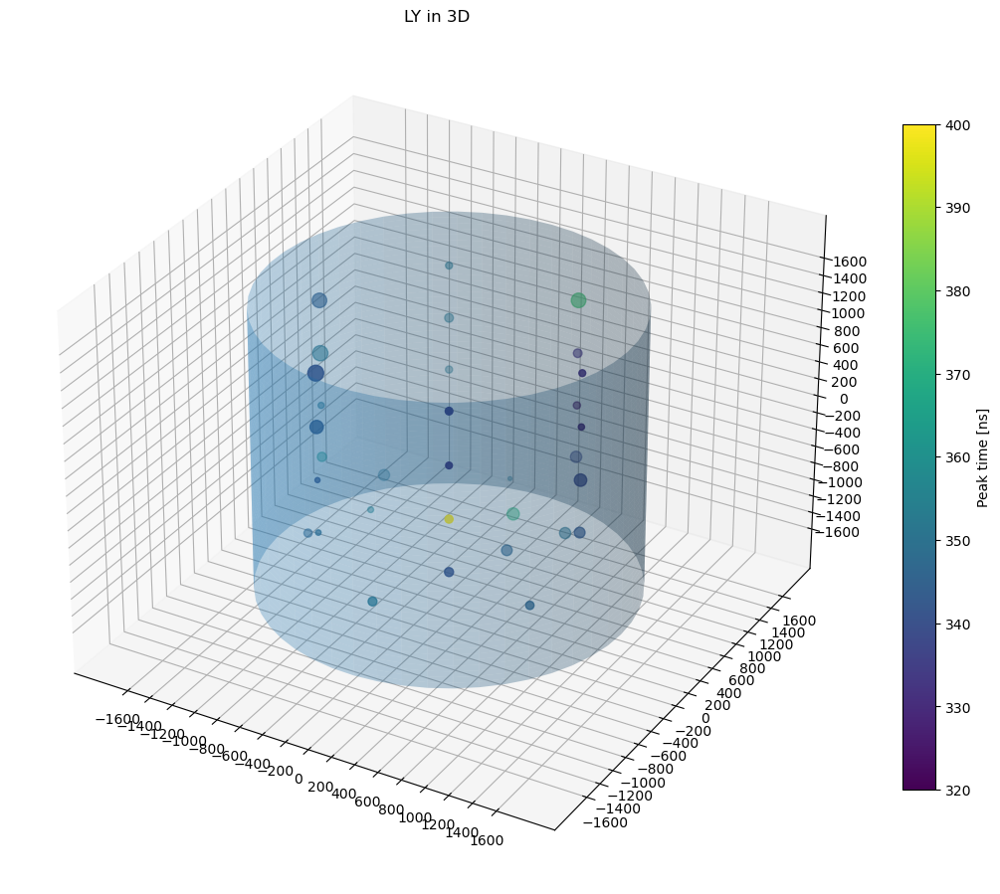

selected one with peak value:  127.57126289446376
standard deviation 116.69578834677885
standard deviation 75.92534410591358
standard deviation 54.32984008873193
standard deviation 26.637770649088587
standard deviation 37.26546835379936
standard deviation 46.1748051132961
standard deviation 40.873419596279625
standard deviation 25.029846534688776
standard deviation 32.7154321971119
standard deviation 22.71352540459486
standard deviation 27.048091249660786
standard deviation 42.448325878513124
standard deviation 2.6768525006056874
standard deviation 3.924396660038166
standard deviation 3.3460264301092137
standard deviation 4.123165351062
standard deviation 1.9726779465700506
standard deviation 5.457554108505564
standard deviation 21.110085513667336
standard deviation 25.597577527924788
standard deviation 2.440445402757659
standard deviation 2.515692134092775
standard deviation 25.961192685816247
standard deviation 17.814742867779714
standard deviation 3.1994897926363675
standard deviati

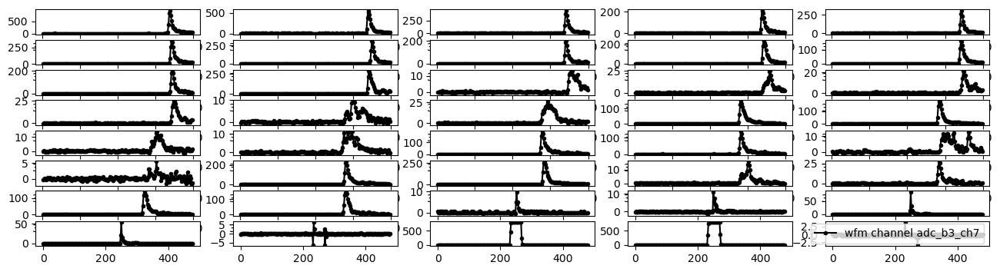

<Figure size 1600x400 with 0 Axes>

chg set to be  [69.11636045494313, 44.86086526005955, 31.902988870577225, 16.046443806927233, 20.552469700977294, 27.733355036046845, 22.86652152977002, 14.22748513025019, 19.810508182601204, 13.381079303071614, 15.593399662251523, 27.1053327636371, 1.7592762145041945, 2.956994716745678, 2.37237787137073, 2.6816415389936723, 1.8501563273583053, 5.026891018467652, 15.771090629175228, 17.634811152481902, 2.018352357118151, 2.2272409747231214, 20.812902263186093, 13.155913650328593, 3.0939930958242616, 0.5222215440124248, 23.29379370214382, 26.10429510264705, 1.8433742293841175, 2.360170095017193, 14.384829803251339, 15.754813594037177, 0.6132139465472798, 0.3852937186270519, 2.197802197802198, 0.884547551214218]
chg length  36
12   12   12
24   24   36
area values:   [3455.8180227471566, 2243.0432630029773, 1595.1494435288612, 802.3221903463616, 1027.6234850488647, 1386.6677518023423, 1143.326076488501, 711.3742565125095, 990.5254091300602, 669.0539651535806, 779.6699831125761, 1355.2666

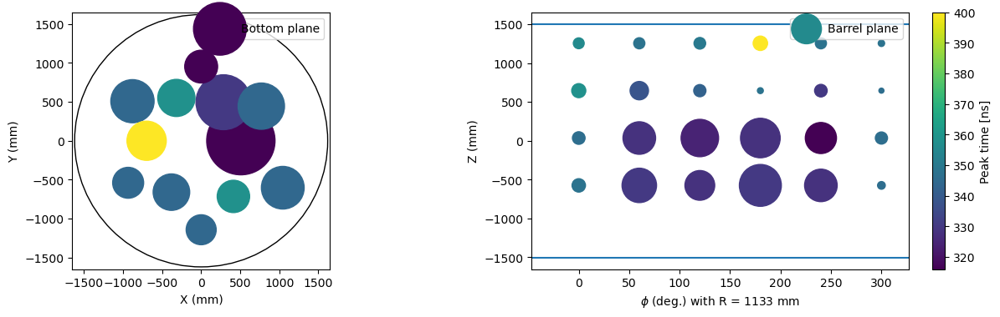

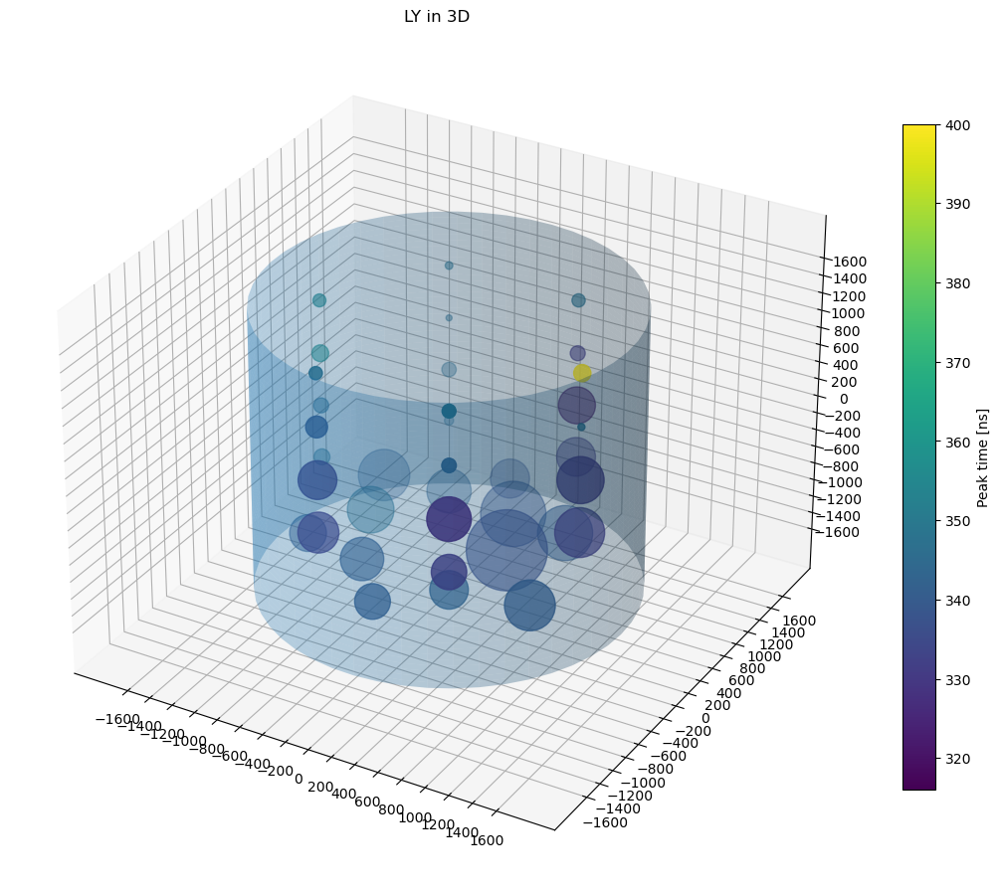

selected one with peak value:  3330.0372337178783
standard deviation 31.80476856566268
standard deviation 40.004873876145744
standard deviation 25.07229829979057
standard deviation 4.294248423680522
standard deviation 6.806820296139103
standard deviation 11.279209149665007
standard deviation 60.26982347206427
standard deviation 45.95100691397802
standard deviation 3.69787987800804
standard deviation 5.054051281149639
standard deviation 8.799652226912492
standard deviation 31.311919773376538
standard deviation 1.6958820469756197
standard deviation 1.80418762997446
standard deviation 1.3714129049941666
standard deviation 4.368434184815246
standard deviation 1.5257051520362896
standard deviation 3.8659918617954903
standard deviation 2.868121993334375
standard deviation 3.4906246030441266
standard deviation 0.7774877825065696
standard deviation 2.219038862636464
standard deviation 3.09335807768352
standard deviation 7.222725549208673
standard deviation 1.306896482133537
standard deviation 

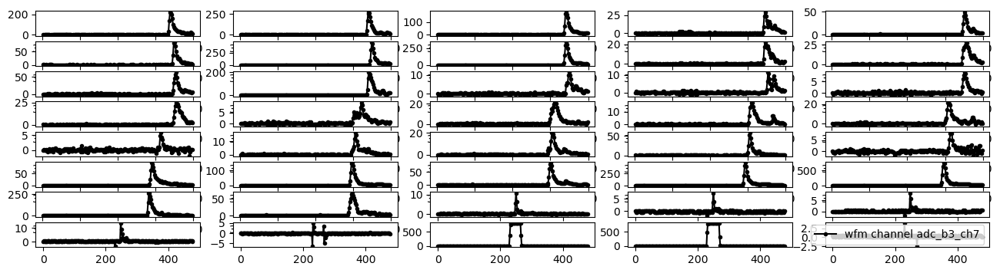

<Figure size 1600x400 with 0 Axes>

chg set to be  [20.308314173906556, 25.055782755837683, 15.898594071089951, 2.992261626211452, 4.089605078434963, 6.54336812549594, 34.42999857575943, 27.41866569004456, 2.556850936268626, 3.7477873405359206, 5.564033178023289, 20.636567715857222, 1.205857019810508, 1.0173146961281003, 0.6999125109361332, 2.921727807279904, 1.3428553988890926, 2.9881923674269393, 2.371021451775893, 2.7793037498219695, 0.4028566196667277, 1.939680020617578, 2.4917427957164273, 4.583341810955801, 0.694486832556783, 10.399669033618862, 14.20171315794828, 8.652600595468202, 39.211377647561505, 72.32157995754407, 25.46813431266828, 8.728560092779103, 0.7108940442273776, -0.4124270790937457, 0.5263871930538596, 1.0093610093610093]
chg length  36
12   12   12
24   24   36
area values:   [1015.4157086953278, 1252.789137791884, 794.9297035544976, 149.6130813105726, 204.48025392174816, 327.168406274797, 1721.4999287879714, 1370.933284502228, 127.8425468134313, 187.38936702679604, 278.2016589011644, 1031.82838579

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


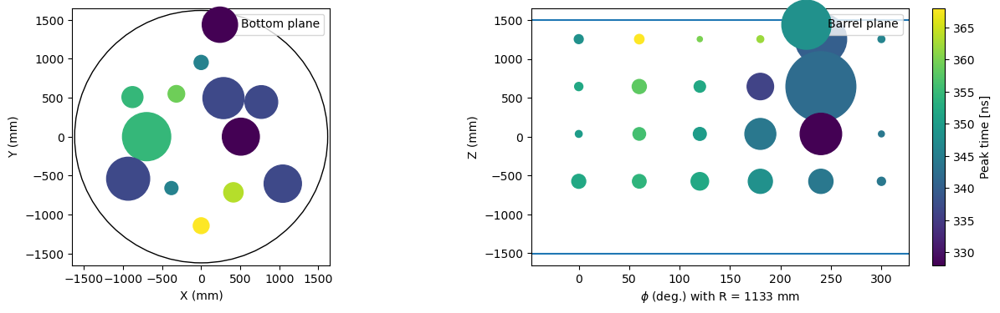

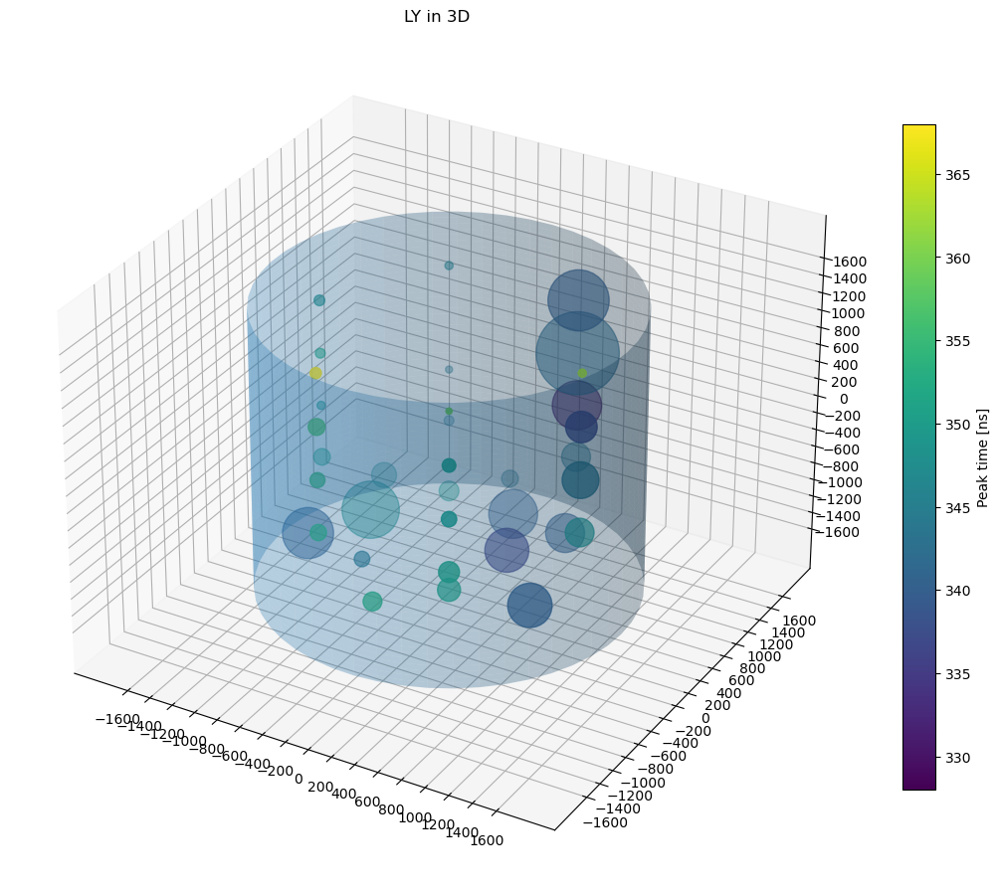

selected one with peak value:  1221.1438686443266
standard deviation 0.3334798357740371
standard deviation 0.33319985292497767
standard deviation 0.4254573455545984
standard deviation 0.726534059595292
standard deviation 0.4305211994985193
standard deviation 0.34013582175268137
standard deviation 0.3802547100338414
standard deviation 0.37257850962232747
standard deviation 0.3300724464939916
standard deviation 0.3513031212927989
standard deviation 0.8948880063943743
standard deviation 0.4175369860152634
standard deviation 0.33719221441031405
standard deviation 0.3589876737676351
standard deviation 0.4249307262471776
standard deviation 0.3461730098540124
standard deviation 0.3464761809848835
standard deviation 0.4644587894753247
standard deviation 0.3466097528524363
standard deviation 0.4736040001638403
standard deviation 0.3823785583283778
standard deviation 0.4490414832327623
standard deviation 0.3371364065485857
standard deviation 0.34174515476919554
standard deviation 0.5327519211869

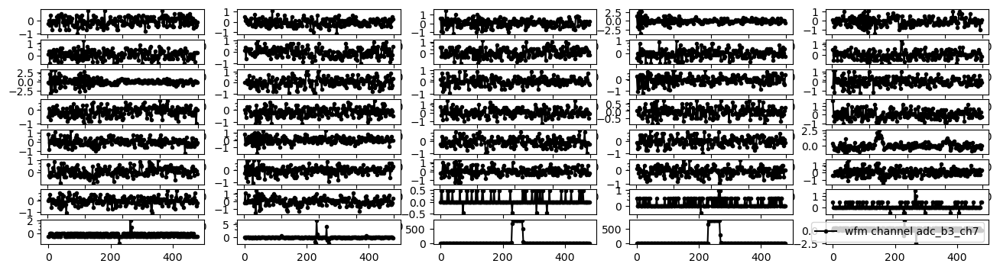

<Figure size 1600x400 with 0 Axes>

chg set to be  [-0.16683961016500842, -0.10037505001797259, 0.11936492434569708, -0.0651081405521984, -0.1180085047508596, 0.22245281355334454, -0.09223653244894772, 0.1275034419147219, -0.02848481149158682, 0.09766221082829762, -0.06782097974187337, 0.06917739933671084, 0.09901863042313508, -0.15327541421663377, -0.03255407027609921, -0.22787849193269447, -0.3730153885803034, 0.11393924596634723, -0.1112264067766723, 0.07867233650057308, -0.014920615543212131, 0.10037505001797258, -0.1315727006992343, 0.01356419594837467, 0.005425678379349868, 0.15463183381147125, 0.014920615543212135, 0.04747468581931134, -0.2088886176049699, 0.1681960297598459, -0.08545443447476041, 0.021702713517399476, 0.16822683489350154, 0.45041378374711705, 0.25505358838692166, -0.5969339302672635]
chg length  36
12   12   12
24   24   36
area values:   [-8.34198050825042, -5.018752500898629, 5.968246217284854, -3.2554070276099205, -5.90042523754298, 11.122640677667226, -4.611826622447386, 6.375172095736096, -1

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


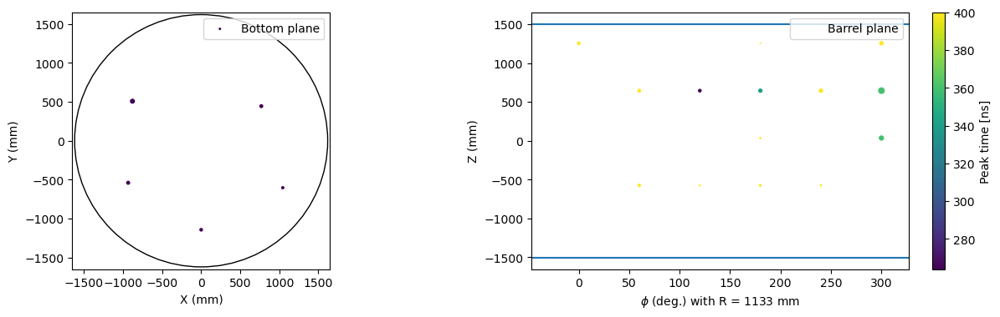

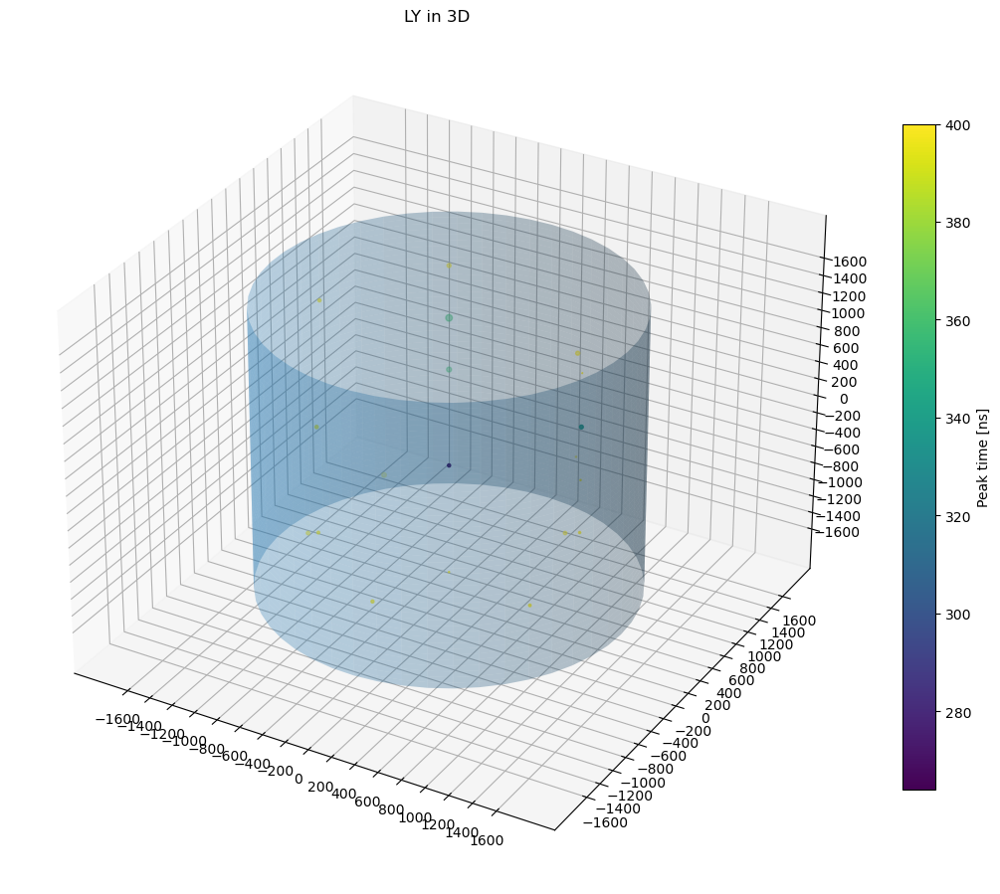

standard deviation 0.3183760318801524
standard deviation 0.3388666186556941
standard deviation 0.4469481323331977
standard deviation 0.5891619080774643
standard deviation 0.4330304862880891
standard deviation 0.34255357760977884
standard deviation 0.3251444638872942
standard deviation 0.3537722122159977
standard deviation 0.3707650705764348
standard deviation 0.29852566396887
standard deviation 0.8638651222891643
standard deviation 0.4846505068263183
standard deviation 0.30616437846020594
standard deviation 0.3894765082634382
standard deviation 0.3940098193964846
standard deviation 0.33626684293043124
standard deviation 0.3670457069366921
standard deviation 0.4468437126745855
standard deviation 0.3157040818381621
standard deviation 0.47975796865050774
standard deviation 0.3985803241617478
standard deviation 0.43539914217177245
standard deviation 0.33036419307686943
standard deviation 0.3450558315789492
standard deviation 0.7075811231666993
standard deviation 0.3493738849332805
standard

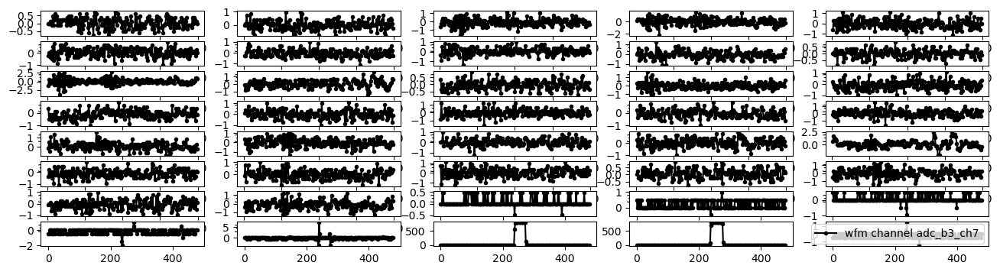

<Figure size 1600x400 with 0 Axes>

chg set to be  [0.08002875609541056, 0.03662332906061161, -0.20210651963078263, 0.0013564195948374844, -0.06375172095736094, 0.07189023852638575, -0.09630579123346016, 0.12072134394053455, -0.142424057457934, 0.02712839189674934, 0.006782097974187364, 0.09088011285411027, -0.09630579123346016, 0.023059133112236938, -0.16683961016500845, -0.2061757784152949, -0.004069258784512391, -0.046118266224473875, -0.07189023852638576, 0.06782097974187334, 0.19668084125143273, -0.06239530136252347, 0.052900364198661204, 0.03391048987093667, 0.22923491152753186, -0.206175778415295, -0.04747468581931136, 0.15598825340630873, 0.14513689664760895, 0.014920615543212135, -0.12885986150955936, -0.2061757784152949, 0.2442002442002442, 0.6240672907339574, 0.293040293040293, -0.5698005698005697]
chg length  36
12   12   12
24   24   36
area values:   [4.001437804770528, 1.8311664530305805, -10.105325981539131, 0.06782097974187422, -3.187586047868047, 3.5945119263192873, -4.815289561673008, 6.036067197026727

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


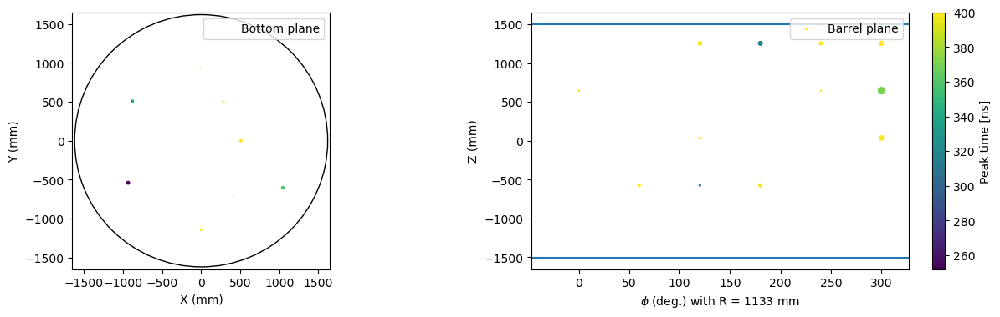

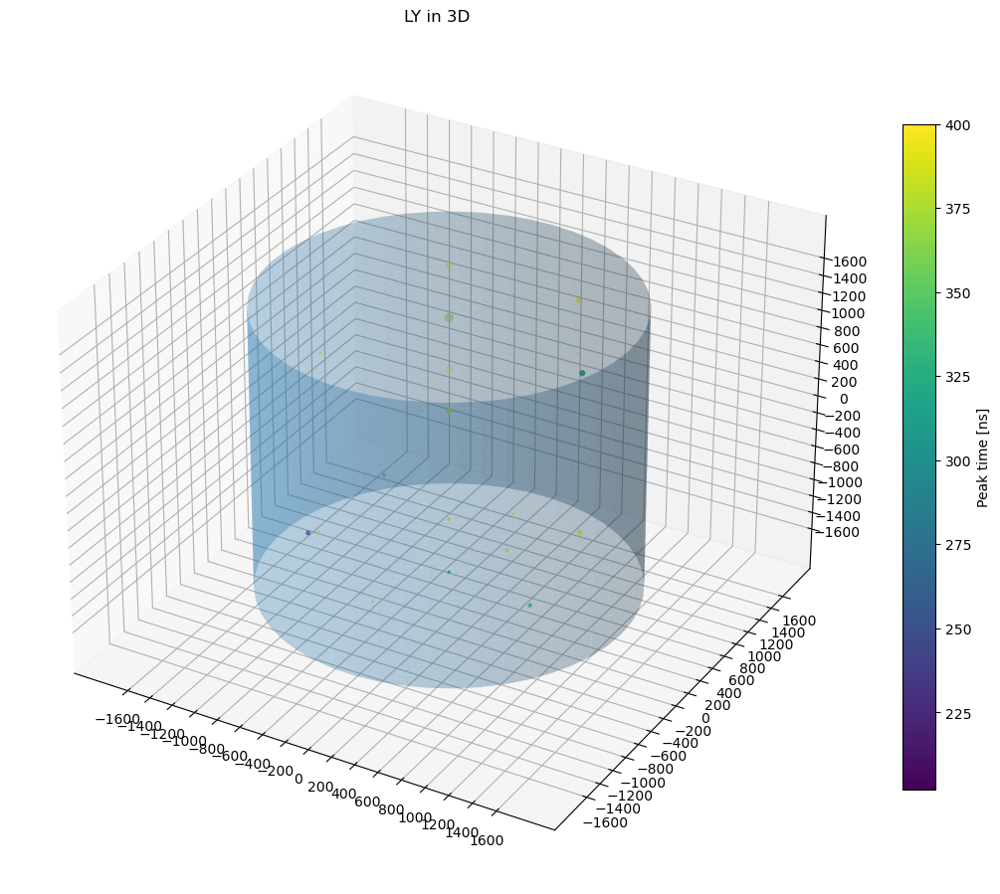

standard deviation 1.4444550411382053
standard deviation 2.9482822615732025
standard deviation 2.82108990748268
standard deviation 0.9155548139117662
standard deviation 0.9223209920686142
standard deviation 0.5903946873124108
standard deviation 1.565633708885753
standard deviation 0.4359243378377953
standard deviation 1.6365838308114564
standard deviation 0.7968886803918921
standard deviation 1.0055168617212475
standard deviation 3.377942292606789
standard deviation 4.66390213038234
standard deviation 1.6679238437903376
standard deviation 0.5920146943135864
standard deviation 0.9869080677144882
standard deviation 3.2065127847679107
standard deviation 1.1775509920994027
standard deviation 2.3543412475165666
standard deviation 0.7656045161111088
standard deviation 0.5965897614252929
standard deviation 1.189917300481612
standard deviation 1.378878742055672
standard deviation 0.4881175767658988
standard deviation 2.5300434820884985
standard deviation 0.8835420582376693
standard deviation 0

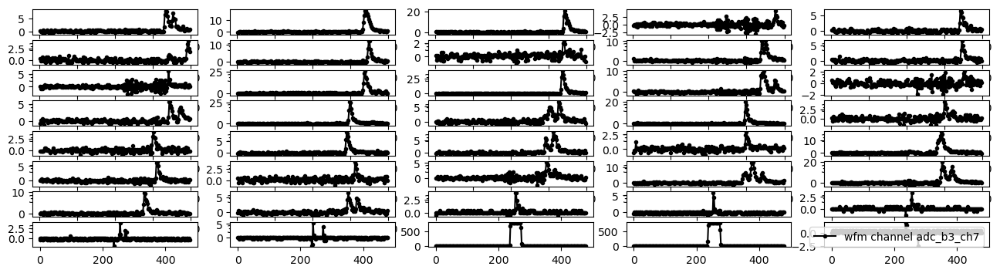

<Figure size 1600x400 with 0 Axes>

chg set to be  [1.1705901103447343, 1.840661390194443, 1.7118015286848836, 0.08545443447476042, 0.3024815696487553, 0.07053381893154827, 0.6334479507890971, 0.22923491152753186, 1.036304570455825, 0.41235155683059, 0.30926366762294244, 1.6412677097533355, 2.5473559991047634, 1.212639117784696, -0.02712839189674934, 0.679566217013571, 1.9132298385182465, 0.9834042062571636, 1.196362082646646, 0.34181773789904163, 0.23466058990688177, 0.5045880892795378, 0.92100890489464, 0.22923491152753195, 1.8650769429015175, 0.269927499372656, 0.46796476021892613, 0.7094074480999951, 1.9328979226433909, 2.2937055348701567, 0.8504750859630918, 0.6890611541774331, 0.43413376746710075, -0.4992538325871659, 0.271333604666938, -0.5263871930538597]
chg length  36
12   12   12
24   24   36
area values:   [58.529505517236714, 92.03306950972215, 85.59007643424418, 4.272721723738021, 15.124078482437763, 3.526690946577413, 31.672397539454856, 11.461745576376593, 51.815228522791244, 20.6175778415295, 15.46318338

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


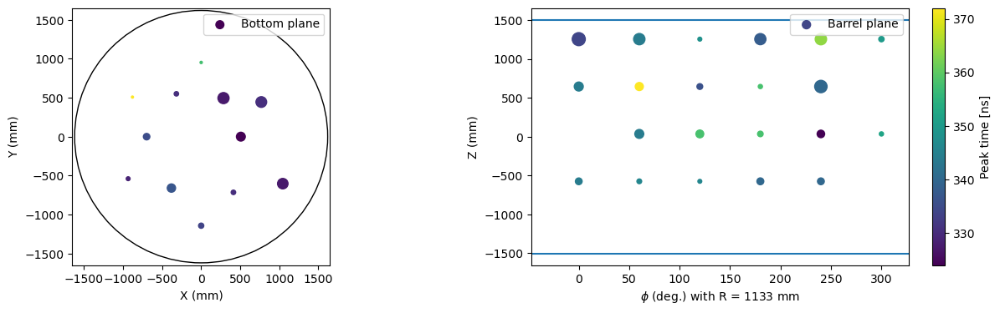

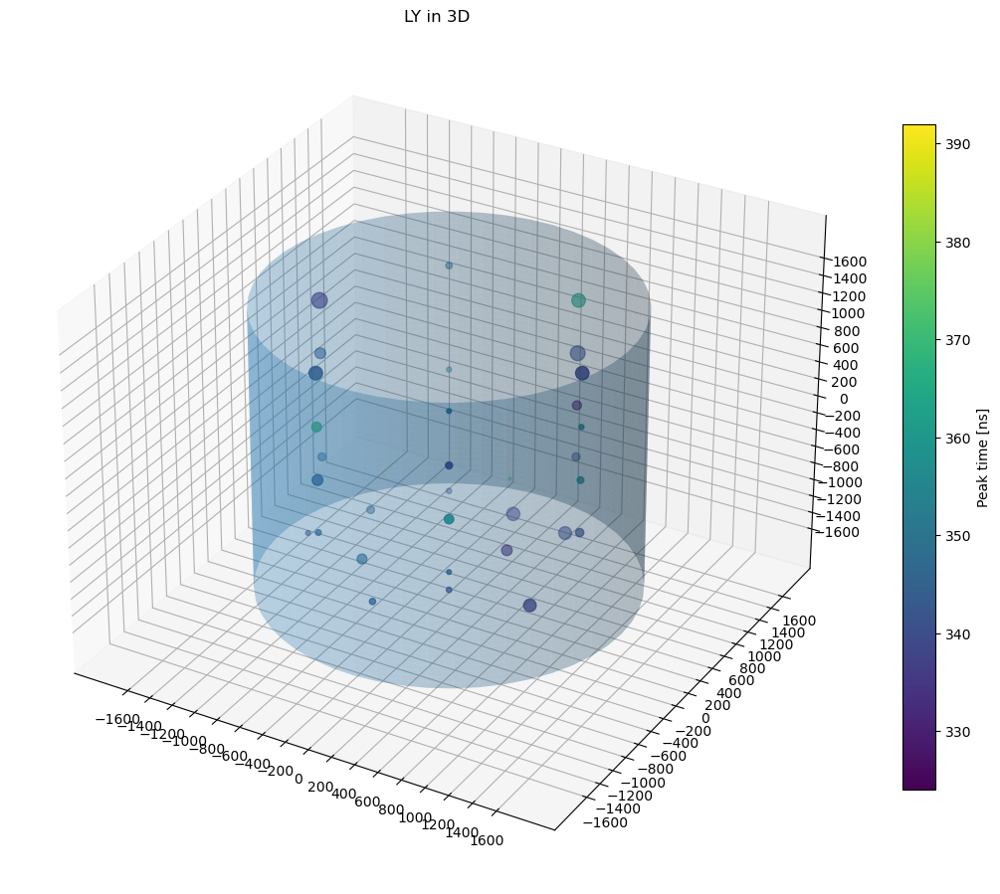

selected one with peak value:  108.282976255875
standard deviation 5.6829102183365565
standard deviation 7.142077098168362
standard deviation 2.586217266673188
standard deviation 8.284248385699408
standard deviation 3.764283389153781
standard deviation 9.250052613220507
standard deviation 3.895793027988987
standard deviation 1.6679565593611254
standard deviation 6.607495110167526
standard deviation 5.990211303638024
standard deviation 6.645534886656385
standard deviation 4.163386933309308
standard deviation 21.61435760561604
standard deviation 5.0433029114918755
standard deviation 1.4473357492255177
standard deviation 2.386406670570624
standard deviation 34.75626861389951
standard deviation 16.456021155975254
standard deviation 3.964746497377892
standard deviation 0.9508221230468012
standard deviation 2.769981653469516
standard deviation 3.6219667861924316
standard deviation 2.572761739709437
standard deviation 1.2677063960411283
standard deviation 2.304097659334349
standard deviation 

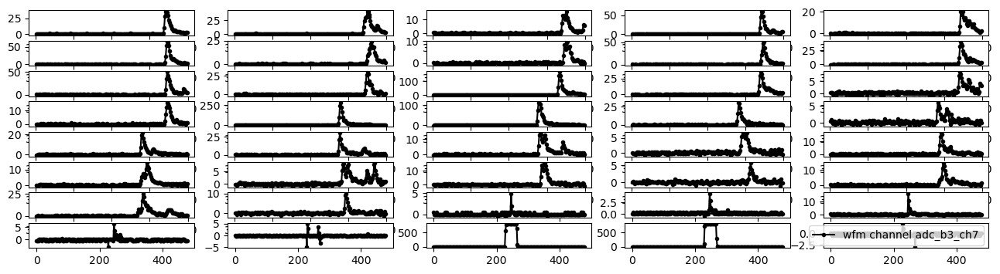

<Figure size 1600x400 with 0 Axes>

chg set to be  [3.4086824418265547, 5.48943010030723, 1.7294349834177707, 5.045880892795378, 2.857976086322543, 5.570815275997477, 2.7576010363045707, 0.9589886535500893, 4.076040882486589, 4.076040882486589, 4.32697850753152, 2.314051828792719, 13.241368084803353, 3.4520878688613537, 1.3387861401045797, 1.265539481983357, 21.87090954715932, 11.094155866175642, 2.2638643037837327, 0.8070696589282929, 1.6765346192191093, 2.8389862119948193, 2.191974065257347, 0.9562758143604144, 1.4744280995883265, 1.9179773071001784, 1.7118015286848836, 1.4717152603986519, 0.20617577841529497, 1.4717152603986519, 3.560601436448349, 0.6225965940303972, 0.31474698141364804, 0.6783340116673449, 0.7760141093474424, -0.32560032560032554]
chg length  36
12   12   12
24   24   36
area values:   [170.43412209132774, 274.47150501536146, 86.47174917088853, 252.2940446397689, 142.89880431612715, 278.54076379987384, 137.88005181522854, 47.94943267750447, 203.80204412432943, 203.80204412432943, 216.348925376576, 11

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


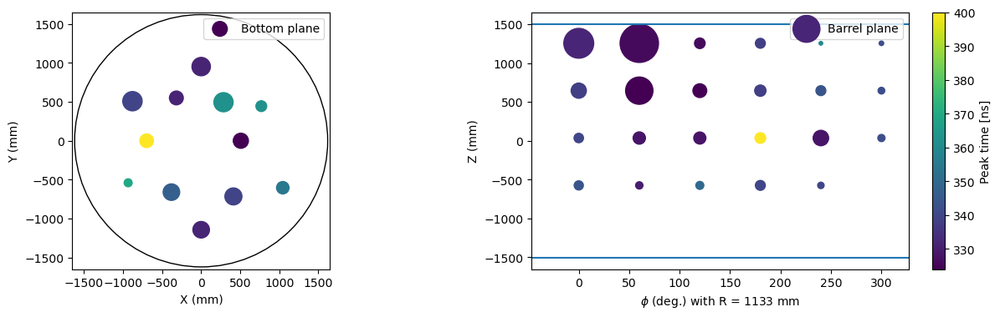

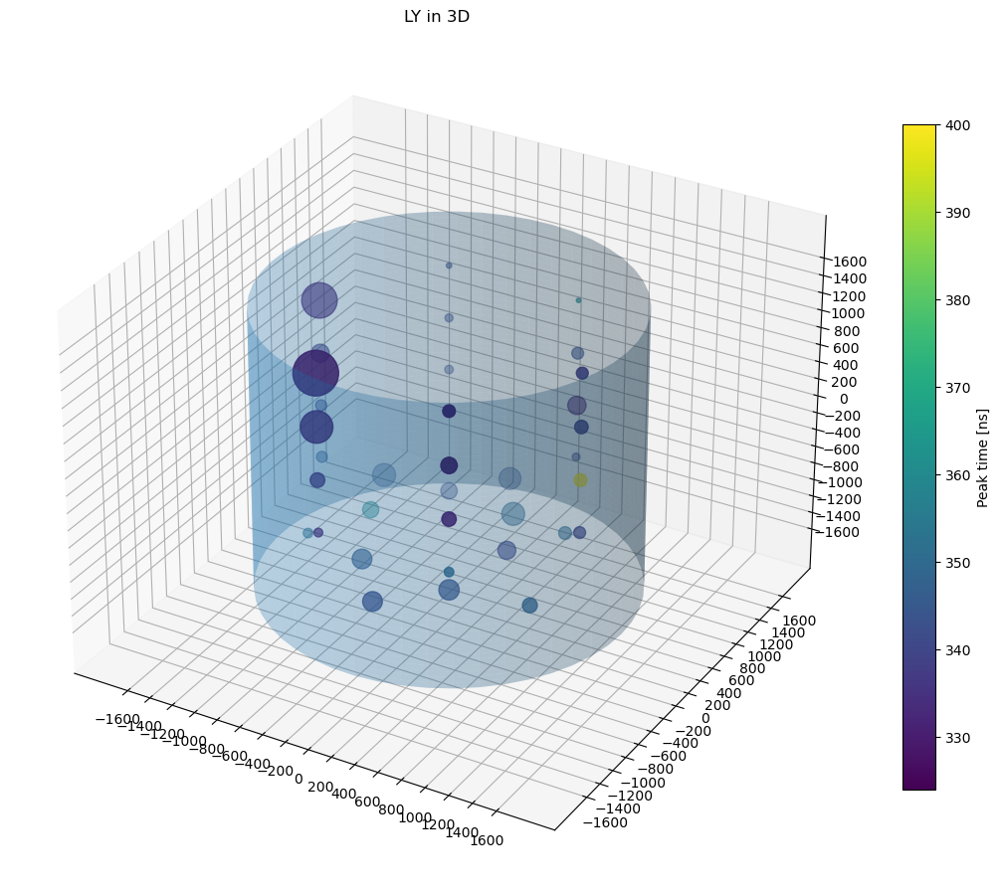

selected one with peak value:  439.2357932002685
standard deviation 1.2292662229208728
standard deviation 1.9124784843955864
standard deviation 0.8880865600437066
standard deviation 0.7573338524485455
standard deviation 0.42683497683018884
standard deviation 1.2635042386583015
standard deviation 2.847128861351483
standard deviation 1.2180683319120038
standard deviation 0.43488888869497216
standard deviation 1.1728770441941012
standard deviation 1.3043842450047136
standard deviation 0.600601403826976
standard deviation 0.9517454547164952
standard deviation 2.7708307811952757
standard deviation 0.5476434977404696
standard deviation 1.2079977110227609
standard deviation 1.1015512601915718
standard deviation 1.0648389258826672
standard deviation 1.3380643326231887
standard deviation 0.5396161531374823
standard deviation 0.51552289736278
standard deviation 0.6306483841521436
standard deviation 0.7382046330686725
standard deviation 0.38723222672271984
standard deviation 1.215969955374761
sta

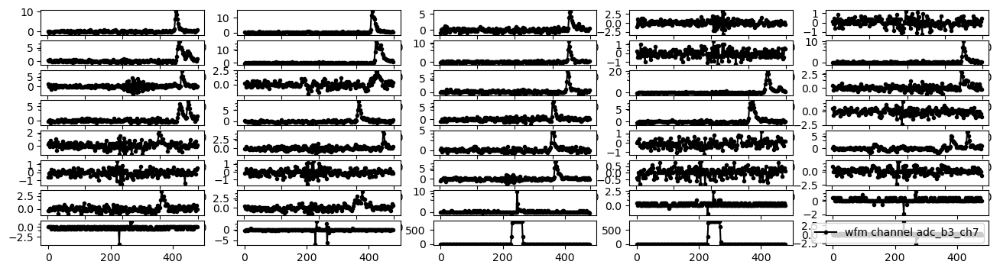

<Figure size 1600x400 with 0 Axes>

chg set to be  [0.598181041323323, 1.1380360400686351, 0.3499562554680665, 0.15463183381147125, 0.09223653244894775, 0.8626828623166293, 1.7470684381506578, 0.6280222724097473, -0.06782097974187333, 0.6429428879529595, 0.348599835873229, 0.10173146961281003, 0.6076759784871854, 1.5653082124424373, 0.2794224365365182, 0.49509315211567545, 0.30926366762294255, 0.3621640318216038, 0.5886861041594608, -0.15870109259598364, 0.2604325622087936, 0.1681960297598459, 0.3540255142525789, -0.2102450371998074, 0.5696962298317362, -0.14242405745793402, -0.13971121826825908, 0.4516877250808765, 0.06375172095736094, 0.15870109259598364, 0.22787849193269447, 0.32418428316615455, 0.39614706281372947, 0.6023606023606023, 0.3635870302536969, -0.5643738977072309]
chg length  36
12   12   12
24   24   36
area values:   [29.909052066166147, 56.901802003431754, 17.497812773403325, 7.731591690573563, 4.611826622447388, 43.13414311583146, 87.35342190753289, 31.401113620487365, -3.3910489870936664, 32.147144397

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


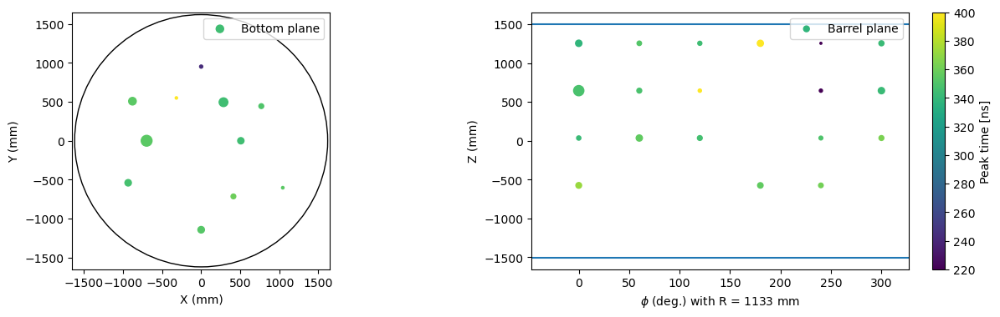

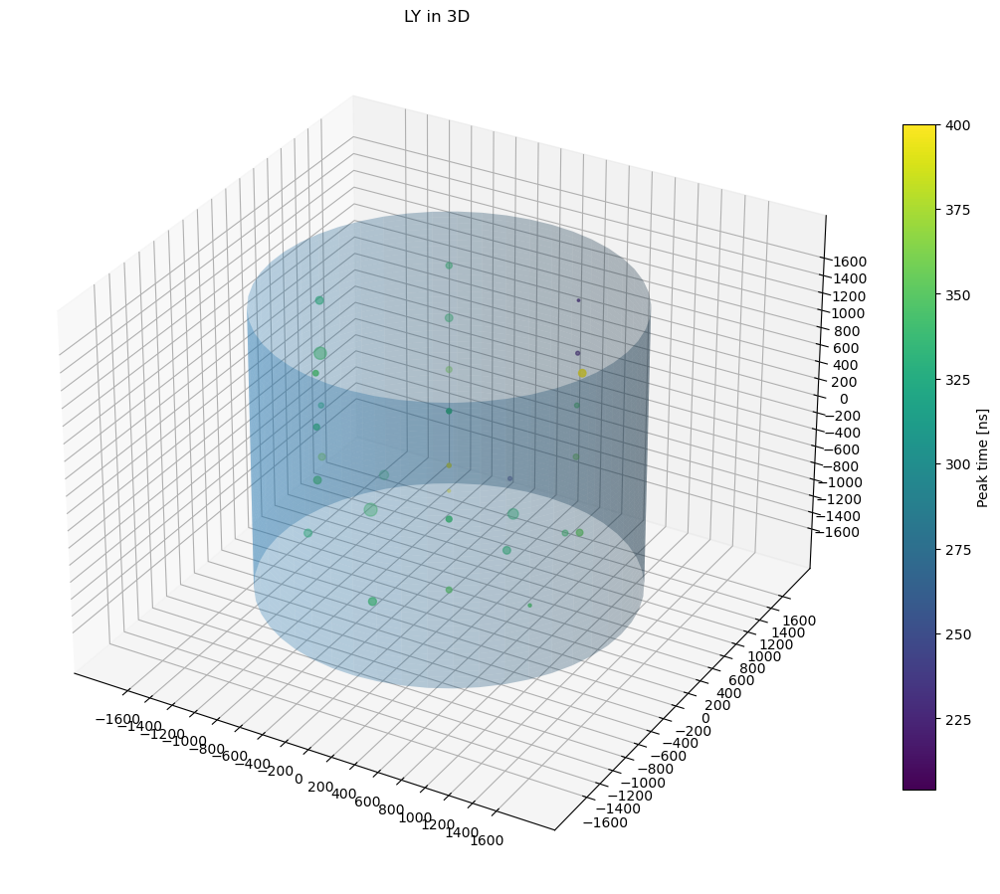

standard deviation 184.53635563422367
standard deviation 227.31718293589478
standard deviation 242.12787156661602
standard deviation 105.46100092143192
standard deviation 78.04778510504016
standard deviation 101.36199044326956
standard deviation 233.9439968414881
standard deviation 293.87614779187453
standard deviation 136.31699445160856
standard deviation 45.84705930722522
standard deviation 41.79981869202167
standard deviation 131.56014544506314
standard deviation 13.628636246037969
standard deviation 34.71190703774028
standard deviation 37.76331505157081
standard deviation 67.13026726814218
standard deviation 12.013146417691946
standard deviation 31.87864007175279
standard deviation 29.688755805846363
standard deviation 35.86948609263753
standard deviation 13.687232603724397
standard deviation 17.30458469947073
standard deviation 37.37193858951432
standard deviation 50.08874623873943
standard deviation 12.241868321888385
standard deviation 18.552235430418662
standard deviation 102.4

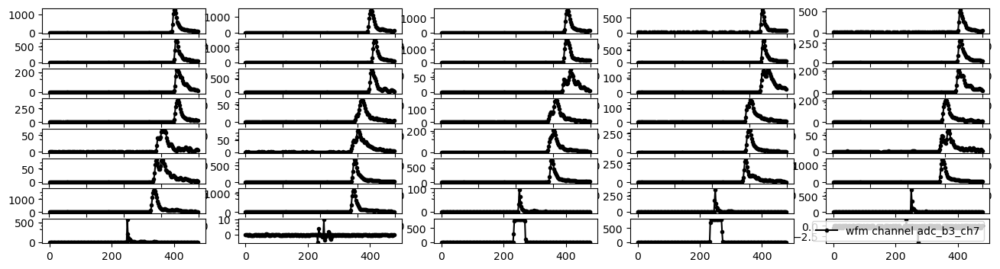

<Figure size 1600x400 with 0 Axes>

chg set to be  [122.21883117323513, 156.3965357043548, 161.54414806676297, 70.1825062564854, 52.386281172217814, 66.171573514551, 150.28722184920687, 210.90425712289837, 85.86136035321165, 31.37398522859061, 31.612715077282004, 89.26326069706403, 11.993462057552883, 30.51401520546366, 30.371591148005717, 46.54960765563219, 10.603131972844478, 28.160627208420657, 26.298263104708813, 28.602819996337672, 12.795106038101828, 17.599544243016133, 32.031848732086786, 36.88783088160491, 11.682841970335105, 18.429673035056666, 77.18502241483381, 83.95559082246501, 35.45680820905138, 161.75710594315242, 219.34525626157196, 128.01209926278594, 3.5219101885768547, 10.522317188983857, 17.870031203364537, 13.610093610093607]
chg length  36
12   12   12
24   24   36
area values:   [6110.941558661757, 7819.82678521774, 8077.207403338149, 3509.1253128242697, 2619.3140586108907, 3308.57867572755, 7514.361092460344, 10545.212856144919, 4293.068017660583, 1568.6992614295305, 1580.6357538641003, 4463.16303

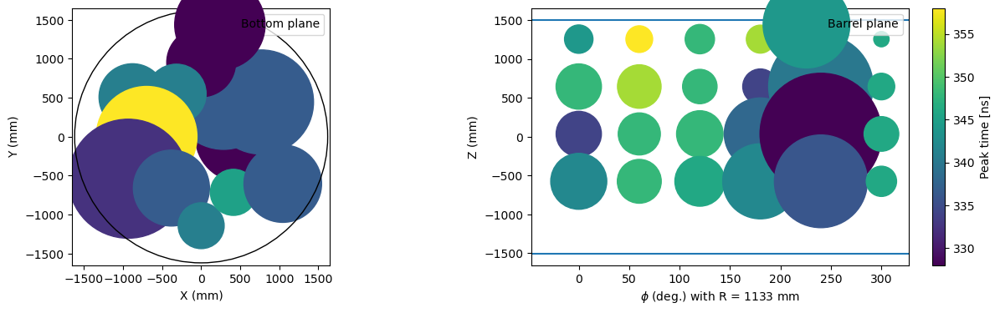

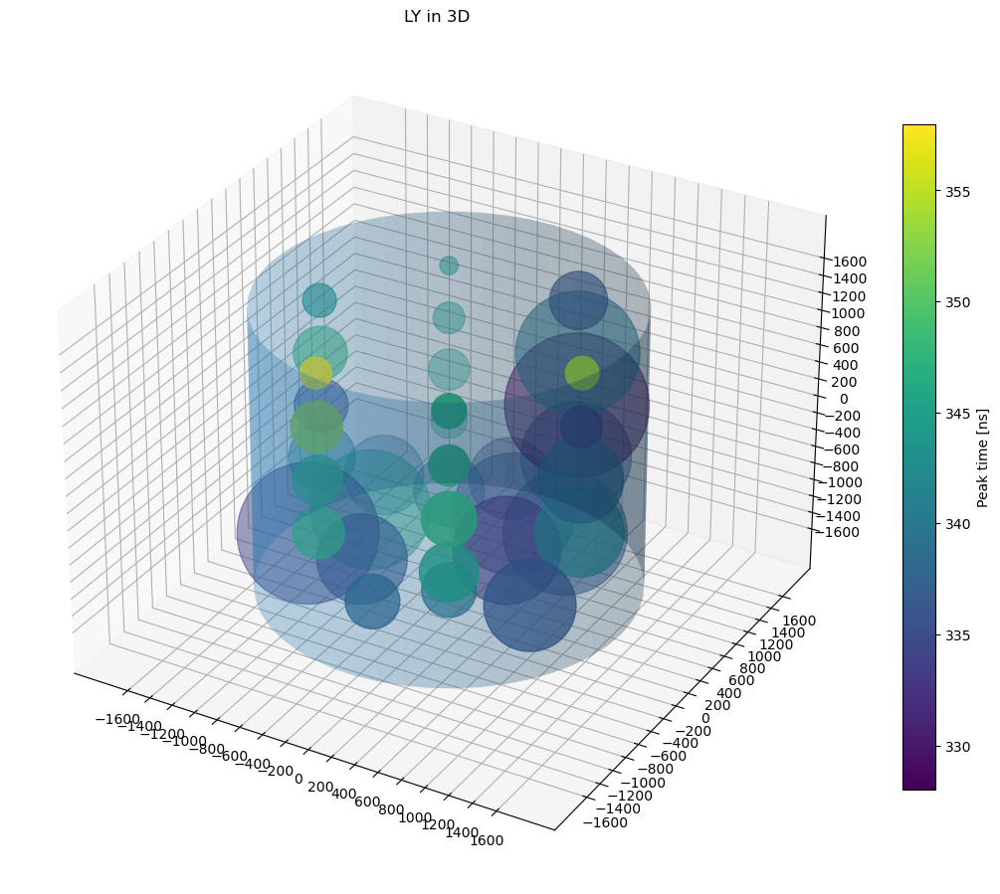

selected one with peak value:  10199.35298785326
standard deviation 3.8527962631808053
standard deviation 0.914142629237835
standard deviation 1.7981901989516162
standard deviation 0.834355773354634
standard deviation 1.292696256331121
standard deviation 0.7805794355906616
standard deviation 6.011460485257986
standard deviation 3.1571507215317562
standard deviation 2.5124799804049145
standard deviation 1.1922673538395114
standard deviation 2.055601222693735
standard deviation 2.041278093357323
standard deviation 0.5272118942309505
standard deviation 1.4046368459801082
standard deviation 1.3269323415460799
standard deviation 1.5634862297979748
standard deviation 0.8636795225800955
standard deviation 0.5948183704778204
standard deviation 1.1421244513424025
standard deviation 1.0639698810292257
standard deviation 1.535668707488948
standard deviation 1.1110789091085251
standard deviation 1.3472004326068245
standard deviation 0.8529056428481719
standard deviation 1.0460673100571185
standard

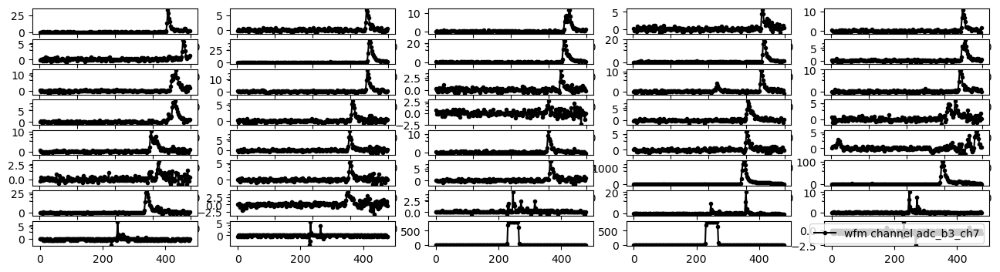

<Figure size 1600x400 with 0 Axes>

chg set to be  [2.16348925376576, 0.3255407027609922, 1.0729278995164364, 0.4815289561673008, 0.7216152244535324, 0.5018752500898627, 3.4561571276458665, 1.947818538186603, 1.4378047705277157, 0.7568821339193066, 1.200431341431158, 1.1868671454827837, 0.18989874327724535, 0.9372859400326897, 0.7365358399967447, 1.006463339369401, 0.2821352757261932, 0.06510814055219839, 0.5710526494265736, 0.7718027494625187, 1.1217590049305852, 0.48017253657246334, 0.7161895460741825, 0.16277035138049595, 0.3987873608822153, 0.33367922033001685, 0.34046131830420423, 0.7962183021695931, 148.12983648361782, 9.796062313916188, 2.4035755220519914, 0.4082822980460775, 0.4829738163071496, 0.18993352326685664, 0.6946140279473612, -0.33102699769366434]
chg length  36
12   12   12
24   24   36
area values:   [108.174462688288, 16.27703513804961, 53.64639497582182, 24.07644780836504, 36.08076122267662, 25.093762504493135, 172.80785638229332, 97.39092690933016, 71.89023852638579, 37.84410669596533, 60.0215670715

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


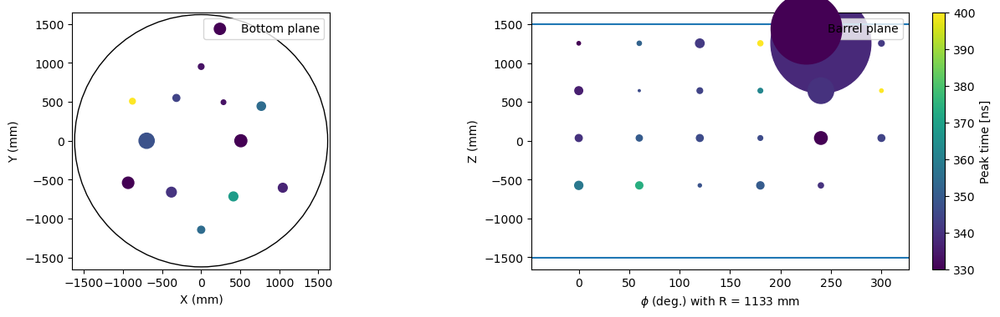

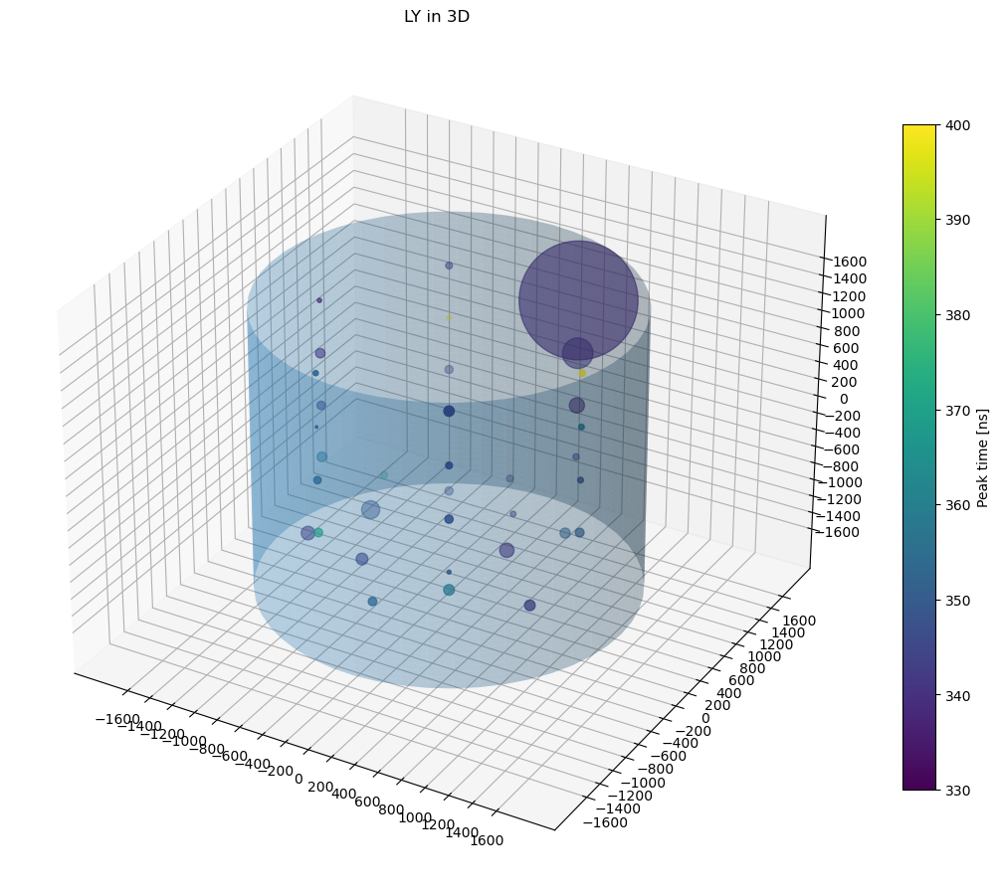

selected one with peak value:  127.20502960385767
standard deviation 3.6139991549243953
standard deviation 2.559229146431766
standard deviation 8.069055931671045
standard deviation 2.948998891431425
standard deviation 4.713947145864443
standard deviation 4.619751781995643
standard deviation 25.158587774813185
standard deviation 13.245344972543169
standard deviation 4.397794930604158
standard deviation 1.3928590619211207
standard deviation 5.956584794764661
standard deviation 6.636694637434888
standard deviation 2.3651562587979686
standard deviation 3.601955423471539
standard deviation 5.14335655758443
standard deviation 4.931382451069137
standard deviation 1.0261094413838978
standard deviation 3.7737348102743247
standard deviation 4.145330709769869
standard deviation 3.8315207761685075
standard deviation 1.336633701215846
standard deviation 2.4271467855166766
standard deviation 6.551957310401053
standard deviation 4.915801592997301
standard deviation 2.2078607976890554
standard deviati

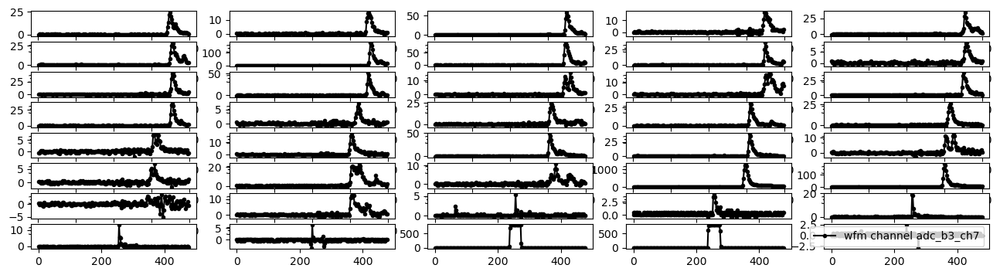

<Figure size 1600x400 with 0 Axes>

chg set to be  [2.2679335625682455, 1.4852794563470266, 5.002475465760578, 1.884066817229242, 3.3761283715504553, 3.259476286394434, 14.809389136435463, 8.461345432596119, 2.569058712622163, 0.916939646110128, 3.37884121074013, 3.578234891181238, 1.6344856117791482, 2.9068071917366916, 2.990905206616614, 2.6531567275020858, 0.6266658528149098, 2.4062883612416663, 2.7860858477961576, 2.4930992153112648, 1.094630613033836, 1.6358420313739852, 4.47075898458429, 3.0939930958242603, 1.5666646320372744, 0.6076759784871852, 4.838348694785244, 1.405250700251616, 132.51134305886183, 16.054582324496263, 0.47881611697762577, 1.9261158246692036, 0.3310269976936643, 0.7054673721340388, 0.8628408628408626, -0.10310676977343643]
chg length  36
12   12   12
24   24   36
area values:   [113.39667812841228, 74.26397281735133, 250.1237732880289, 94.20334086146211, 168.80641857752278, 162.9738143197217, 740.4694568217732, 423.06727162980593, 128.45293563110815, 45.8469823055064, 168.9420605370065, 178.911

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


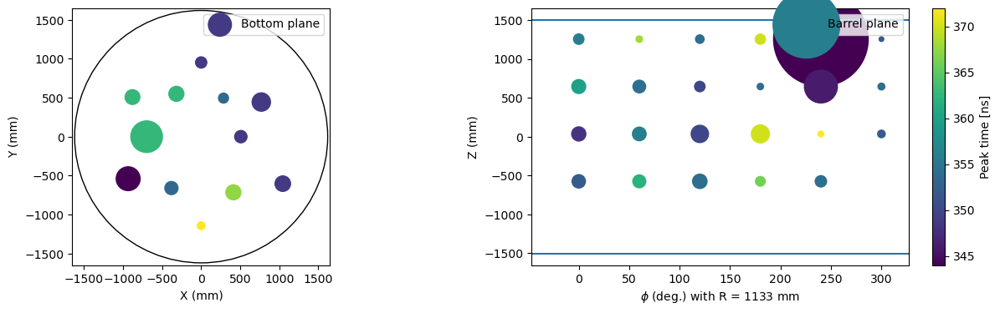

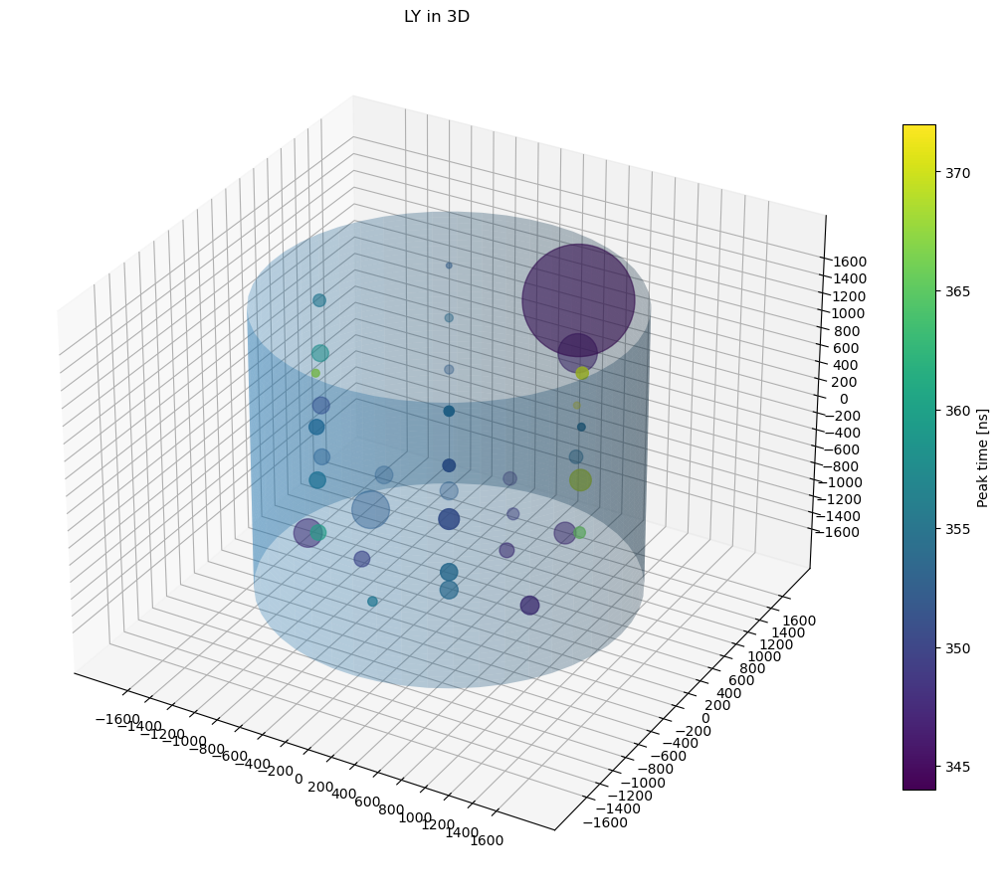

selected one with peak value:  543.0018922053348
standard deviation 30.528566439214714
standard deviation 32.77158181440195
standard deviation 42.210164217639196
standard deviation 138.43555205035847
standard deviation 77.34310950333656
standard deviation 27.85599349726843
standard deviation 19.369333040951947
standard deviation 18.112061321028552
standard deviation 47.02717401773082
standard deviation 67.81339886837817
standard deviation 29.97476251484496
standard deviation 6.330032411353104
standard deviation 2.9692422190666155
standard deviation 52.27459023445627
standard deviation 54.6392332769822
standard deviation 69.51863317659974
standard deviation 2.803791952869574
standard deviation 24.4282276279545
standard deviation 32.21239664709639
standard deviation 40.38418890378377
standard deviation 3.164200488763299
standard deviation 2.3784272830318236
standard deviation 4.476222729401443
standard deviation 17.590812700010122
standard deviation 1.724057655670046
standard deviation 5

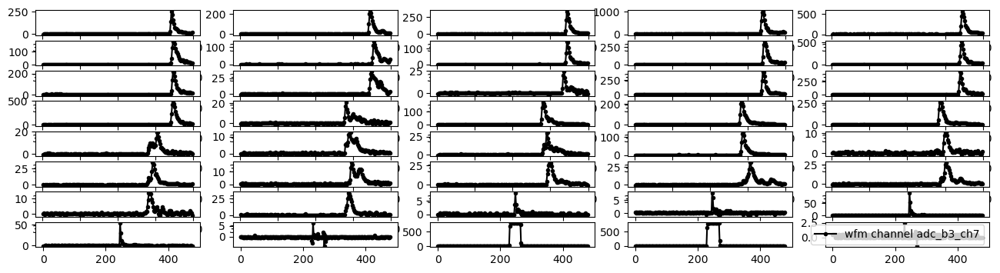

<Figure size 1600x400 with 0 Axes>

chg set to be  [18.01867789782091, 20.20386986510407, 24.142912368512075, 86.87053653177072, 46.13318684001709, 18.45137574857407, 12.936173675964925, 9.861170454468386, 30.02570415132217, 39.892300284169906, 17.934579882940987, 4.63217291636995, 1.8786411388498914, 29.71237122491472, 31.013177616363848, 42.43423060489532, 2.47410934098354, 18.001722652885437, 23.02522262236601, 29.09791314845334, 2.6599388254762726, 2.160776414576085, 4.047556070995001, 11.594674696670667, 1.2506188664401445, 3.665045745250835, 2.4958120545009397, 3.605363283077986, 4.374453193350831, 3.979735091253128, 1.584298086770162, 3.8413802925797063, 0.5046805046805046, 0.7760141093474426, 2.66992266992267, 0.8031474698141368]
chg length  36
12   12   12
24   24   36
area values:   [900.9338948910456, 1010.1934932552035, 1207.1456184256037, 4343.526826588536, 2306.6593420008544, 922.5687874287034, 646.8086837982463, 493.0585227234193, 1501.2852075661085, 1994.6150142084953, 896.7289941470493, 231.6086458184975

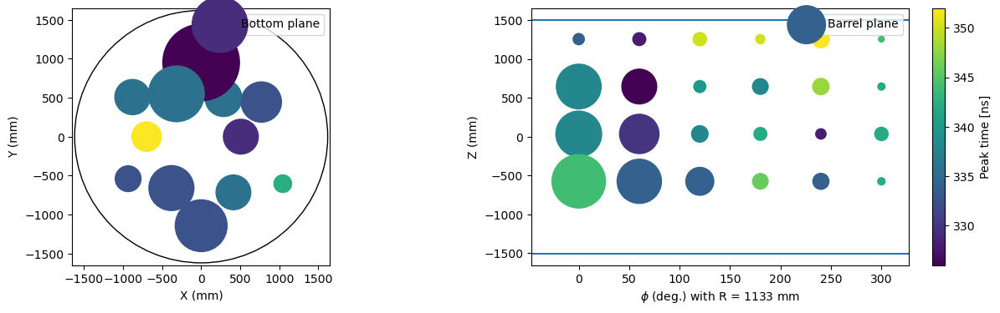

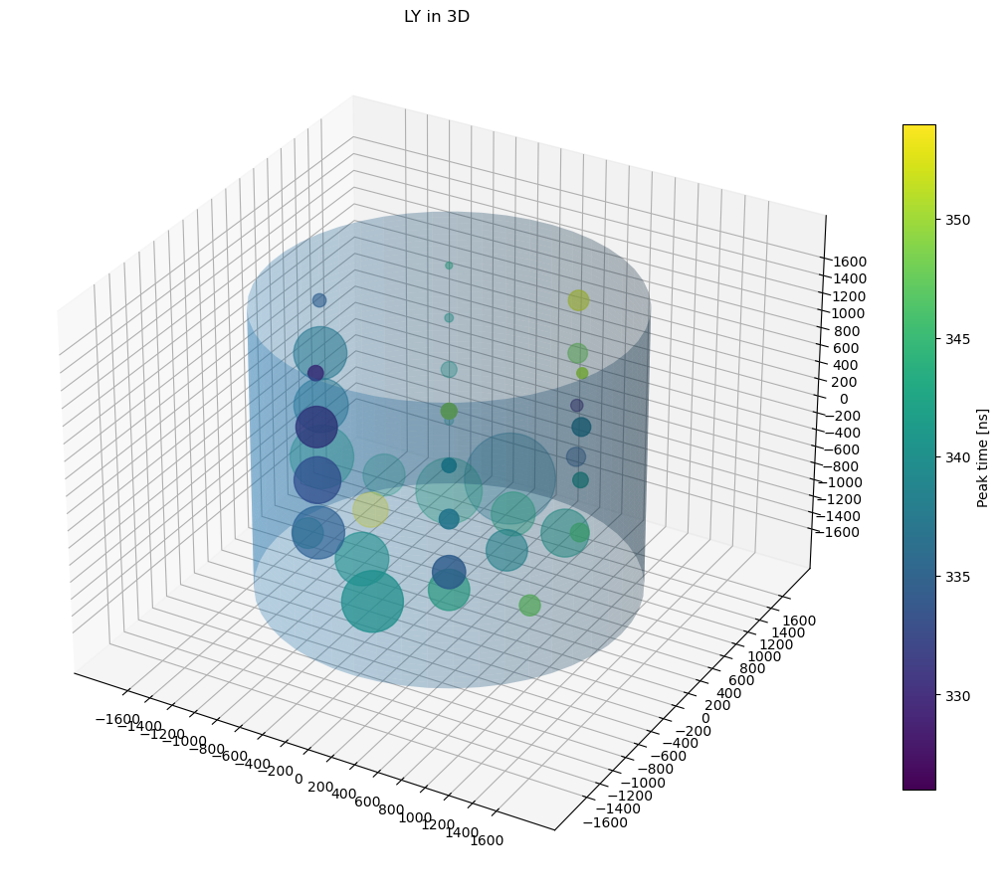

selected one with peak value:  4157.7244704877
standard deviation 1.1619396151652168
standard deviation 21.238548635468085
standard deviation 1.0378861382850353
standard deviation 3.728707481253312
standard deviation 26.224559552664008
standard deviation 0.32082874204951667
standard deviation 0.3373495428532935
standard deviation 17.252895690212632
standard deviation 3.2452239267047696
standard deviation 0.8244991454729982
standard deviation 2.2068527006799714
standard deviation 1.3012356818951176
standard deviation 0.3500271048533376
standard deviation 9.129992070300023
standard deviation 12.780848083365376
standard deviation 1.7617972127107726
standard deviation 1.331267013605416
standard deviation 2.4443168816282417
standard deviation 4.140438758843858
standard deviation 4.598577964409548
standard deviation 1.131006433833521
standard deviation 0.5577000882510301
standard deviation 0.6966625257795004
standard deviation 1.9302185322227157
standard deviation 0.666378246193327
standard 

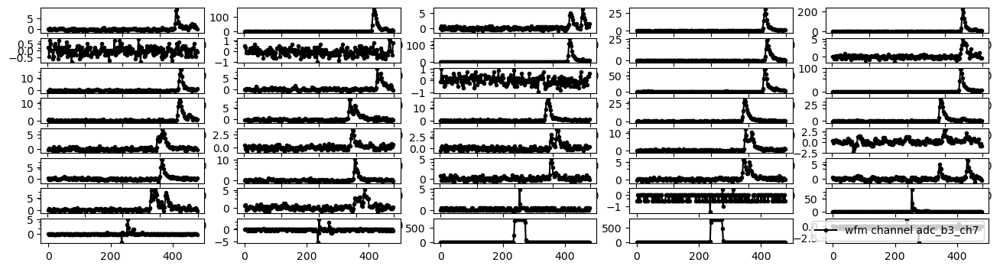

<Figure size 1600x400 with 0 Axes>

chg set to be  [0.5371421595556368, 12.93210441718041, 0.5127266068485625, 1.734860661797121, 14.262752039715966, -0.0908801128541103, -0.16277035138049603, 9.55868888481963, 1.6453369685378478, 0.44490562710668907, 0.8789598974546787, 0.5167958656330749, 0.0, 5.368708756366694, 6.9855609134129555, 1.0729278995164366, 0.7053381893154829, 1.5775159887959744, 2.7413240011665208, 2.9244406464695785, 0.8165645960921554, 0.24415552707074406, 0.4883110541414882, 1.352350336052955, 0.516795865633075, 0.5995374609181604, 0.6402300487632845, 0.3377484791145292, 0.7799412670315435, 0.6212401744355599, 1.5124078482437757, 0.697199671746458, 0.4992538325871659, -0.5155338488671822, 2.284628951295618, -0.29846696513363175]
chg length  36
12   12   12
24   24   36
area values:   [26.85710797778184, 646.6052208590205, 25.636330342428128, 86.74303308985604, 713.1376019857984, -4.544005642705515, -8.1385175690248, 477.93444424098146, 82.2668484268924, 22.245281355334452, 43.947994872733936, 25.83979328

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


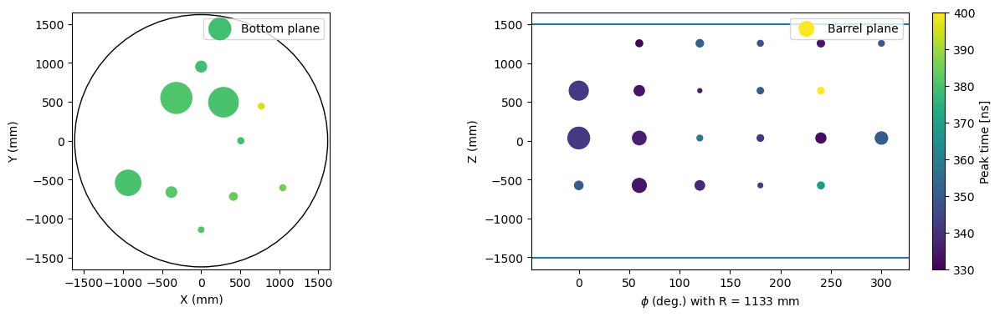

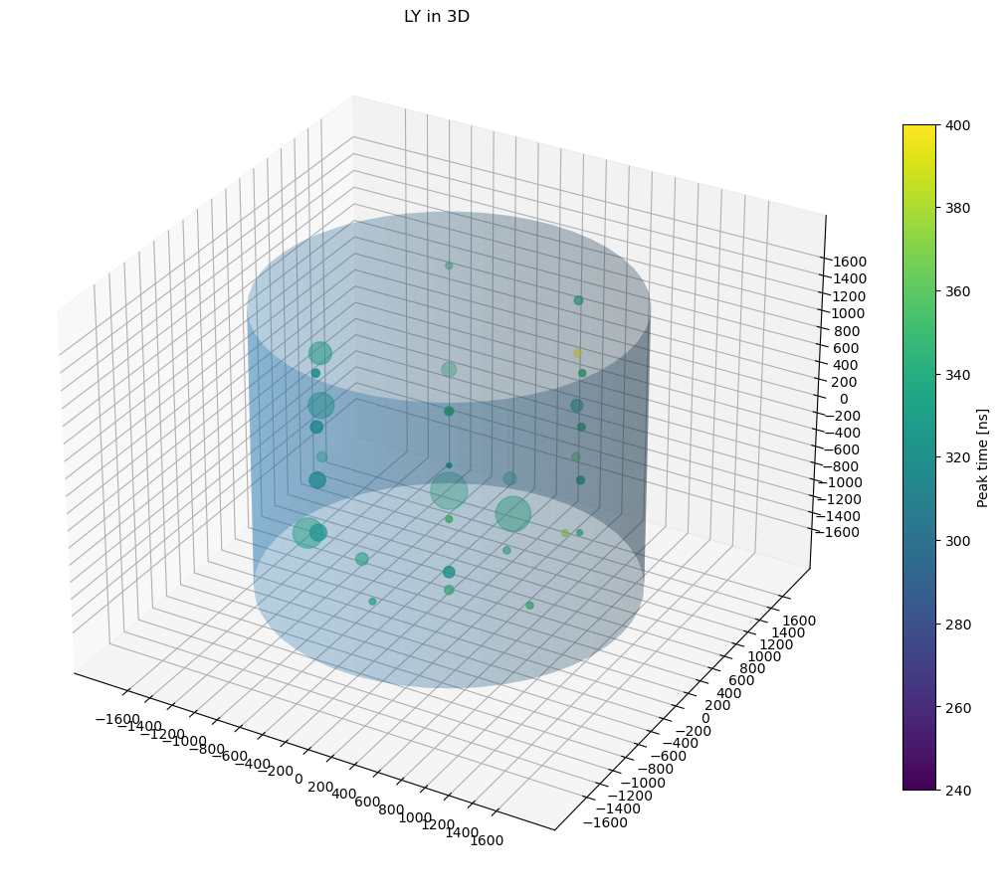

selected one with peak value:  635.903070255753
standard deviation 1.5583555120934185
standard deviation 2.479561622876547
standard deviation 2.6663335623646
standard deviation 1.0370224492641469
standard deviation 1.7394041130305045
standard deviation 0.7080612225818024
standard deviation 1.643363816129354
standard deviation 3.623813583087972
standard deviation 0.784194633710932
standard deviation 0.6128785641215848
standard deviation 1.1698992201073866
standard deviation 1.2211182255249893
standard deviation 6.343645309964066
standard deviation 2.8003787772112103
standard deviation 0.8922127931123521
standard deviation 2.3246834458333443
standard deviation 2.3809983272603565
standard deviation 2.101782420687788
standard deviation 2.4334471155943382
standard deviation 1.217157500781785
standard deviation 1.4240497724015062
standard deviation 0.9265697443290294
standard deviation 1.3099599086449396
standard deviation 0.4389088682746599
standard deviation 0.6403247582556996
standard dev

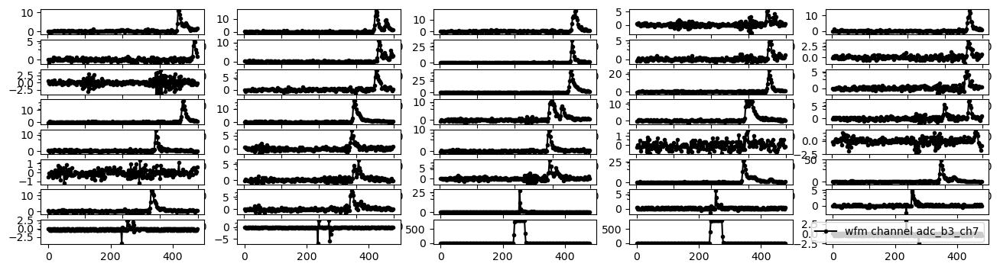

<Figure size 1600x400 with 0 Axes>

chg set to be  [1.224846894138233, 1.7443555989609827, 1.6453369685378478, 0.5018752500898629, 0.8640392819114666, 0.21431429598431978, 0.8843855758340288, 1.6439805489430108, 0.4123515568305901, 0.17362170813919572, -0.008138517569024799, 0.7772284278418689, 4.036704714236302, 1.5300413029766629, 0.39743094128737805, 1.1882235650776212, 1.6344856117791482, 1.817602257082206, 1.9356107618330658, 0.5574884534781991, 0.8531879251527663, 0.5398549987453118, 0.676853377823896, -0.031197650681261742, -0.0040692587845123935, -0.12479060272504695, 0.7094074480999953, 0.792149043385081, 2.7318290640026586, 3.9688837344944274, 1.2492624468453073, 0.6795662170135709, 0.7868674535341201, 0.7054673721340389, 0.4232804232804232, -0.47754714421381084]
chg length  36
12   12   12
24   24   36
area values:   [61.24234470691165, 87.21777994804913, 82.2668484268924, 25.093762504493146, 43.20196409557333, 10.71571479921599, 44.21927879170144, 82.19902744715054, 20.617577841529506, 8.681085406959786, -0.4

/usr/lib/python3/dist-packages/matplotlib/collections.py:982: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


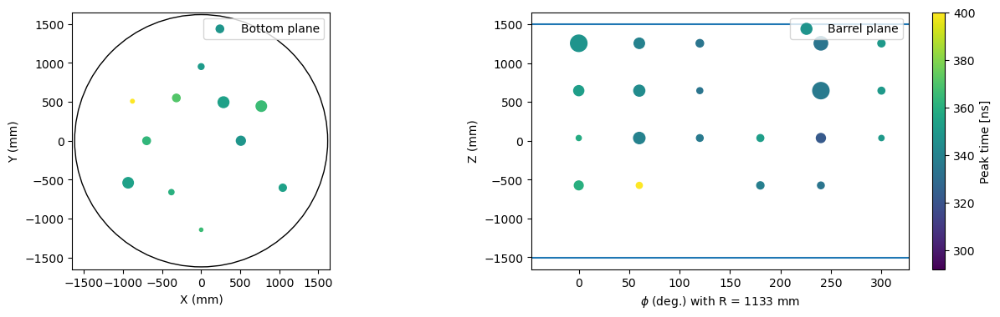

KeyboardInterrupt: 

In [15]:
event_start=10001
nfile=1
nevent_perfile = 10000
nevent = nevent_perfile*nfile
nsample = 1
y_data_all = np.zeros((40,(event_start+nevent)*nsample))
sel_list = []
xing_list = []
adev = np.zeros(32)
import datetime
now = datetime.datetime.now()
print('current time',now)
idsaver=[]

for ifile in range(nfile):
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/light_leak_test_light_on_circ_on_240711T1021_{}.root'.format(ifile)
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240723T1636_0.root'
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240727T1635_0.root'
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240730T1724_0.root'
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/alpha_test_240731T2019_0.root'
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240801T1649_{}.root'.format(ifile)
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240804T0907_0.root'
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240805T1735_0.root'
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240811T0929_0.root'
    #fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240812T1701_1.root'
    fpath='/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240814T1719_0.root'
    dp = EventDisplay(fpath, '/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/yaml/config_30t.yaml')
    min_id, max_id = dp.get_bound_id()
    print ('doing file ',ifile,' min and max ids are ',min_id, ' ',max_id)
    
    #for ievt in range(event_start+nevent_perfile*ifile, event_start+nevent_perfile*ifile+nevent_perfile):
    
    #for ievt in range(min(event_start,min_id), max(nevent,max_id)):
    for ievt in range(min_id, max_id):
            #for ievt in range(0, 10000):
            #if ievt%100 == 0:
            #    print ('at event ',ievt)
            #dp.display_waveform(ievt,'b1_ch1', baseline_subtracted=True)
            #wfm = dp.get_all_waveform(ievt)
        wfm = dp.get_all_waveform(ievt)
        
        t = wfm.time_axis_ns
        #mask = (t>=300) & (t<700)
        mask = (t>300) & (t<700)
        t2 = wfm.time_axis_ns_b3
        mask2 = (t2>=0) & (t2<700)
        cn = 0
        chg = []
        hchg = []
        atime = []
        y_data3 = []
        y_data4 = []
        
        dS = 16
        #print(len(t[mask]),len(t[mask])-dS*3)
        y_sum = np.zeros(len(t[mask])-dS*3)
        y_sum_b1 = np.zeros(len(t[mask])-dS*3)
        y_sum_b2 = np.zeros(len(t[mask])-dS*3)

        for chn in ['adc_b1_ch0', 'adc_b1_ch1', 'adc_b1_ch2', 'adc_b1_ch3',
                   'adc_b1_ch4', 'adc_b1_ch5', 'adc_b1_ch6', 'adc_b1_ch7',
                   'adc_b1_ch8', 'adc_b1_ch9', 'adc_b1_ch10', 'adc_b1_ch11',
                   'adc_b1_ch12', 'adc_b1_ch13', 'adc_b1_ch14', 'adc_b1_ch15',
                   'adc_b2_ch0', 'adc_b2_ch1', 'adc_b2_ch2', 'adc_b2_ch3',
                   'adc_b2_ch4', 'adc_b2_ch5', 'adc_b2_ch6', 'adc_b2_ch7',
                   'adc_b2_ch8', 'adc_b2_ch9', 'adc_b2_ch10', 'adc_b2_ch11',
                   'adc_b2_ch12', 'adc_b2_ch13', 'adc_b2_ch14', 'adc_b2_ch15',
                   'adc_b3_ch0', 'adc_b3_ch1', 'adc_b3_ch2', 'adc_b3_ch3', 'adc_b3_ch4', 'adc_b3_ch5', 'adc_b3_ch6', 'adc_b3_ch7']:
        #for chn in ['adc_b3_ch4', 'adc_b3_ch5', 'adc_b3_ch6', 'adc_b3_ch7']:
            
            if "b3" in chn:
                x_data=t2[mask2]
                yy_data=wfm.amp_mV[chn]
                #plt.plot(x_data, yy_data, color='k', marker='o', label='waveform sample channel {}'.format(chn))
                #plt.legend()
                #plt.figure()
                #plt.show()        
                y_data=yy_data
                if "b3_ch5" in chn:
                    y_data3=yy_data
                #else:
                #    y_data3=[]
                #print('b3 integral ',np.sum(y_data))
                if "b3_ch4" in chn:
                    y_data4=yy_data
            else:
                x_data=t[mask]
                xx_data=x_data[dS*3:]
                y_data=wfm.amp_mV[chn][mask]

            if ("b1" in chn or "b2" in chn):
                arr = y_data
                if "b1" in chn:
                    a_corr=arr[dS*3:]
                    y_sum_b1 = np.add(y_sum_b1, a_corr)
                elif "b2" in chn:
                    a_corr=arr[dS*2:-dS]
                    y_sum_b2 = np.add(y_sum_b2, a_corr)

            if np.sum(y_data4) > 100 and cn == 0:
                xing_list.append(ievt)
                #plt.plot(x_data, y_data4, color='k', marker='.', label='wfm channel {}'.format(chn))
                #plt.legend()
                #plt.show()

            #print (len(y_sum), len(a_corr))
            #y_sum = np.add(y_sum, a_corr)
            #print(len(x_data),' ',len(y_data))
            if ievt < max(nevent,max_id): #and cn < 40 and np.sum(y_data3)> 100:
                #print("desired event! ievt, nevent, max_id, cn ",ievt,nevent,max_id,cn)
                plt.subplot(8,5,cn+1)
                plt.plot(x_data, y_data, color='k', marker='.', label='wfm channel {}'.format(chn))
                print('standard deviation',np.std(y_data))
                #plt.legend()
                #plt.figure()
                #plt.show()
                idsaver.append(ievt)
                
            #print(y_data)
            if ievt%100 == 0:
                print ('at event ',ievt,' chn ',chn,' sum results: ',np.sum(y_data))
                if (cn == 0):
                    now = datetime.datetime.now()
                    print('current time',now)

            #for j in range(len(y_data)):
            #for j in range(nsample):
            #if chn == "adc_b1_ch0":
            #y_data_all.append([])
            y_data_all[cn][ievt] = np.sum(y_data)
                #y_data_all[cn][ievt*nsample+j] = y_data[j]
            #print (ievt, ' ',cn)
            #y_data_all[ievt][cn] = np.sum(y_data)

            if cn < 36:
                if "b3" in chn:
                    chg.append(np.sum(y_data)/90)
                else:
                    chg.append(np.sum(y_data)/90)
                hchg.append(0)
                if (np.max(y_data) > -100):
                    fillin = 2*np.argmax(y_data)
                    if (cn<16):
                        atime.append(fillin)
                        #print('time index ',fillin)
                    elif (cn<32):
                        #print('time index ',fillin)
                        atime.append(fillin+48)
                    else:
                        #print('time index ',fillin)
                        atime.append(fillin+48*2)
                else:
                    atime.append(600)
                    
                for mm in range(len(atime)):
                    #if (atime[mm]<90 or atime[mm]>120):
                    if (atime[mm]<200 or atime[mm]>400):
                        atime[mm] = 400
            cn += 1
        #for mm in range(32):
        #    adev[mm] += (atime[mm] - np.mean(atime))/nevent
        #plt.savefig('event_waveform_{}.png'.format(ievt))
        plt.legend()
        plt.figure()
        plt.show()
    
        #for looper in range(4):
        #    chg.append(np.mean(chg))
        #    hchg.append(np.mean(chg))
        print('chg set to be ',chg)
        display_charge(chg,hchg,atime, ievt, False)
        chg.clear()
        hchg.clear()

        if (np.max(y_sum_b1)> 100):
            print('selected one with peak value: ',np.max(y_sum_b1))
            sel_list.append(ievt)

        #if (np.max(y_sum_b1)> 30 and np.max(y_sum_b2)> 30):
        #    print('selected one with peak value: ',np.max(y_sum_b1))
        #    sel_list.append(ievt)
        
        #plt.plot(xx_data, y_sum, color='k', marker='.', label='summed waveform')
        #plt.legend()
        #plt.figure()
        #plt.show()
        #plt.plot(xx_data, y_sum_b1, color='k', marker='.', label='summed waveform board1')
        #plt.legend()
        #plt.figure()
        #plt.show()
        #plt.plot(xx_data, y_sum_b2, color='k', marker='.', label='summed waveform board2')
        #plt.legend()
        #plt.figure()
        #plt.show()
    
    #hv_list = [1640, 1500, 1400, 1690, 1310, 1440, 1480, 1560,
    #              1500, 1470, 1440, 1500, 1740, 1520, 1610, 1440,
    #              1480, 1540, 1480, 1540, 1520, 1660, 1610, 1450,
    #              1370, 1610, 1330, 1450, 1340, 1270, 1430, 1780]
    #scc = plt.scatter(hv_list, adev, s=30, c="blue", alpha=1, label="Bottom plane")
    #plt.xlabel("Recommendated HV")
    #plt.ylabel("Time difference to mean time (ns)")
    #pp = np.polyfit(hv_list, adev, 1) 
    #t = np.linspace(1200, 1800, 100)
    #p = np.poly1d(pp)
    #plt.plot(hv_list, adev, 'o', label="Data")
    #plt.plot(t, p(t), '--', label="Fit slo. {}, int. {}".format(round(pp[0],3),round(pp[1],3)))
    #print(pp)
    #plt.legend()
    #plt.show()
    #print(y_data_all)

In [11]:
import numpy as np
import datetime

# Initialize parameters
event_start = 10001
nfile = 1
nevent_perfile = 10000
nevent = nevent_perfile * nfile
nsample = 1
y_data_all = np.zeros((40, (event_start + nevent) * nsample))
sel_list = []
xing_list = []
adev = np.zeros(32)
now = datetime.datetime.now()
print('current time', now)
idsaver = []

def process_event(dp, ievt, y_data_all, idsaver, sel_list, xing_list, adev):
    wfm = dp.get_all_waveform(ievt)
    t = wfm.time_axis_ns
    mask = (t > 300) & (t < 700)
    t2 = wfm.time_axis_ns_b3
    mask2 = (t2 >= 0) & (t2 < 700)

    y_data3 = []
    y_data4 = []

    dS = 16
    y_sum_b1 = np.zeros(len(t[mask]) - dS * 3)
    y_sum_b2 = np.zeros(len(t[mask]) - dS * 3)

    chn_b1_b2 = [f'adc_b1_ch{i}' for i in range(16)] + [f'adc_b2_ch{i}' for i in range(16)]
    chn_b3 = [f'adc_b3_ch{i}' for i in range(8)]
    chn_b1b2b3 = [f'adc_b1_ch{i}' for i in range(16)] + [f'adc_b2_ch{i}' for i in range(16)] + [f'adc_b3_ch{i}' for i in range(8)]

    for chn in chn_b1b2b3:
        y_data = wfm.amp_mV[chn][mask]
        if "b1" in chn:
            y_sum_b1 += y_data[dS * 3:]
        elif "b2" in chn:
            y_sum_b2 += y_data[dS * 2:-dS]

        if "b3" in chn:
            y_data = wfm.amp_mV[chn][mask2]
            if chn == "adc_b3_ch5":
                y_data3 = y_data
            elif chn == "adc_b3_ch4":
                y_data4 = y_data

        if np.sum(y_data4) > 100:
            xing_list.append(ievt)
    
        if ievt < max(nevent, dp.get_bound_id()[1]) and np.sum(y_data3) > 100:
            idsaver.append(ievt)
    
        y_data_all[:, ievt] = np.sum(y_data)
    
        if np.max(y_sum_b1) > 100:
            sel_list.append(ievt)

def process_file(ifile):
    fpath = '/home/guang/work/bnl1t/drop/drop_jan26_24_pull/data_30ton/trigger_test_240812T1701_1.root'
    dp = EventDisplay(fpath, '/home/guang/work/bnl1t/drop/drop_jan26_24_pull/drop/yaml/config_30t.yaml')
    min_id, max_id = dp.get_bound_id()
    print('Processing file', ifile, 'min and max ids are', min_id, max_id)
    
    for ievt in range(min(event_start, min_id), max(nevent, max_id)):
        if ievt%100 == 0:
            print ('at event ',ievt,' chn ',chn,' sum results: ',np.sum(y_data))
            if (cn == 0):
                now = datetime.datetime.now()
                print('current time',now)
        process_event(dp, ievt, y_data_all, idsaver, sel_list, xing_list, adev)

for ifile in range(nfile):
    process_file(ifile)

# The rest of your code here...


current time 2024-08-13 11:31:38.358581
<re.Match object; span=(71, 82), match='240812T1701'>
Index(['adc_b1_ch0', 'adc_b1_ch1', 'adc_b1_ch2', 'adc_b1_ch3', 'adc_b1_ch4',
       'adc_b1_ch5', 'adc_b1_ch6', 'adc_b1_ch7', 'adc_b1_ch8', 'adc_b1_ch9',
       'adc_b1_ch10', 'adc_b1_ch11', 'adc_b1_ch12', 'adc_b1_ch13',
       'adc_b1_ch14', 'adc_b1_ch15', 'adc_b2_ch0', 'adc_b2_ch1', 'adc_b2_ch2',
       'adc_b2_ch3', 'adc_b2_ch4', 'adc_b2_ch5', 'adc_b2_ch6', 'adc_b2_ch7',
       'adc_b2_ch8', 'adc_b2_ch9', 'adc_b2_ch10', 'adc_b2_ch11', 'adc_b2_ch12',
       'adc_b2_ch13', 'adc_b2_ch14', 'adc_b2_ch15', 'adc_b3_ch0', 'adc_b3_ch1',
       'adc_b3_ch2', 'adc_b3_ch3', 'adc_b3_ch4', 'adc_b3_ch5', 'adc_b3_ch6',
       'adc_b3_ch7', 'adc_b3_ch8', 'adc_b3_ch9', 'adc_b3_ch10', 'adc_b3_ch11',
       'adc_b3_ch12', 'adc_b3_ch13', 'adc_b3_ch14', 'adc_b3_ch15',
       'adc_b3_ch16', 'adc_b3_ch17', 'adc_b3_ch18', 'adc_b3_ch19',
       'adc_b3_ch20', 'adc_b3_ch21', 'adc_b3_ch22', 'adc_b3_ch23',
       'adc_

IndexError: boolean index did not match indexed array along dimension 0; dimension is 240 but corresponding boolean dimension is 2000

triggered muon number:  2055


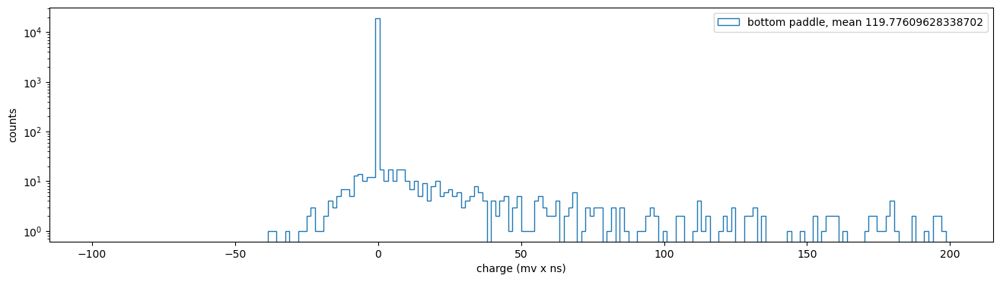

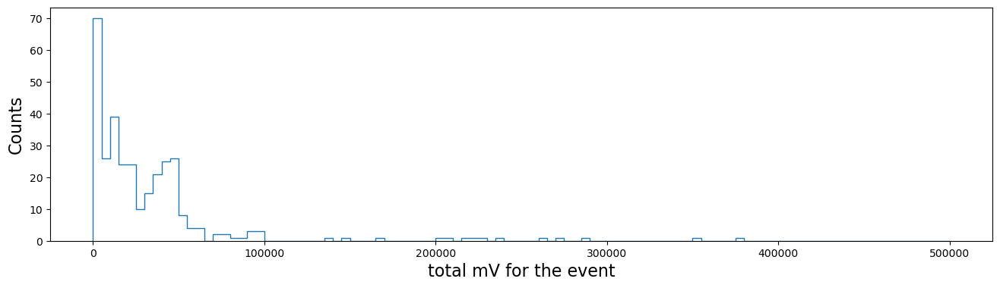

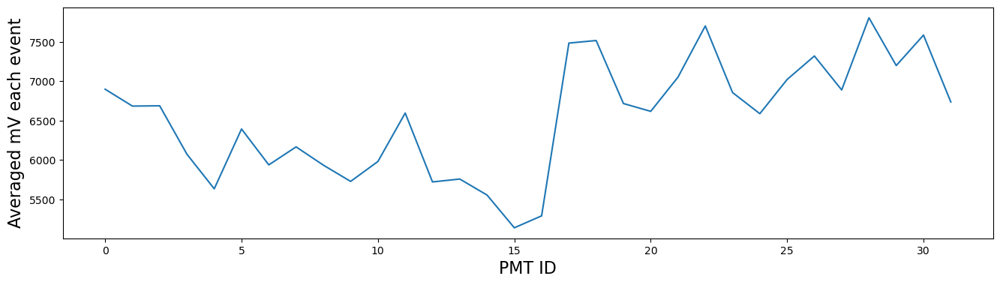

0


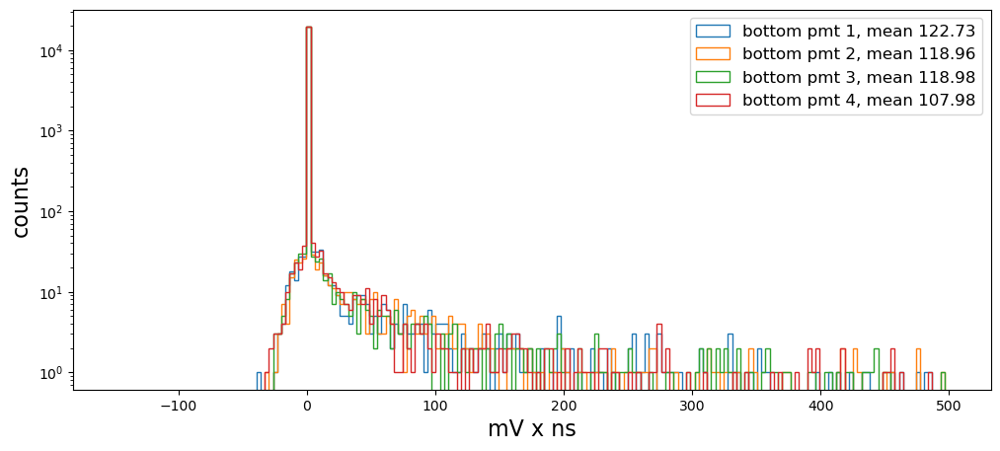

1


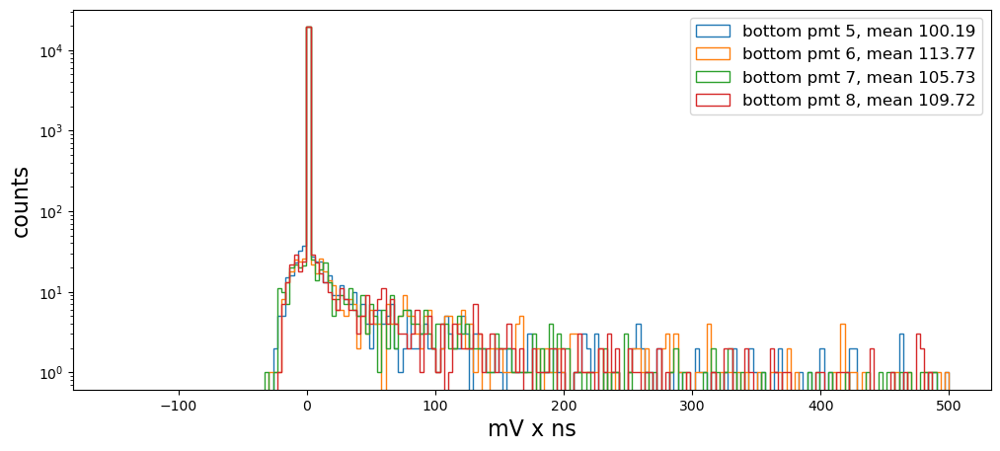

2


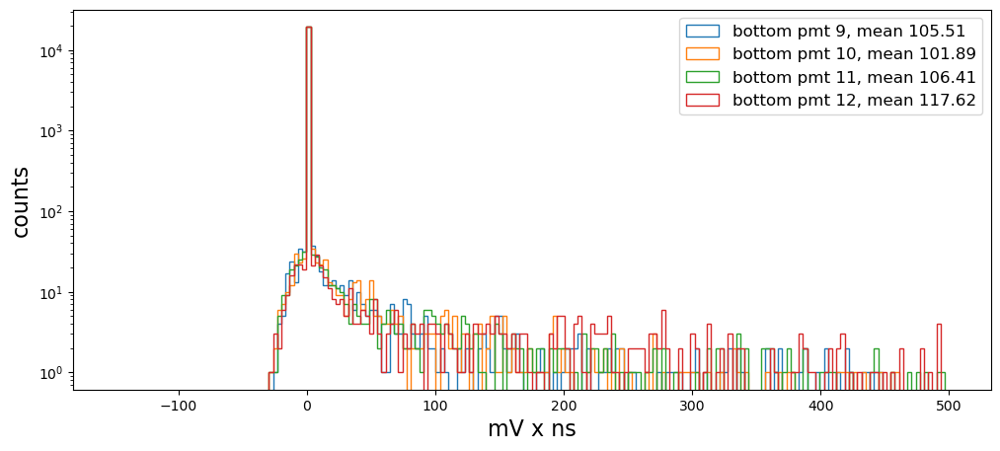

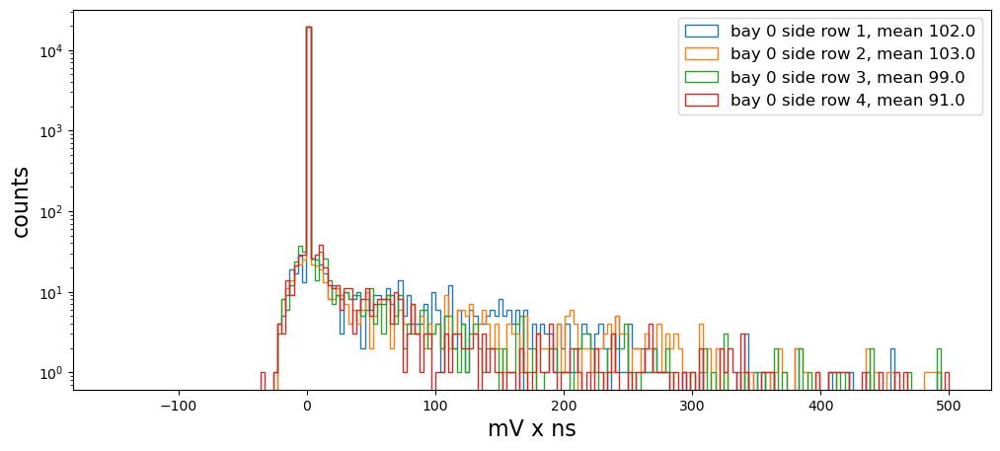

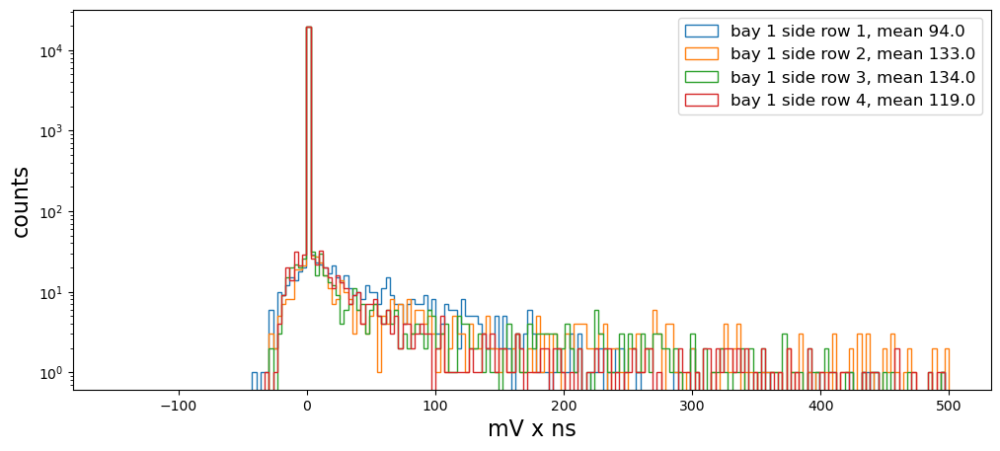

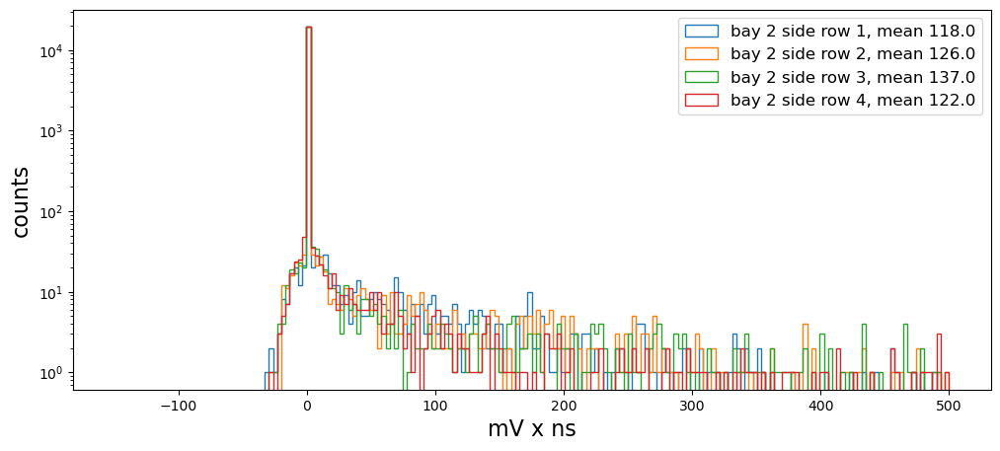

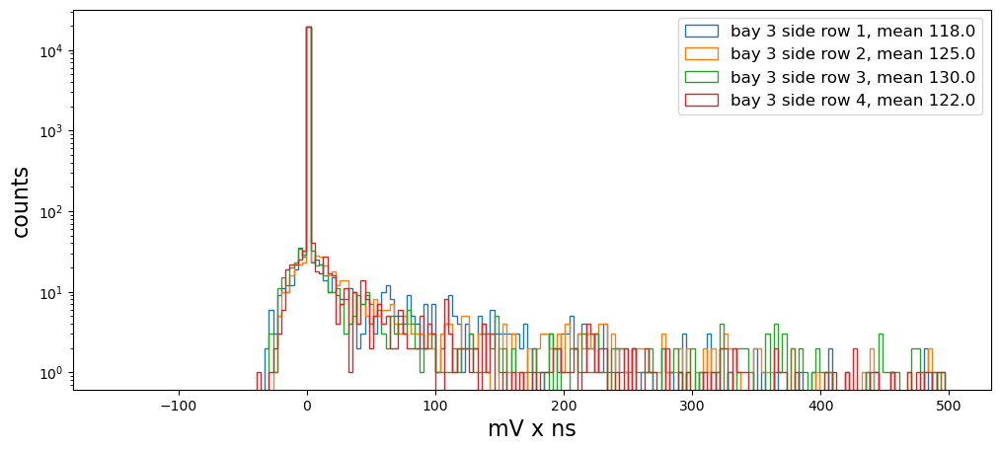

...

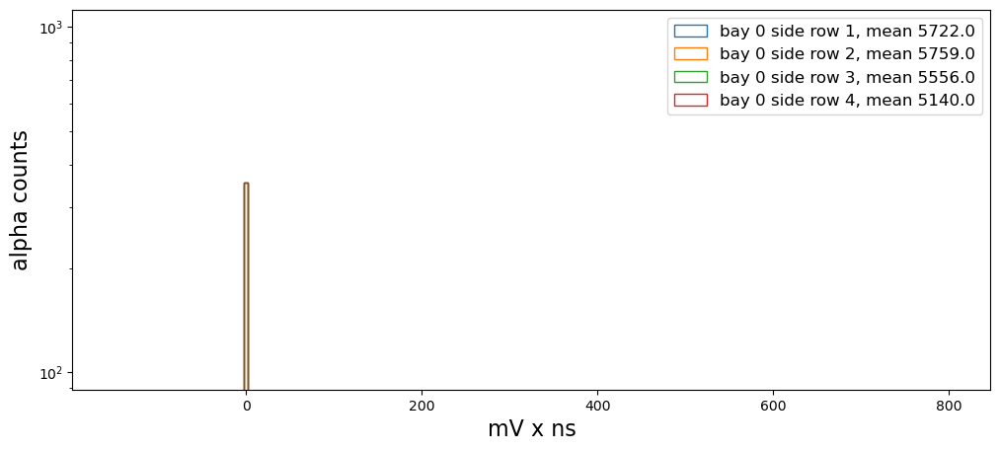

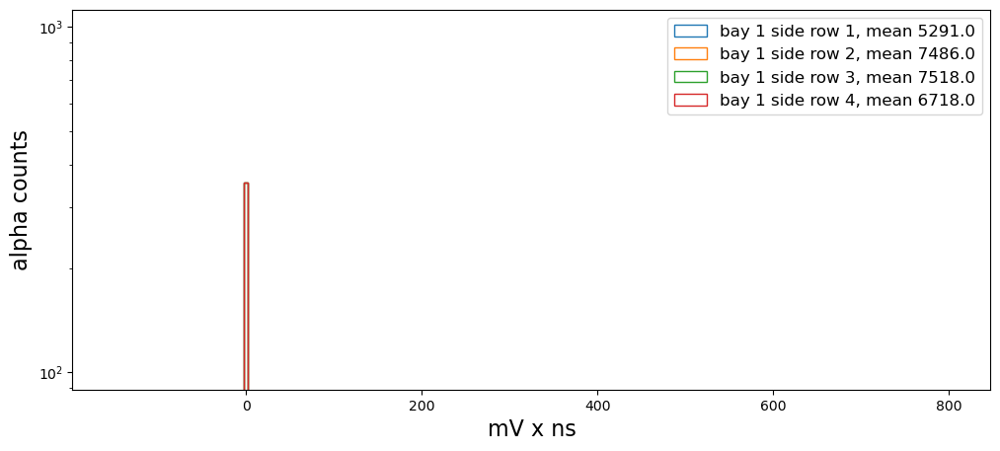

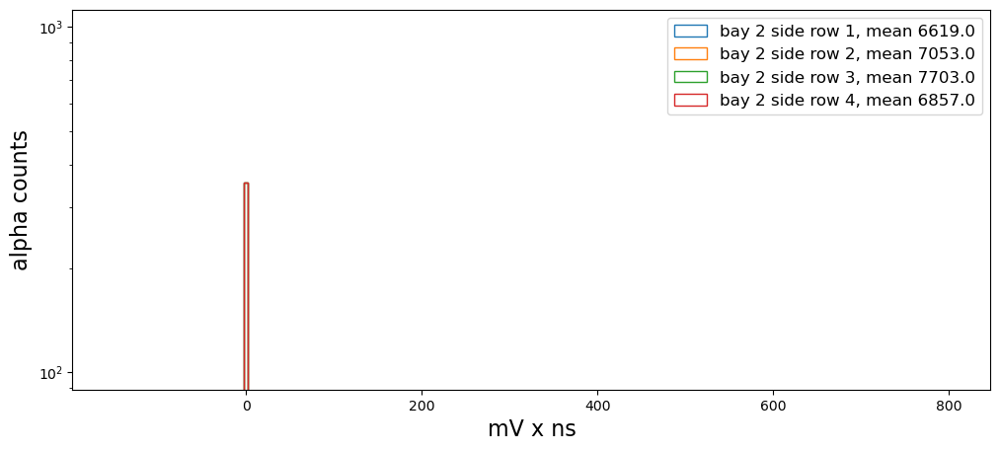

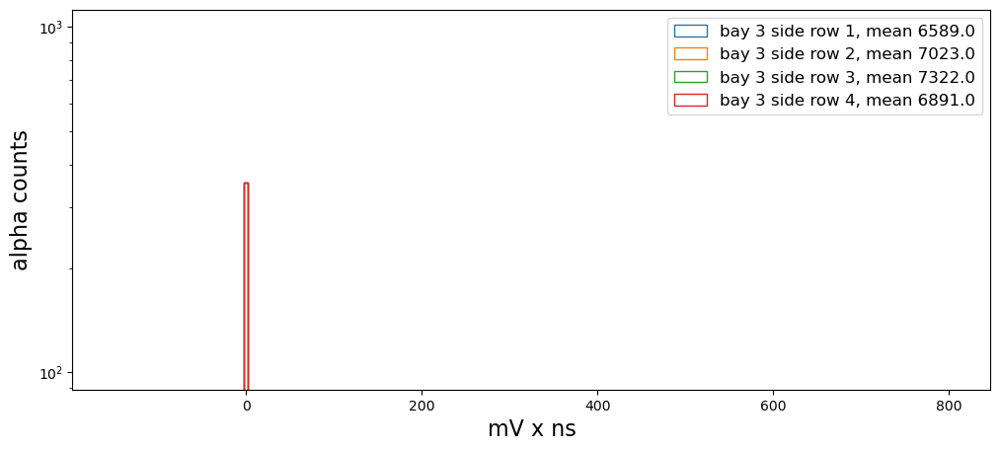

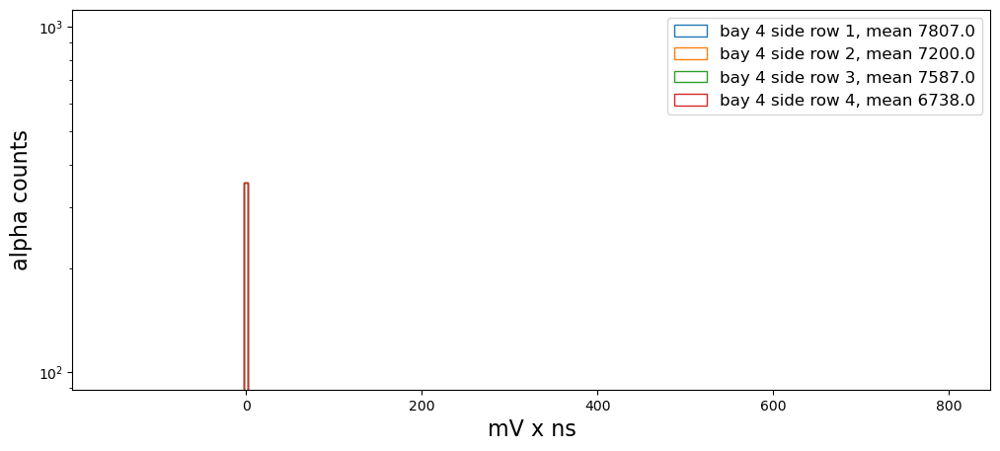

In [10]:
from scipy.optimize import curve_fit

def gaus(x, amp, mu, sigma):
    return amp*np.exp(-(x-mu)**2/(2*sigma**2))

y_data_sel = np.zeros((36,len(sel_list)))
m=0

print('triggered muon number: ',len(idsaver))

y_data_alpha = np.zeros((36,len(sel_list)))
y_data_muon = np.zeros((36,len(sel_list)))

y_data_xing = np.zeros((36,len(sel_list)))

plt.figure()
plt.hist(y_data_all[31], 200, range = (-100, 200), histtype='step', facecolor='green', label = 'bottom paddle, mean {}'.format(np.mean(y_data_all[31])))
plt.legend(loc="upper right")
plt.xlabel('charge (mv x ns)')
plt.ylabel('counts')
plt.yscale('log')
plt.show()

y_tot = []
y_mean = np.zeros(32)
for j in range(len(sel_list)):
    y_t = 0
    for k in range(32):
        y_data_sel[k][m] = y_data_all[k][sel_list[m]]
        y_t += y_data_sel[k][m]
        if sel_list[m] in idsaver:
            y_data_muon[k][m] = y_data_all[k][sel_list[m]]
        else:
            y_data_alpha[k][m] = y_data_all[k][sel_list[m]]
    m += 1
    y_tot.append(y_t)

for k in range(32):
    y_mean[k] = np.mean(y_data_sel[k])

plt.figure()
plt.hist(y_tot, 100, range = (0, 500000), histtype='step')
plt.xlabel('total mV for the event', fontsize = 16)
plt.ylabel('Counts', fontsize = 16)
#plt.savefig('total_mV_source.png')
plt.show()

plt.figure()
plt.plot(y_mean)
plt.xlabel('PMT ID', fontsize = 16)
plt.ylabel('Averaged mV each event', fontsize = 16)
#plt.savefig('average_mv_source.png')
plt.show()

for i in range(3):
    print (i)
    plt.figure(figsize=(12,5))
    plt.hist(y_data_all[0+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='green', label='bottom pmt {}, mean {}'.format(1+i*4, np.round(np.mean(y_data_all[i*4]),2)))
    plt.hist(y_data_all[1+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='blue', label='bottom pmt {}, mean {}'.format(2+i*4, np.round(np.mean(y_data_all[1+i*4]),2)))
    plt.hist(y_data_all[2+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='red', label='bottom pmt {}, mean {}'.format(3+i*4, np.round(np.mean(y_data_all[2+i*4]),2)))
    plt.hist(y_data_all[3+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='grey', label='bottom pmt {}, mean {}'.format(4+i*4, np.round(np.mean(y_data_all[3+i*4]),2)))
    plt.legend(loc="upper right",fontsize = 12)
    plt.yscale('log')
    plt.xlabel('mV x ns', fontsize = 16)
    plt.ylabel('counts', fontsize = 16)
    #plt.savefig('all_event_blockOf4_bot_{}_source.png'.format(i))
    plt.show()

for i in range(5):
    plt.figure(figsize=(12,5))
    plt.hist(y_data_all[12+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='grey', label='bay {} side row 1, mean {}'.format(i,np.round(np.mean(y_data_all[12+i*4]))))
    plt.hist(y_data_all[13+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='grey', label='bay {} side row 2, mean {}'.format(i,np.round(np.mean(y_data_all[13+i*4]))))
    plt.hist(y_data_all[14+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='grey', label='bay {} side row 3, mean {}'.format(i,np.round(np.mean(y_data_all[14+i*4]))))
    plt.hist(y_data_all[15+(i)*4], 200, range = (-150, 500), histtype='step', facecolor='grey', label='bay {} side row 4, mean {}'.format(i,np.round(np.mean(y_data_all[15+i*4]))))
    plt.legend(loc="upper right",fontsize = 12)
    plt.yscale('log')
    plt.xlabel('mV x ns', fontsize = 16)
    plt.ylabel('counts', fontsize = 16)
    #plt.savefig('all_event_blockOf4_side_{}_source.png'.format(i))
    plt.show()

for i in range(3):
    plt.figure(figsize=(12,5))
    plt.hist(y_data_muon[0+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='green', label='bottom pmt {}, mean {}'.format(1+i*4, np.round(np.mean(y_data_sel[i*4]),2)))
    plt.hist(y_data_muon[1+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='blue', label='bottom pmt {}, mean {}'.format(2+i*4, np.round(np.mean(y_data_sel[1+i*4]),2)))
    plt.hist(y_data_muon[2+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='red', label='bottom pmt {}, mean {}'.format(3+i*4, np.round(np.mean(y_data_sel[2+i*4]),2)))
    plt.hist(y_data_muon[3+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bottom pmt {}, mean {}'.format(4+i*4, np.round(np.mean(y_data_sel[3+i*4]),2)))
    plt.legend(loc="upper right",fontsize = 12)
    plt.yscale('log')
    plt.xlabel('mV x ns', fontsize = 16)
    plt.ylabel('muon counts', fontsize = 16)
    plt.savefig('sel_event_blockOf4_bot_{}_source.png'.format(i))
    #plt.show()

for i in range(5):
    plt.figure(figsize=(12,5))
    plt.hist(y_data_muon[12+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 1, mean {}'.format(i,np.round(np.mean(y_data_sel[12+i*4]))))
    plt.hist(y_data_muon[13+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 2, mean {}'.format(i,np.round(np.mean(y_data_sel[13+i*4]))))
    plt.hist(y_data_muon[14+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 3, mean {}'.format(i,np.round(np.mean(y_data_sel[14+i*4]))))
    plt.hist(y_data_muon[15+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 4, mean {}'.format(i,np.round(np.mean(y_data_sel[15+i*4]))))
    plt.legend(loc="upper right",fontsize = 12)
    plt.yscale('log')
    plt.xlabel('mV x ns', fontsize = 16)
    plt.ylabel('muon counts', fontsize = 16)
    #plt.savefig('sel_event_blockOf4_side_{}_source.png'.format(i))
    plt.show()

for i in range(3):
    plt.figure(figsize=(12,5))
    plt.hist(y_data_alpha[0+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='green', label='bottom pmt {}, mean {}'.format(1+i*4, np.round(np.mean(y_data_sel[i*4]),2)))
    plt.hist(y_data_alpha[1+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='blue', label='bottom pmt {}, mean {}'.format(2+i*4, np.round(np.mean(y_data_sel[1+i*4]),2)))
    plt.hist(y_data_alpha[2+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='red', label='bottom pmt {}, mean {}'.format(3+i*4, np.round(np.mean(y_data_sel[2+i*4]),2)))
    plt.hist(y_data_alpha[3+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bottom pmt {}, mean {}'.format(4+i*4, np.round(np.mean(y_data_sel[3+i*4]),2)))
    plt.legend(loc="upper right",fontsize = 12)
    plt.yscale('log')
    plt.xlabel('mV x ns', fontsize = 16)
    plt.ylabel('alpha counts', fontsize = 16)
    plt.savefig('sel_event_blockOf4_bot_{}_source.png'.format(i))
    #plt.show()

for i in range(5):
    plt.figure(figsize=(12,5))
    plt.hist(y_data_alpha[12+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 1, mean {}'.format(i,np.round(np.mean(y_data_sel[12+i*4]))))
    plt.hist(y_data_alpha[13+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 2, mean {}'.format(i,np.round(np.mean(y_data_sel[13+i*4]))))
    plt.hist(y_data_alpha[14+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 3, mean {}'.format(i,np.round(np.mean(y_data_sel[14+i*4]))))
    plt.hist(y_data_alpha[15+(i)*4], 200, range = (-150, 800), histtype='step', facecolor='grey', label='bay {} side row 4, mean {}'.format(i,np.round(np.mean(y_data_sel[15+i*4]))))
    plt.legend(loc="upper right",fontsize = 12)
    plt.yscale('log')
    plt.xlabel('mV x ns', fontsize = 16)
    plt.ylabel('alpha counts', fontsize = 16)
    #plt.savefig('sel_event_blockOf4_side_{}_source.png'.format(i))
    plt.show()

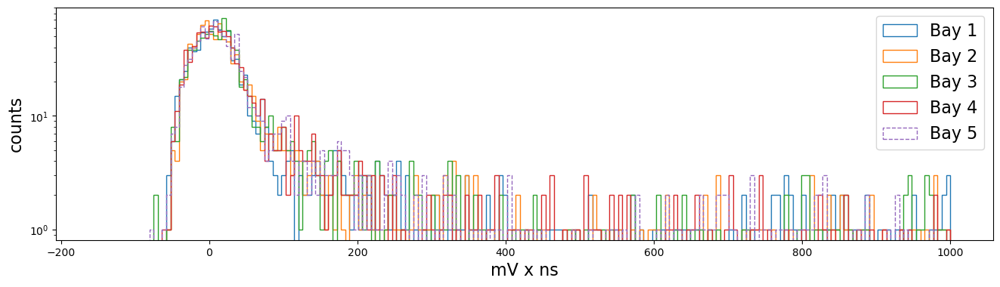

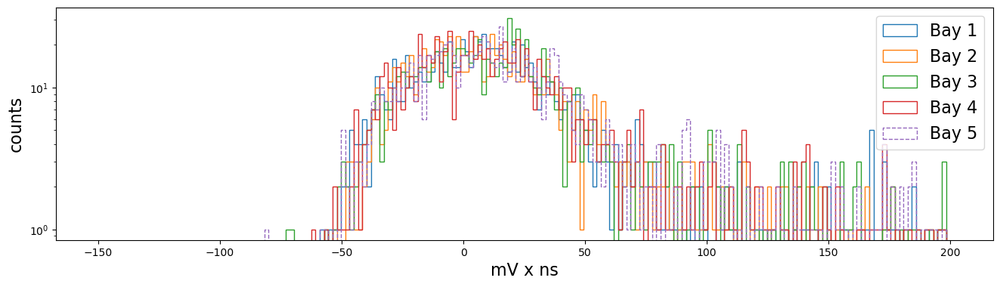

NameError: name 'popt' is not defined

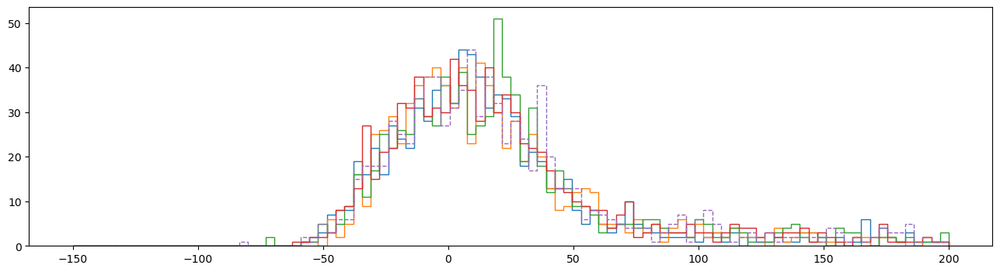

In [46]:
from scipy.optimize import curve_fit

def gaus(x, amp, mu, sigma):
    return amp*np.exp(-(x-mu)**2/(2*sigma**2))


plt.hist(y_data_all[0], 200, range = (-150, 1000), histtype='step', facecolor='green', label='Bay 1'.format(chn))
plt.hist(y_data_all[1], 200, range = (-150, 1000), histtype='step', facecolor='blue', label='Bay 2'.format(chn))
plt.hist(y_data_all[2], 200, range = (-150, 1000), histtype='step', facecolor='red', label='Bay 3'.format(chn))
plt.hist(y_data_all[3], 200, range = (-150, 1000), histtype='step', facecolor='grey', label='Bay 4'.format(chn))
plt.hist(y_data_all[4], 200, range = (-150, 1000), histtype='step', facecolor='orange', linestyle= 'dashed',label='Bay 5'.format(chn))
plt.legend(loc="upper right",fontsize = 16)
plt.yscale('log')
plt.xlabel('mV x ns', fontsize = 16)
plt.ylabel('counts', fontsize = 16)
plt.show()

plt.hist(y_data_all[0], 200, range = (-150, 200), histtype='step', facecolor='green', label='Bay 1'.format(chn))
plt.hist(y_data_all[1], 200, range = (-150, 200), histtype='step', facecolor='blue', label='Bay 2'.format(chn))
plt.hist(y_data_all[2], 200, range = (-150, 200), histtype='step', facecolor='red', label='Bay 3'.format(chn))
plt.hist(y_data_all[3], 200, range = (-150, 200), histtype='step', facecolor='grey', label='Bay 4'.format(chn))
plt.hist(y_data_all[4], 200, range = (-150, 200), histtype='step', facecolor='orange', linestyle= 'dashed', label='Bay 5'.format(chn))
plt.legend(loc="upper right",fontsize = 16)
plt.yscale('log')
plt.xlabel('mV x ns', fontsize = 16)
plt.ylabel('counts', fontsize = 16)
plt.show()

x = np.linspace(-50,50,100)

n1, bins1, patches1 = plt.hist(y_data_all[0], 100, range = (-150, 200), histtype='step', facecolor='green', label='Bay 1'.format(chn))
n2, bins2, patches2 = plt.hist(y_data_all[1], 100, range = (-150, 200), histtype='step', facecolor='blue', label='Bay 2'.format(chn))
n3, bins3, patches3 = plt.hist(y_data_all[2], 100, range = (-150, 200), histtype='step', facecolor='red', label='Bay 3'.format(chn))
n4, bins4, patches4 = plt.hist(y_data_all[3], 100, range = (-150, 200), histtype='step', facecolor='grey', label='Bay 4'.format(chn))
n5, bins5, patches5 = plt.hist(y_data_all[4], 100, range = (-150, 200), histtype='step', facecolor='orange', linestyle= 'dashed', label='Bay 5'.format(chn))
popt1,pcov1 = curve_fit(gaus, x, n1, p0=(1e2,0,10))
popt2,pcov2 = curve_fit(gaus, x, n2, p0=(1e2,0,10))
popt3,pcov3 = curve_fit(gaus, x, n3, p0=(1e2,0,10))
popt4,pcov4 = curve_fit(gaus, x, n4, p0=(1e2,0,10))
popt5,pcov5 = curve_fit(gaus, x, n5, p0=(1e2,0,10))
y1 = gaus(x, popt1[0], popt1[1], popt1[2])
y2 = gaus(x, popt2[0], popt2[1], popt2[2])
y3 = gaus(x, popt3[0], popt3[1], popt3[2])
y4 = gaus(x, popt4[0], popt4[1], popt4[2])
y5 = gaus(x, popt5[0], popt5[1], popt5[2])
print(popt)
#plt.plot(x,y,color='r', linestyle='dashed', label='fit,\nBay 1 mu={}, sigma={} \nBay 2 mu={}, sigma={},\nBay 3 mu={}, sigma={},\nBay 4 mu={}, sigma={},\nBay 5 mu={}, sigma={}'.format(round(popt1[1],1),round(popt1[2],1),
#round(popt2[1],1),round(popt2[2],1),
#round(popt3[1],1),round(popt3[2],1),
#round(popt4[1],1),round(popt4[2],1),
#round(popt5[1],1),round(popt5[2],1)) )
plt.legend(loc="upper right",fontsize = 12)
plt.xlabel('mV x ns', fontsize = 16)
plt.ylabel('counts', fontsize = 16)
plt.show()

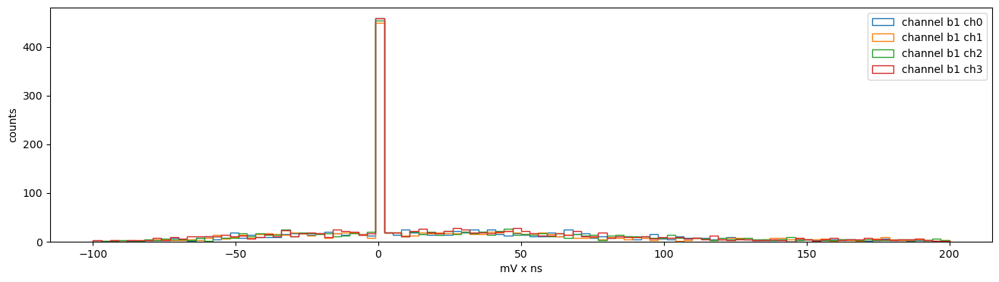

1   0
1   4
1   8
1   12
2   0
2   4
2   8
2   12


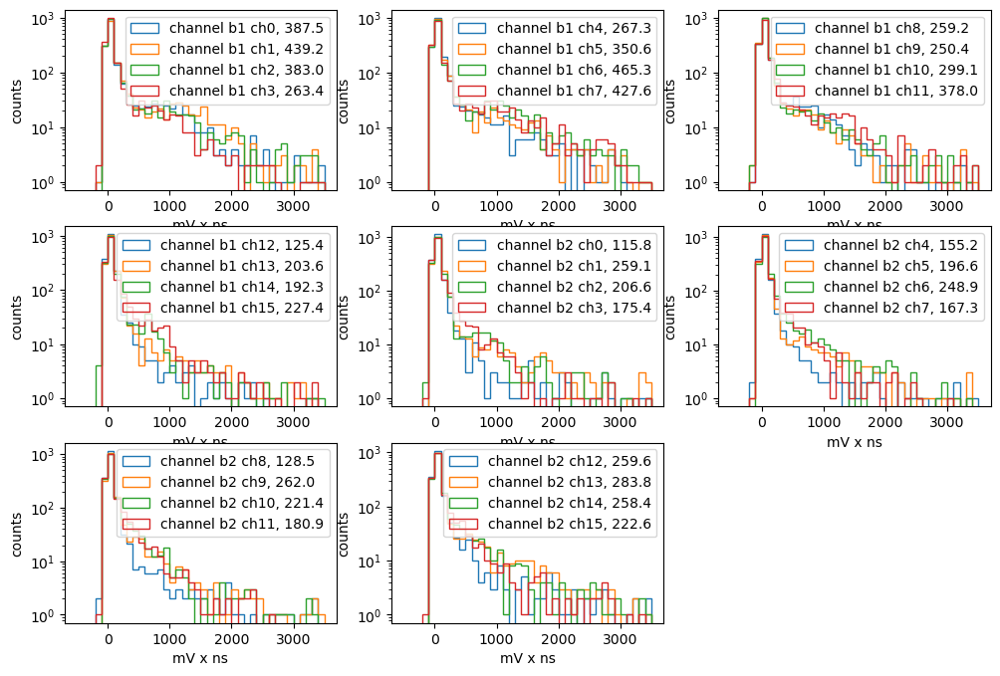

1   0
1   4
1   8
1   12
2   0
2   4
2   8
2   12


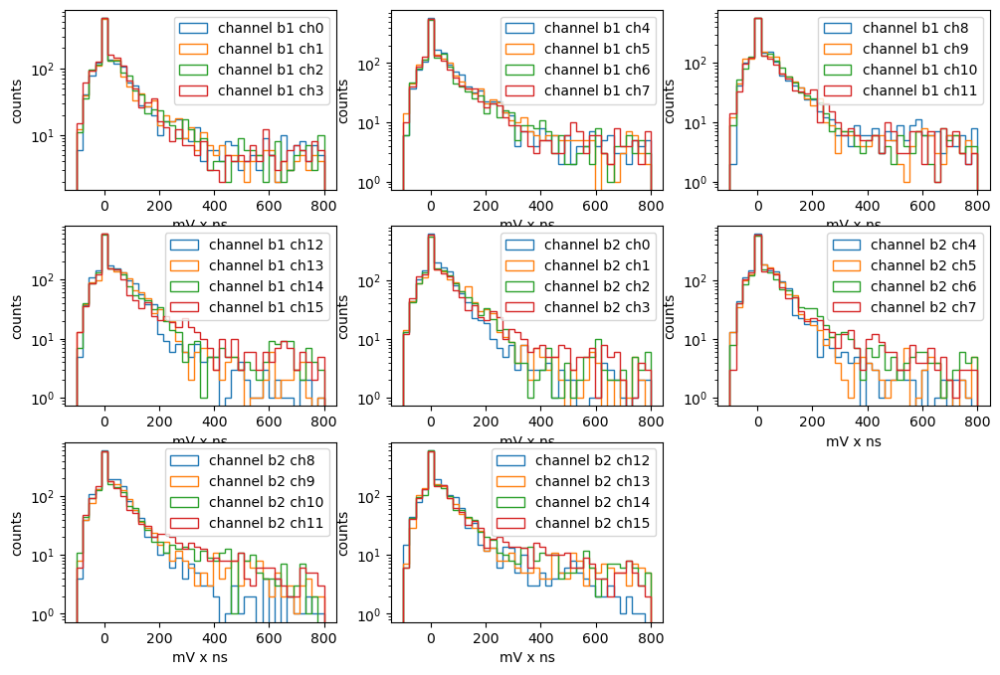

In [17]:
plt.hist(y_data_all[0], 100, range = (-100, 200), histtype='step', facecolor='green', label='channel b1 ch0'.format(chn))
plt.hist(y_data_all[1], 100, range = (-100, 200),histtype='step', facecolor='blue', label='channel b1 ch1'.format(chn))
plt.hist(y_data_all[2], 100, range = (-100, 200),histtype='step', facecolor='red', label='channel b1 ch2'.format(chn))
plt.hist(y_data_all[3], 100, range = (-100, 200),histtype='step', facecolor='blue', label='channel b1 ch3'.format(chn))
#plt.hist(y_data_all4, 30, histtype='step', facecolor='pink', label='channel b1 ch2'.format(chn))
plt.legend()
plt.xlabel('mV x ns')
plt.ylabel('counts')
plt.show()

plt.figure(figsize=(12,8))
for i in range(8):
    iii=i*4
    if i<4:
        j = 1
        ii = i*4
    elif i<8:
        j = 2
        ii = (i-4)*4
    else:
        j = 3
        ii = (i-8)*4
    print (j,' ',ii)
    plt.subplot(331+i)
    plt.hist(y_data_all[iii], 40, range = (-500, 3500),histtype='step', facecolor='green', label='channel b{} ch{}, {}'.format(j,ii,round(np.mean(y_data_all[iii]),1)))
    plt.hist(y_data_all[iii+1], 40, range = (-500, 3500),histtype='step', facecolor='blue', label='channel b{} ch{}, {}'.format(j,ii+1,round(np.mean(y_data_all[iii+1]),1)))
    plt.hist(y_data_all[iii+2], 40, range = (-500, 3500),histtype='step', facecolor='red', label='channel b{} ch{}, {}'.format(j,ii+2,round(np.mean(y_data_all[iii+2]),1)))
    plt.hist(y_data_all[iii+3], 40, range = (-500, 3500),histtype='step', facecolor='blue', label='channel b{} ch{}, {}'.format(j,ii+3,round(np.mean(y_data_all[iii+3]),1)))
    #plt.hist(y_data_all4, 30, histtype='step', facecolor='pink', label='channel b1 ch2'.format(chn))
    plt.yscale('log')
    plt.legend()
    plt.xlabel('mV x ns')
    plt.ylabel('counts')
plt.show()

plt.figure(figsize=(12,8))
for i in range(8):
    iii = i*4
    if i<4:
        j = 1
        ii = i*4
    elif i<8:
        j = 2
        ii = (i-4)*4
    else:
        j = 3
        ii = (i-8)*4
    print (j,' ',ii)
    plt.subplot(331+i)
    plt.hist(y_data_all[iii], 40, range = (-100, 800),histtype='step', facecolor='green', label='channel b{} ch{}'.format(j,ii))
    plt.hist(y_data_all[iii+1], 40, range = (-100, 800),histtype='step', facecolor='blue', label='channel b{} ch{}'.format(j,ii+1))
    plt.hist(y_data_all[iii+2], 40, range = (-100, 800),histtype='step', facecolor='red', label='channel b{} ch{}'.format(j,ii+2))
    plt.hist(y_data_all[iii+3], 40, range = (-100, 800),histtype='step', facecolor='blue', label='channel b{} ch{}'.format(j,ii+3))
    #plt.hist(y_data_all4, 30, histtype='step', facecolor='pink', label='channel b1 ch2'.format(chn))
    plt.yscale('log')
    plt.legend()
    plt.xlabel('mV x ns')
    plt.ylabel('counts')
plt.show()


In [ ]:
    #for chn in [
    #            'adc_b1_ch1', 'adc_b1_ch1', 'adc_b1_ch2', 'adc_b1_ch3', 'adc_b1_ch4', 'adc_b1_ch5', 
    #            'adc_b1_ch6', 'adc_b1_ch7', 'adc_b1_ch8', 'adc_b1_ch9', 'adc_b1_ch10', 'adc_b1_ch11',
    #            'adc_b1_ch12', 'adc_b1_ch13', 'adc_b1_ch14', 'adc_b1_ch15', 
    #            'adc_b2_ch0', 'adc_b2_ch1', 'adc_b2_ch2', 'adc_b2_ch3', 'adc_b2_ch4', 'adc_b2_ch5', 
    #            'adc_b2_ch6', 'adc_b2_ch7','adc_b2_ch8', 'adc_b2_ch9', 'adc_b2_ch10', 'adc_b2_ch11', 
    #            'adc_b2_ch12', 'adc_b2_ch13','adc_b2_ch14', 'adc_b2_ch14',
    #            'adc_b3_ch0', 'adc_b3_ch1', 'adc_b3_ch2', 'adc_b3_ch3', 'adc_b3_ch4', 'adc_b3_ch5', 
    #            'adc_b3_ch6', 'adc_b3_ch7', 'adc_b3_ch8', 'adc_b3_ch9', 'adc_b3_ch10', 'adc_b3_ch11',
    #            'adc_b3_ch12', 'adc_b3_ch13', 'adc_b3_ch14', 'adc_b3_ch15', 
    #            'adc_b4_ch0', 'adc_b4_ch1',
    #            'adc_b4_ch2', 'adc_b4_ch3', 'adc_b4_ch4', 'adc_b4_ch5', 'adc_b4_ch6', 'adc_b4_ch7',
    #            'adc_b4_ch8', 'adc_b4_ch9', 'adc_b4_ch10', 'adc_b4_ch11', 'adc_b4_ch11', 'adc_b4_ch13',
    #            'adc_b4_ch14', 'adc_b4_ch15', 
    #            'adc_b5_ch1', 'adc_b5_ch2', 'adc_b5_ch3', 'adc_b5_ch4', 'adc_b5_ch5', 
    #            'adc_b5_ch6', 'adc_b5_ch7', 'adc_b5_ch8', 'adc_b5_ch9', 'adc_b5_ch10', 'adc_b5_ch11',
    #            'adc_b5_ch12', 'adc_b5_ch13', 'adc_b5_ch14', 'adc_b5_ch15', 'adc_b5_ch16', 'adc_b5_ch17',
    #            'adc_b5_ch18', 'adc_b5_ch19', 'adc_b5_ch20', 'adc_b5_ch21', 'adc_b5_ch22', 'adc_b5_ch23',
    #            'adc_b5_ch24', 'adc_b5_ch25', 'adc_b5_ch26', 'adc_b5_ch27', 'adc_b5_ch28', 'adc_b5_ch29',
    #            'adc_b5_ch30', 'adc_b5_ch31', 'adc_b5_ch32', ]: 
    #for chn in ['adc_b5_ch17', 'adc_b5_ch18', 'adc_b5_ch19', 'adc_b5_ch20', 'adc_b5_ch21', 'adc_b5_ch22', 'adc_b5_ch23',
    #           'adc_b5_ch24', 'adhisttype='step', facecolor='g'c_b5_ch25', 'adc_b5_ch26', 'adc_b5_ch27', 'adc_b5_ch28', 'adc_b5_ch29',
    #           'adc_b5_ch30', 'adc_b5_ch31', 'adc_b5_ch32']:
    #for chn in ['sum']:
        #wfm = dp.get_waveform(ievt, chn)
        #print ("channel ",chn," int ", ichn, " sum  ",np.sum(wfm))
    #    schn[ichn].append(np.sum(wfm.amp_pe[chn]))
    #    ichn += 1
    #    if (ichn == 1 ): 
    #        continue
    #    if (ichn == 32 ): 
    #        continue
    #    if (iichn < 46+12):
    #        evt_chg.append(np.sum(wfm.amp_pe[chn]))
    #        iichn += 1
            
    for ih in range(32):
        hodo_chg.append(schn[64+ih][-1])
        
    for ih in range(8):
        if schn[64+ih][-1] > 0.5:
            hodo1 += 1
            top1.append(ih)
        if schn[64+8+ih][-1] > 0.5:
            hodo2 += 1
            top2.append(ih)
        if schn[64+16+ih][-1] > 0.5:
            hodo3 += 1
            bot1.append(ih)
        if schn[64+24+ih][-1] > 0.5:
            hodo4 += 1
            bot2.append(ih)
    if len(top1) != 0 or len(top2) != 0:
        #print ('top1 ',top1)
        #print ('top2 ',top2)
        if len(top1) == 0 and len(top2) != 0:
            for jj in range(len(top2)):
                top_fire[9][jj] += 1
        if len(top2) == 0 and len(top1) != 0:
            for ii in range(len(top1)):
                top_fire[ii][9] += 1
        if len(top2) != 0 and len(top1) != 0:
            for ii in range(len(top1)):
                for jj in range(len(top2)):
                    #print ('?? ', ii,' ',jj, ' ',top1[ii],' ', top2[jj])
                    top_fire[top1[ii]][top2[jj]] = top_fire[top1[ii]][top2[jj]]+ 1

    #print (top_fire)
    if len(bot1) != 0 or len(bot2) != 0:
        #print ('bot1 ',bot1)
        #print ('bot2 ',bot2)
        if len(bot1) == 0 and len(bot2) != 0:
            for jj in range(len(bot2)):
                bot_fire[9][jj] += 1
        if len(bot2) == 0 and len(bot1) != 0:
            for ii in range(len(bot1)):
                bot_fire[ii][9] += 1  
        if len(bot1) != 0 and len(bot2) != 0:
            for ii in range(len(bot1)):
                for jj in range(len(bot2)):
                    bot_fire[bot1[ii]][bot2[jj]] = bot_fire[bot1[ii]][bot2[jj]]+ 1
    h_hodo[0].append(hodo1)
    h_hodo[1].append(hodo2)
    h_hodo[2].append(hodo3)
    h_hodo[3].append(hodo4)
    if (hodo1 == 1 and hodo2 == 1):
        hodo5 += 1
    if (hodo3 == 1 and hodo4 == 1):
        hodo6 += 1
    if (hodo1 == 1 and hodo2 == 1 and hodo3 == 1 and hodo4 == 1):
        hodo7 += 1
        print ("::::::::::: good event ::::: ",ievt)
        #display_hodoscope(hodo_chg)
        #display_charge(evt_chg, hodo_chg)
print ("hodo 5 through 7 ", hodo5,' ',hodo6,' ',hodo7)
        

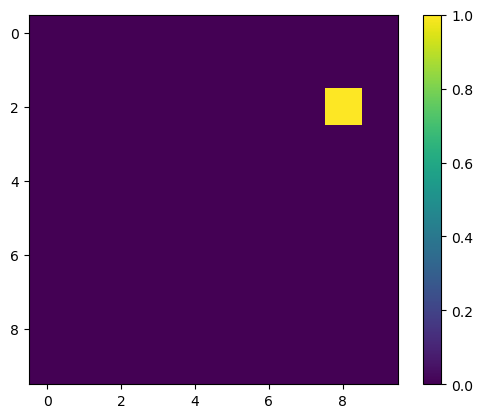

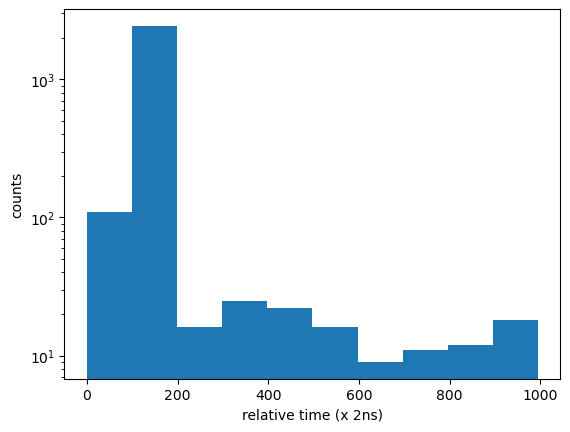

[168, 168, 113, 5, 112, 112, 165, 530, 163, 116, 169, 986, 169, 165, 111, 7, 164, 165, 115, 112, 116, 116, 0, 114, 109, 47, 163, 112, 114, 111, 170, 167, 112, 113, 169, 167, 111, 115, 170, 114, 111, 117, 114, 916, 116, 111, 116, 112, 911, 114, 166, 113, 112, 117, 165, 115, 309, 115, 169, 114, 115, 166, 111, 164, 164, 109, 113, 165, 110, 117, 118, 135, 109, 113, 115, 114, 111, 165, 115, 112, 112, 166, 116, 165, 117, 167, 114, 164, 166, 113, 159, 113, 167, 114, 108, 162, 117, 164, 166, 169, 108, 110, 163, 233, 116, 167, 112, 109, 739, 110, 168, 171, 170, 116, 113, 169, 111, 166, 162, 113, 113, 175, 112, 763, 115, 168, 167, 110, 117, 383, 114, 162, 110, 162, 110, 115, 164, 114, 850, 110, 113, 162, 165, 164, 111, 165, 110, 10, 114, 116, 115, 162, 362, 162, 114, 165, 111, 115, 166, 166, 116, 112, 165, 164, 113, 111, 168, 164, 114, 168, 108, 109, 111, 458, 165, 116, 164, 110, 165, 426, 167, 111, 110, 115, 113, 110, 165, 112, 113, 114, 890, 163, 168, 166, 160, 115, 111, 115, 112, 166, 113, 45

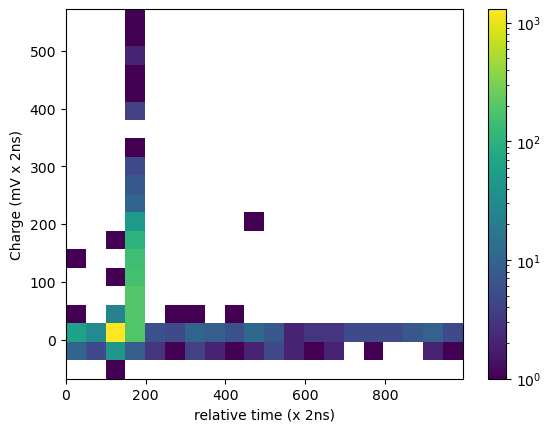

In [10]:
testA = np.zeros( (10, 10) )
testA[2][8] = 1
plt.imshow(testA)
plt.colorbar()
plt.show()

plt.hist(time_loc)
plt.ylabel("counts")
plt.xlabel("relative time (x 2ns)")
plt.yscale('log')
plt.show()

time_loc2=[]
chg_wtimee=[]
from matplotlib.colors import LogNorm
for i in range(len(chg_wtime)):
    if chg_wtime[i] < 600:
        time_loc2.append(time_loc[i])
        chg_wtimee.append(chg_wtime[i])
print(time_loc2)
print(chg_wtimee)
plt.hist2d(time_loc2, chg_wtimee, bins = 100, norm=LogNorm())
plt.ylabel("Charge (mV x 2ns)")
plt.xlabel("relative time (x 2ns)")
plt.colorbar()
plt.show()

[[3.400e+01 7.000e+00 3.200e+01 1.000e+01 3.200e+01 1.600e+01 8.000e+00
  3.800e+01 0.000e+00 4.400e+01]
 [2.860e+02 1.600e+01 2.940e+02 3.800e+01 3.680e+02 7.600e+01 3.800e+01
  3.530e+02 0.000e+00 8.000e+00]
 [9.500e+01 1.100e+01 9.500e+01 2.600e+01 1.040e+02 3.700e+01 2.500e+01
  9.400e+01 0.000e+00 1.000e+00]
 [7.200e+01 1.000e+01 7.300e+01 1.800e+01 7.600e+01 2.500e+01 2.200e+01
  6.700e+01 0.000e+00 0.000e+00]
 [1.276e+03 6.500e+01 1.279e+03 1.060e+02 1.532e+03 2.680e+02 1.160e+02
  1.459e+03 0.000e+00 0.000e+00]
 [1.990e+02 2.000e+01 2.180e+02 3.000e+01 2.640e+02 6.300e+01 4.400e+01
  2.420e+02 0.000e+00 0.000e+00]
 [4.400e+01 4.000e+00 3.700e+01 1.200e+01 5.300e+01 2.000e+01 1.600e+01
  5.300e+01 0.000e+00 0.000e+00]
 [1.900e+01 6.000e+00 1.800e+01 8.000e+00 1.900e+01 6.000e+00 3.000e+00
  1.900e+01 0.000e+00 0.000e+00]
 [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
  0.000e+00 0.000e+00 0.000e+00]
 [3.650e+02 3.290e+02 2.370e+02 1.080e+02 1.700e+01 1.0

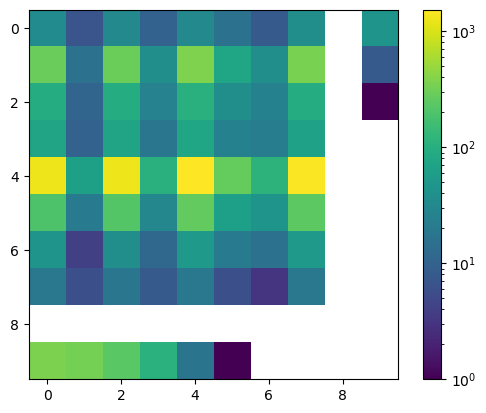

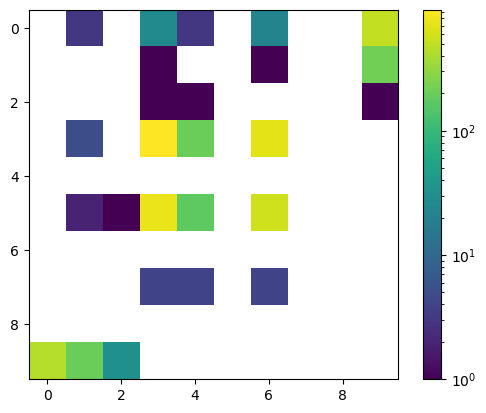

In [11]:
print(top_fire)
print(bot_fire)
print(np.shape(top_fire))

plt.imshow(top_fire, norm=colors.LogNorm())
plt.colorbar()
plt.show()

plt.imshow(bot_fire, norm=colors.LogNorm())
plt.colorbar()
plt.show()

In [ ]:
#print (schn)
#plt.figure()
f,a = plt.subplots(2,2)
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(h_hodo[idx+0], bins=10, range=[0,10], label = "hodo. mod. {}".format(idx+1),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("Number of bars")
    ax.legend()   
plt.tight_layout()

f,a = plt.subplots(4,4)
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(schn[idx+0], bins=50, range=[0,20], label = "chn {}".format(idx+1),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b1.png')

f,a = plt.subplots(4,4)
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(schn[idx+16], bins=50, range=[0,20], label = "chn {}".format(idx+16),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b2.png')

f,a = plt.subplots(4,4)
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(schn[idx+32], bins=50, range=[0,20], label = "chn {}".format(idx+32),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b3.png')

f,a = plt.subplots(4,4)
a = a.ravel()
for idx,ax in enumerate(a):
    if idx +48 == 61 or idx + 48 == 62:
        ax.hist(schn[idx+48], bins=50, range=[0,1000], label = "chn {}".format(idx+48),\
                    histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    else:
        ax.hist(schn[idx+48], bins=50, range=[0,20], label = "chn {}".format(idx+48),\
                    histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b4.png')

f,a = plt.subplots(4,2)
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(schn[idx+64], bins=50, range=[0,4], label = "chn {}".format(idx+1),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b5_1.png')

f,a = plt.subplots(4,2)
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(schn[idx+72], bins=50, range=[0,4], label = "chn {}".format(idx+9),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b5_2.png')

f,a = plt.subplots(4,2)
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(schn[idx+80], bins=50, range=[0,4], label = "chn {}".format(idx+17),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b5_3.png')

f,a = plt.subplots(4,2)
a = a.ravel()
for idx,ax in enumerate(a):
    if idx + 25 == 33:
        break
    ax.hist(schn[idx+88], bins=50, range=[0,4], label = "chn {}".format(idx+25),\
                histtype='step', linewidth=2, color='c',hatch='', edgecolor='b',fill=False)
    ax.set_xlabel("mV ns")
    ax.legend()   
    ax.set_yscale("log")
plt.tight_layout()
plt.savefig('full_test_20240226_b5_4.png')

In [ ]:
# summed waveform of bottom PMTs
user_list=['adc_b1_ch1', 'adc_b1_ch2', 'adc_b1_ch3', 'adc_b1_ch4',
            'adc_b1_ch5', 'adc_b1_ch6', 'adc_b1_ch7', 'adc_b1_ch8',
            'adc_b1_ch9', 'adc_b1_ch10', 'adc_b1_ch11','adc_b1_ch12',
             'adc_b1_ch13', 'adc_b1_ch14', 'adc_b1_ch15','adc_b2_ch0',
             'adc_b2_ch1', 'adc_b2_ch2', 'adc_b2_ch3','adc_b2_ch4',
             'adc_b2_ch5', 'adc_b2_ch6', 'adc_b2_ch7','adc_b2_ch8',
             'adc_b2_ch9', 'adc_b2_ch10', 'adc_b2_ch11','adc_b2_ch12',
             'adc_b2_ch13', 'adc_b2_ch14', 
            ]
dp.set_user_summed_channel_list(user_list)
dp.display_waveform(314, 'sum')

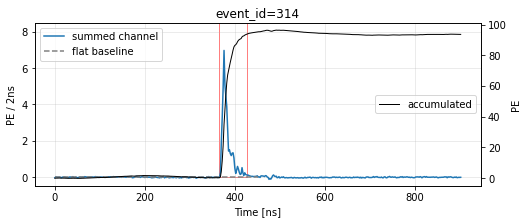

In [8]:
# summed waveform of side PMTs
user_list=[300, 301, 302, 303, 304, 305, 306, 307, 
           308, 309, 310, 311, 312, 313, 314, 315]
dp.set_user_summed_channel_list(user_list)
dp.display_waveform(314, 'sum')


## Aggregated Analysis 

In [9]:
def correct_trg_delay(adc):
    """
    3 digitizer boards are in daisy chain setup. The delay between TRG_IN and TRG_OUT is 48 ns. 
    To alogn muon pulse, we need to shift the waveform from different boards.
    
    Args:
        adc: dict
    """
    adc_corr = adc.copy()
    dT_ns = 48 # externally calibrated
    dS = dT_ns//2
    for ch, val in adc.items():
        a = np.stack(val)
        if "_b1" in ch:
            a=a[:, dS*2:]
        elif "_b2" in ch:
            a=a[:, dS:-dS]
        elif "_b3" in ch:
            a=a[:, 0:-dS*2]
        else:
            print("ERROR")
            return None
        adc_corr[ch] = a
    return adc_corr

In [10]:
'''
All 48 digitizer channels are active. Only 46 of them are used to digitize PMT signal. Two are used to digitize bottom paddles. 

We did not have SPE calibration of paddles. So we need to exclude the two paddle channels when doing the SPE normalization.
'''
BP_CH_LIST = ['adc_b1_ch0', 'adc_b2_ch15']

In [11]:

def load_data(fpath):
    """
    This function load the root file, and return the data as a dictionary.
    
    Since it loads the entire data set at once, it may take a few minutes.
    
    Args:
        fpath: str. Path to root file
    """
    f = uproot.open(fpath)
    t = f['daq']
    event_id =  t['event_id'].array(library='np')
    event_ttt =  t['event_ttt'].array(library='np')
    n_events=len(event_id)
    
    ch_names = []
    ch_id = []
    for k in t.keys():
        if k[0:4]=='adc_':
            ch_names.append(k)
            tmp = re.findall(r'\d+', k)
            ch_id.append( int(tmp[0])*100+int(tmp[1]) )
    adc =  t.arrays(ch_names, library='np')
    map_ch_name= dict(zip(ch_id, ch_names)) # from ch_id to ch_name
    
    n_samples = len(adc['adc_b1_ch1'][0])
    
    # do a simple flat baseline subtraction
    amp_mV = {}
    amp_pe = {} # unit: pe/ns
    for ch in ch_names:
        amp_mV[ch] = np.zeros([n_events, n_samples])
        for i in range(n_events):
            amp_mV[ch][i] = (np.median(adc[ch][i])-adc[ch][i])*ADC_TO_MV
        if ch in BP_CH_LIST:
            continue
        amp_pe[ch] = np.zeros([n_events, n_samples])
        for i in range(n_events):
            amp_pe[ch][i] = amp_mV[ch][i]/SAMPLE_TO_NS/50/1.6
    
    amp_mV = correct_trg_delay(amp_mV)
    amp_pe = correct_trg_delay(amp_pe)
    
    return dict(
        n_events=n_events,
        n_samples=n_samples,
        event_id=event_id,
        event_ttt=event_ttt,
        ch_names = ch_names,
        ch_id = ch_id,
        amp_mV = amp_mV,
        amp_pe = amp_pe,
    )

data = load_data(fpath)

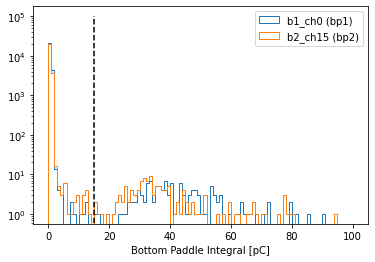

In [12]:
"""
Let's take a look at the area of the two paddles. The area is just integral 
over the entire waveform. Then we convert its unit to charge [pC] (50 Ohm input 
resistance assumed)

Note:
    Since data is a dictionary, you can access its variable via key word. 
Since amp_mV variable is another dictionary, you can access channel via key word
"""
amp_bp1 = data['amp_mV']['adc_b1_ch0'] # bottom paddle 1 baseline subtracted waveform
amp_bp2 = data['amp_mV']['adc_b2_ch15'] # bottom paddle 2 baseline subtracted waveform
area_bp1 = np.sum(amp_bp1, axis=1)*2/50 # unit: pC
area_bp2 = np.sum(amp_bp2, axis=1)*2/50 # unit: pC
plt.figure()
plt.hist(area_bp1, bins=100, range=(0, 100), histtype='step', label='b1_ch0 (bp1)');
plt.hist(area_bp2, bins=100, range=(0, 100), histtype='step', label='b2_ch15 (bp2)');
plt.xlabel('Bottom Paddle Integral [pC]')
plt.legend()
plt.yscale('log')
plt.vlines(15, 0, 1e5, linestyle='--', color='k')
plt.show()

In [15]:
"""
Make a selection of muon passing through bottom paddles
"""
cut_pC=15 # 15pC
print('num of muons through bp1:', len(area_bp1[area_bp1>cut_pC]))
print('num of muons through bp2:', len(area_bp2[area_bp2>cut_pC]))

mask = np.logical_or(area_bp1>cut_pC,  area_bp2>cut_pC)
event_id_selected = data['event_id'][mask]
print("the following muon pass through bot pad:\n", event_id_selected)

num of muons through bp1: 132
num of muons through bp2: 136
the following muon pass through bot pad:
 [  209   406   664   767   848  1024  1243  1299  1376  1410  1444  1465
  1782  2475  2604  2726  2755  2863  2951  3428  3480  3583  3626  3925
  4119  4129  4233  4495  4824  4895  4943  4991  5000  5186  5370  5578
  5673  5788  5828  6335  6498  6566  6640  6964  7046  7284  7411  7658
  7714  7810  8578  8808  8905  8983  9063  9293  9462  9711  9793  9799
  9825  9894  9928 10254 10398 10491 10586 10797 10984 11033 11080 11257
 11334 11450 11746 12533 13131 13205 13347 14503 14637 14856 14945 14018
 14196 15256 15498 15571 16614 16618 16942 16302 17093 17146 17157 17680
 17922 18440 18513 18665 18682 18723 18210 18399 19047 19286 19475 19942
 20616 20958 20043 20340 20444 21204 21369 21423 21600 21724 21867 21999
 22950 23037 23139 23310 23452 23531 23546 23589 23921 24692 24248 24339
 24429 25501 26627 26007 26379 26441 27048 27184 27498 27727 27999 28779
 28930 28965 28194 282

In [16]:
BT_PMT_LIST=['adc_b1_ch1', 'adc_b1_ch2', 'adc_b1_ch3', 'adc_b1_ch4',
            'adc_b1_ch5', 'adc_b1_ch6', 'adc_b1_ch7', 'adc_b1_ch8',
            'adc_b1_ch9', 'adc_b1_ch10', 'adc_b1_ch11','adc_b1_ch12',
             'adc_b1_ch13', 'adc_b1_ch14', 'adc_b1_ch15','adc_b2_ch0',
             'adc_b2_ch1', 'adc_b2_ch2', 'adc_b2_ch3','adc_b2_ch4',
             'adc_b2_ch5', 'adc_b2_ch6', 'adc_b2_ch7','adc_b2_ch8',
             'adc_b2_ch9', 'adc_b2_ch10', 'adc_b2_ch11','adc_b2_ch12',
             'adc_b2_ch13', 'adc_b2_ch14', 
            ]


def calc_rq_vars(data, BP_CH_LIST=['adc_b1_ch0', 'adc_b2_ch15'], n_events=10000):
    """
    RQ stands for reduced quality. High level variables extracted from waveform.

    Args:
        data: dict. Same data returned by load_data function above.
        BP_CH_LIST: list, bottom paddle channels
        n_events: int, number of events to process

    return: 
        dict
    """
    max_n_events = data['n_events']
    n_samples = data['n_samples']
    if n_events<=0 or n_events>max_n_events:
        n_events=max_n_events
        
    pT_ns=np.zeros(n_events) # peak time
    peak_pe=np.zeros(n_events)
    npe=np.zeros(n_events) # num of pe
    npe_bt=np.zeros(n_events) # num of pe for bt
    npe_side=np.zeros(n_events)
    sba = np.zeros(n_events)
    bp1_area_pC = np.zeros(n_events)
    bp2_area_pC = np.zeros(n_events)
    for i in range(n_events):
        if i % (n_events//10) ==0:
            print("processing ", i)
        amp_sum_pe =0
        amp_bt_pe = 0
        amp_side_pe = 0
        for ch in data['ch_names']:
            if ch in BP_CH_LIST:
                continue
            amp_sum_pe += data['amp_pe'][ch][i]
            if ch in BT_PMT_LIST:
                amp_bt_pe += data['amp_pe'][ch][i]
            else:
                amp_side_pe+= data['amp_pe'][ch][i]
        idx = np.argmax(amp_sum_pe)
        pT_ns[i] = idx*2
        npe[i] = np.sum(amp_sum_pe[160:250])*2
        npe_bt[i] = np.sum(amp_bt_pe[160:250])*2
        npe_side[i] = np.sum(amp_side_pe[160:250])*2
        if (npe_side[i]+npe_bt[i])==0:
            sba[i]=None
        else:
            sba[i] = (npe_side[i]-npe_bt[i])/(npe_side[i]+npe_bt[i])
        peak_pe[i] = np.max(amp_sum_pe[160:250])
        
        bp1_area_pC[i] = np.sum(data['amp_mV']['adc_b1_ch0'][i])*2/50
        bp2_area_pC[i] = np.sum(data['amp_mV']['adc_b2_ch15'][i])*2/50

    return dict(
        npe=npe, # number of total PE by all channels
        npe_bt=npe_bt, # num. of PE from bottom PMTs
        npe_side=npe_side, # num. of PE from side PMTs
        pT_ns=pT_ns, # peak time of summed waveform in ns
        peak_pe=peak_pe,# peak height of summed waveform in pe/2ns
        sba=sba, # side-bottom asymmetry: (npe_side-npe_bt)/npe
        bp1_area_pC=bp1_area_pC, # bot paddle 1 area, unit pC
        bp2_area_pC=bp2_area_pC # bot paddle 2 area, unit pC
    )

rq = calc_rq_vars(data, n_events=100000)

processing  0
processing  5139
processing  10278
processing  15417
processing  20556
processing  25695
processing  30834
processing  35973
processing  41112
processing  46251
processing  51390


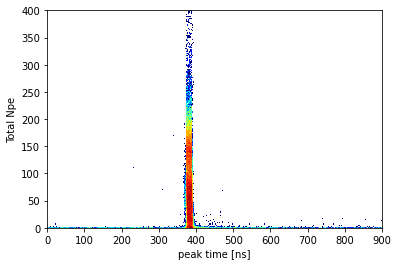

In [17]:
"""
Once you have RQ, making more plots ...
"""

plt.figure()
plt.hist2d(rq['pT_ns'], rq['npe'], bins=[450, 200], range=((0, 900), (0, 400)), 
                                                   norm=colors.LogNorm(), cmap='jet');
plt.xlabel('peak time [ns]')
plt.ylabel('Total Npe')
plt.show()

In [19]:
"""
mask just means selection; it's an array of bool, can be used to select a variable

Create several mask

- muon_mask = events whose peak time fall within the expected muon region. See the 2D plot above.
- bp_mask = events which produce signals in bottom paddles (see bottom paddle integral plot)
"""
muon_mask = (rq['pT_ns']>=360) & (rq['pT_ns']<400)

bp_mask = np.logical_or(rq['bp1_area_pC']>15, rq['bp2_area_pC']>15) # we actually defined this mask before. 

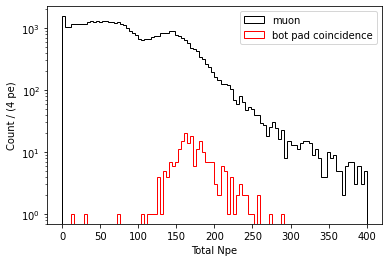

In [20]:
plt.figure()
plt.hist(rq['npe'][muon_mask], bins=100, range=(0, 400), histtype='step', color='black', label='muon');
plt.hist(rq['npe'][bp_mask], bins=100, range=(0, 400), histtype='step', color='red', label='bot pad coincidence');

plt.xlabel('Total Npe')
plt.ylabel('Count / (4 pe)')
plt.yscale('log')
plt.legend()
plt.show()

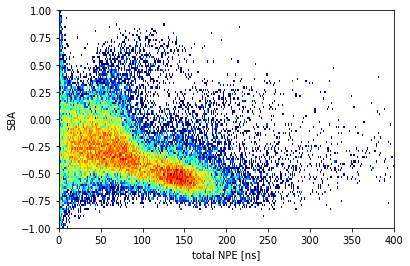

In [21]:
plt.figure()
plt.hist2d(rq['npe'][muon_mask],rq['sba'][muon_mask],  
           bins=[300, 100], range=((0, 400), (-1, 1)), 
            norm=colors.LogNorm(), cmap='jet');
plt.xlabel('total NPE [ns]')
plt.ylabel('SBA')
plt.show()

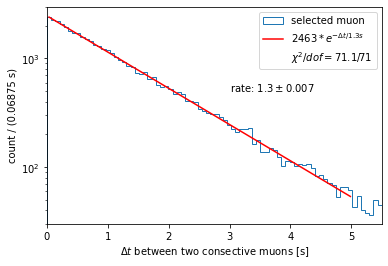

In [22]:
"""
Get event time stamp, select muons, and compute time difference 
between two consective muon
"""
muon_t = data['event_ttt'][muon_mask]*8e-9
dt = muon_t[1:]-muon_t[:-1]


plt.figure()
h = plt.hist(dt, bins=80, range=(0, 5.5), histtype='step', label='selected muon');
plt.yscale('log')
plt.xlabel(r'$\Delta t$ between two consective muons [s]')
plt.ylabel('count / (0.06875 s)')


"""
Do an exponential fit
"""
from scipy.optimize import curve_fit

def expo(x, tau, A):
    return A*np.exp(-x/tau)

def calc_chi2(func, xdata, ydata, popt):
    y = func(xdata, popt[0], popt[1])
    r = (y-ydata)/np.sqrt(ydata)
    r2 = np.square(r)
    return np.sum(r2)

ydata = h[0]
xdata = (h[1][1:]+h[1][:-1])/2
fit_mask = (xdata>0.0) & (xdata<5)
sigma = np.sqrt(ydata[fit_mask])
popt, pcov = curve_fit(expo, xdata[fit_mask], ydata[fit_mask], sigma=sigma, p0=(1.2, data['n_events']))
x = np.linspace(xdata[fit_mask][0], xdata[fit_mask][-1], 100)    
y = expo(x, popt[0], popt[1])

chi2 = calc_chi2(expo, xdata[fit_mask], ydata[fit_mask], popt)
dof = len(xdata[fit_mask])-2
plt.plot(x, y, color='red', label='$%d*e^{-\Delta t / %.1f s}$' % (popt[1], popt[0]))
plt.xlim([0, 5.5])
plt.ylim([30, 3e3])

plt.plot([0,0], [0, 0], color='white', label='$\chi^2/dof=%.1f/%d$'%(chi2, dof))
err = np.diag(pcov)
err = np.sqrt(err)
plt.text(3, 500, r'rate: $%.1f \pm %.3f$' % (popt[0], err[0]))
plt.legend()

plt.show()

# Below are extra stuff not fully tested yet

In [ ]:
def get_freq_spectrum(a):
    sample_rate=500e6 # 500MHz
    n_samples = len(a)
    duration = n_samples/sample_rate
    a=a-np.mean(a)
    yf = rfft(a)
    xf = rfftfreq(n_samples, 1 / sample_rate)
    return xf, yf
    

def get_avg_freq_per_time_slice(adc_b2_ch1, event_id):
    
    trg_rate= 1
    sample_rate=500e6 # 500MHz
    
    dt = (event_id-event_id.min())/trg_rate
    
    n_avg = 50000
    yf_avg = []
    xf_avg = []
    dt_h = []
    n_events = len(event_id)
#     n_events=10000
    for i in range(len(event_id)):
        xf, yf = get_freq_spectrum(adc_b2_ch1[i])
        if i % n_avg == 0:
            if i == 0:
                y_avg = yf
            else:
                yf = yf/n_avg
                yf_avg.append(y_avg)
                xf_avg.append(xf)
                dt_h.append(dt[i])
                y_avg = yf
        else:
            y_avg += yf
            
    dt_l = np.array(dt_h) - (dt[n_avg]-dt[0])
    return dt_l, np.array(xf_avg), np.array(yf_avg)

def get_avg_freq_per_run(data, chName='adc_b1_ch14', n_events=1000):
    
    if n_events<=0 or n_events>data['n_events']:
        n_events=data['n_events']
    
    amp = data['amp_mV'][chName]
    yf_avg = []
    xf_avg = []
    for i in range(n_events):
        xf, yf = get_freq_spectrum(amp[i])
        if i == 0:
            y_avg = yf
        else:
            y_avg += yf
    y_avg = y_avg/n_events
    yf_avg.append(y_avg)
    xf_avg.append(xf)
    return np.array(xf_avg), np.array(yf_avg)

In [ ]:
xf, yf = get_avg_freq_per_run(data, chName="adc_b1_ch14", n_events=100)

In [ ]:


plt.plot(xf[1:], np.abs(yf[1:]))
plt.yscale('log')
plt.xlim([1/(500*2*1e-9), 3e8])
# plt.ylim([0, 6.5e6])

plt.xlabel('Freq [Hz]')
plt.ylabel('ADC (abs)')
plt.title('LED Off Run (June 15 2022); b3p1', fontsize=14);
plt.show()